In [1]:
import sys
sys.path.append("/auto/homes/fav25/jax/")

import jax.numpy as np
# import autograd.numpy
# import numpy as np

from SC_IPFP.sde_solvers_time import solve_sde_RK
from SC_IPFP.utils import log_kde_pdf_per_point, silvermans_rule

from jax.config import config
from jax import jit, grad, random
from jax.experimental import optimizers
from jax.experimental import stax
from jax.experimental.stax import Dense, Relu, LogSoftmax, Sigmoid, Tanh
import numpy.random as npr
import jax
from tqdm.notebook import tqdm



import itertools
from functools import partial
# np = jax.numpy
import matplotlib.pyplot as plt
# np = autograd.numpy

/auto/homes/fav25/jax/jax/lib/xla_bridge.py:116: UserWarning: No GPU/TPU found, falling back to CPU.
  warnings.warn('No GPU/TPU found, falling back to CPU.')


In [2]:
## X = np.arange(500).reshape(50, 10) * 1.0

# theta = np.eye(10,10) * 1.0

# def f(theta, X):
#     out = X.dot(theta)
#     return out

# def divergence(f, theta_, X_):

#     def my_div(f_):
#         jac = jax.jacrev(f_, 1)
#         return lambda t, x_: np.trace(jac(t, x_))

#     div  = ((jax.vmap(my_div(f), in_axes=(None, 0)) (theta_, X_ )))
#     return div
    
# print(divergence(f, theta, X).shape)

In [3]:
class cIPFP(object):
    
    def __init__(self, X_0, X_1, weights=[100], batch_size=None,  rng = jax.random.PRNGKey(100), rng_b = jax.random.PRNGKey(10), 
                nrng = npr.RandomState(0), number_time_steps=16, sde_solver=solve_sde_RK, sigma_sq=1, 
                step_size = 0.001, num_epochs = 10, momentum_mass = 0.9, create_network=None):
        
        self.sde_solver = sde_solver
        
        self.number_time_steps = number_time_steps
        self.dt = 1.0 / number_time_steps
        
        
        self.batch_size_f = X_0.shape[0] if batch_size is None else batch_size
        self.batch_size_b = X_1.shape[0] if batch_size is None else batch_size
        
        
        self.X_0 = X_0
        self.X_1 = X_1
        
        self.H_0 = silvermans_rule(X_0)
        self.H_1 = silvermans_rule(X_1)
        
        _, self.dim = self.X_0.shape
        
        create_net = self.create_network if  create_network is None else create_network
        
        self.b_forward_init, self.b_forward = create_net(
            self.dim, weights
        )
        self.b_backward_init, self.b_backward = create_net(
            self.dim, weights
        )
        
        self.sigma = (lambda X,t: sigma_sq)
        
        self.rng = rng
        self.rng_b = rng_b
        self.nrng = nrng
        
        self.opt_init_f, self.opt_update_f, self.get_params_f = (
            optimizers.adam(step_size) #, mass=momentum_mass)
        )
        
        self.opt_init_b, self.opt_update_b, self.get_params_b = (
            optimizers.adam(step_size) #, mass=momentum_mass)
        )
        
        num_complete_batches_f, leftover_f = divmod(self.X_0.shape[0], self.batch_size_f)
        self.num_batches_f = num_complete_batches_f + bool(leftover_f)
                                               
        num_complete_batches_b, leftover_b = divmod(self.X_1.shape[0], self.batch_size_b)
        self.num_batches_b = num_complete_batches_b + bool(leftover_b)
        
        self.theta_f = None
        self.theta_b = None
        
        self.b_backward_ = jax.vmap(self.b_backward, in_axes=(None, 0))
        self.b_forward_ = jax.vmap(self.b_forward, in_axes=(None, 0))
        
        self.b_backward_s =  lambda theta, x: np.squeeze(self.b_backward(x, theta))
        self.b_forward_s = lambda theta, x: np.squeeze(self.b_forward(x, theta))
        
        self.div_backward_ = jax.vmap(partial(self.divergence, self.b_backward), in_axes=(None, 0))
        self.div_forward_ = jax.vmap(partial(self.divergence, self.b_forward), in_axes=(None, 0))
        
        self.first_iter_fac = 0.0
        
    @staticmethod
    def divergence(f, theta_, X_):

        def my_div(f_):
            jac = jax.jacrev(f_, 1)
            return lambda t, x_: np.trace(jac(t, x_))

        div  = ((jax.vmap(my_div(f), in_axes=(None, 0)) (theta_, X_ )))
        return div
    
    @staticmethod
    def create_network(dim, weights):
        
        model  = []
        for weight in weights:
            model.append(
                Dense(weight)
            )
                        
            model.append(
                Relu
            )
            
        
        model.append(Dense(dim))
    
        init_random_params, predict = stax.serial(
           *model
        )
        return init_random_params, predict
    
    def data_stream(self, forward=True):
        rng = self.nrng
        X = self.X_0 if forward else self.X_1
        
        batch_size = self.batch_size_f if forward else self.batch_size_b
        num_batches = self.num_batches_f if forward else self.num_batches_b
        
        num_train = self.X_0.shape[0] if forward else self.X_1.shape[0]
        while True:
            perm = rng.permutation(num_train)
            for i in range(num_batches):
                batch_idx = perm[i * batch_size:(i + 1) * batch_size]
                yield X[batch_idx] 
        
#     @partial(jit, static_argnums=(0,3))
    def loss_for_trajectory(self, Xt, theta, W, forwards):
        n_, *_ = Xt.shape
        
        if not forwards : Xt = Xt[: , ::-1, :]
        
        if forwards:
            b_minus  = self.b_backward_(self.theta_b, Xt) 
            b_plus = self.b_forward_(theta, Xt)
            div = self.div_backward_(self.theta_b, Xt) 
        else:
            b_minus  = self.b_backward_(theta, Xt)
            b_plus = self.b_forward_(self.theta_f, Xt) * self.first_iter_fac 
            div = -self.div_forward_(self.theta_f, Xt) * self.first_iter_fac 
        
        sign = 1.0 if forwards else -1.0
        
        time_integral = (sign *  (b_plus - b_minus))**2 * self.dt 
        out =  0.5 * time_integral.sum(axis=(1,2)) - (div.sum(axis=(1)) *  self.dt )

        return out

#     @partial(jit, static_argnums=(0,6,7,8,9,10,11))
    def inner_loss_jit(self, theta, batch,  
                       batch_terminal_empirical,
                       H,  forwards):
        
        b = (
            self.b_forward if forwards else (lambda X, theta: -self.b_backward(X, theta))
        )
        
        t, Xt, *W = self.sde_solver(
            alfa=b, beta=self.sigma, dt=self.dt, X0=batch,
            N= self.number_time_steps, theta=theta, forwards=forwards
        )
        Ht = silvermans_rule(Xt[:,-1,:-1])
        cross_entropy = -log_kde_pdf_per_point(Xt[:,-1,:-1], batch_terminal_empirical, H) 
        entropy = 0.0 #-log_kde_pdf_per_point(Xt[:,-1,:-1], Xt[:,-1,:-1], Ht) *  0
        main_term = self.loss_for_trajectory(Xt, theta, W, forwards)

        J = np.mean(main_term + 2.0 * cross_entropy - entropy)
        J = np.squeeze(J)
        return J
    
    def inner_loss(self, theta, batch, forwards=True):
                       
        batch_terminal_empirical = next(self.data_stream(forward=not(forwards)))
    
        H = self.H_1 if forwards else self.H_0
        return self.inner_loss_jit(
            theta, batch,
            batch_terminal_empirical, H ,  forwards
        )

#     @partial(jit, static_argnums=(0,1, 4))
    def update(self, i, opt_state, batch, forwards=True):

        get_params = self.get_params_f if forwards else self.get_params_b
        params = get_params(opt_state)
        
        gradient = grad(self.inner_loss)(params, batch, forwards)
    
        opt_update  = self.opt_update_f if forwards else self.opt_update_b
        return opt_update(i, gradient, opt_state)

    def fit(self, IPFP_iterations=10, sub_iterations=10, plot=False):     
        
        _, init_params_f = self.b_forward_init(self.rng, (-1, self.dim + 1))                                             
        opt_state_f = self.opt_init_f(init_params_f)
        
        _, init_params_b = self.b_backward_init(self.rng_b, (-1, self.dim + 1))                                               
        opt_state_b = self.opt_init_b(init_params_b)
        
        batches_f = self.data_stream(forward=True)
        batches_b = self.data_stream(forward=False)
        
        loss_f, loss_b = [], []
        
        self.theta_f = self.get_params_f(opt_state_f)
        self.theta_b = self.get_params_b(opt_state_b)
        
        if plot: self.plot_trajectories()
        
        self.first_iter_fac = 0.0
        for i in tqdm(range(IPFP_iterations)):

            itercount = itertools.count()

            for k in range(sub_iterations):
                for _ in range(self.num_batches_b):
                    batch_b =  next(batches_b)
                    opt_state_b  = self.update(
                        next(itercount), opt_state_b, batch_b, False
                    )

                params_b = self.get_params_b(opt_state_b)
                lossb = self.inner_loss(params_b, batch_b, False)
                print(f"loss b {lossb}")
            loss_b.append(lossb)

            self.theta_b = params_b
            self.first_iter_fac = 1.0

            itercount = itertools.count()

            for k in range(sub_iterations):
                for _ in range(self.num_batches_f):
                    batch_f =  next(batches_f)
                    opt_state_f = self.update(
                        next(itercount), opt_state_f, batch_f, True
                    )
                params_f = self.get_params_f(opt_state_f)
                lossf = self.inner_loss(params_f, batch_f, True)
                print(f"loss f {lossf}")
            loss_f.append(lossf)


            self.theta_f = params_f

            self.loss_f = loss_f
            self.loss_b = loss_b
            if plot: self.plot_trajectories()

        
        plt.plot(range(IPFP_iterations), loss_f, "g")
        plt.show()
        plt.plot(range(IPFP_iterations), loss_b, "b")
        plt.show()
        
    def plot_trajectories(self):
        bb = lambda X, theta: -self.b_backward(X, theta)
        t, Xts = c.sde_solver(
            X0=self.X_0,dt=self.dt,  theta=self.theta_f,
            beta=self.sigma, alfa=self.b_forward, N=self.number_time_steps, forwards=True
        )
        t_, Xts_ = c.sde_solver(
            X0=self.X_1, dt=self.dt,  theta=self.theta_b,
            beta=self.sigma, alfa=bb, N=self.number_time_steps, forwards=False
        )
        
        fn = 14
        fig, axs = plt.subplots(2,1,  sharey=False, figsize=(15,10))
        axs[1].set_xlabel("$t$", fontsize=fn)
        axs[1].set_ylabel("$x(t)$", fontsize=fn)
        axs[0].set_ylabel("$x(t)$", fontsize=fn)

        tt = axs[1].get_xticks()
        axs[1].set_xticks(tt.flatten() )
        axs[1].set_xticklabels(list(map (lambda x: '{0:.1f}'.format((x)), tt))[::-1])

        for i in range(n):
            label = "$\mathbb{Q}$: Forward process" if i == 0 else None
            axs[0].plot(t.flatten(), Xts[i,:,:-1].flatten(), 'b', alpha=0.03,  label=label)


        for i in range(n):
            label = "$\mathbb{P}$: Reverse process" if i == 0 else None
            axs[1].plot(t_.flatten(), Xts_[i,:, :-1].flatten(), 'r', alpha=0.03, label=label)

        axs[1].legend(fontsize=fn)
        axs[0].legend(fontsize=fn)

        plt.show()    
    
    #     @partial(jit, static_argnums=(0,2))
    def transport_batch(self, batch_x, forwards):
        theta = self.theta_f if forwards else self.theta_b    
        b = self.b_forward if forwards else  lambda X, theta: -self.b_backward(X, theta)

        t, Xt = self.sde_solver(
            alfa=b, beta=self.sigma, dt=self.dt, 
            X0=batch_x.reshape(-1,self.dim), N=self.number_time_steps, theta=theta
        )

        return Xt[:,-1,:]
            

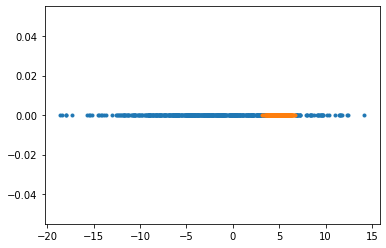

In [4]:
n = 500
n_2 = int(n * 0.5)

X1 = 6 * npr.randn(n).reshape(-1,1) - 2
X21 = 0.6 * npr.randn(n_2).reshape(-1,1) + 5
X22 =  0.6 * npr.randn(n_2).reshape(-1,1) + 5
X2 = np.concatenate((X21, X22), axis=0)
X1, X2 = X2, X1

plt.plot(X2.flatten(), [0] * n, '.')
plt.plot(X1.flatten(), [0] * n, '.')

In [5]:
c = cIPFP(X1, X2,  number_time_steps=100, batch_size=500 , step_size = 0.001, weights=[20,20,20], rng = jax.random.PRNGKey(100))

In [ ]:
# _, init_params_f = c.b_forward_init(c.rng, (-1, c.dim))                                             
# opt_state_f = c.opt_init_f(init_params_f)


# c.theta_f = c.get_params_f(opt_state_f)
# c.theta_b = c.get_params_f(opt_state_f) 


# c.inner_loss(c.theta_f, next(c.data_stream()), forwards=True);

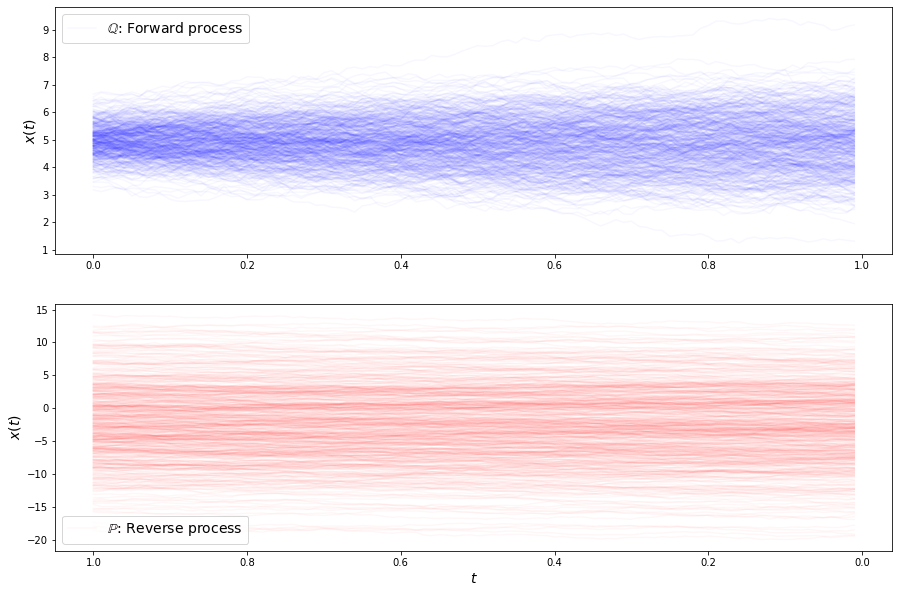

loss b 4260.68212890625
loss b 4173.1884765625
loss b 4094.244384765625
loss b 4097.83349609375
loss b 4076.4169921875
loss b 3995.4365234375
loss b 3978.736083984375
loss b 3926.489990234375
loss b 3864.603759765625
loss b 3904.187255859375
loss b 3872.465087890625
loss b 3824.377197265625
loss b 3790.74365234375
loss b 3693.92529296875
loss b 3656.29541015625
loss b 3727.579345703125
loss b 3751.310302734375
loss b 3541.62744140625
loss b 3446.756103515625
loss b 3508.41162109375
loss b 3475.560302734375
loss b 3417.555908203125
loss f 5.188127040863037
loss f 5.193386077880859
loss f 5.200672149658203
loss f 5.1888651847839355
loss f 5.148972034454346
loss f 5.144562721252441
loss f 5.153706073760986
loss f 5.1171875
loss f 5.102293968200684
loss f 5.080922603607178
loss f 5.07761287689209
loss f 5.05518102645874
loss f 5.021143913269043
loss f 5.049760341644287
loss f 5.033976078033447
loss f 5.065492153167725
loss f 5.035751819610596
loss f 5.000378608703613
loss f 4.9670710563659

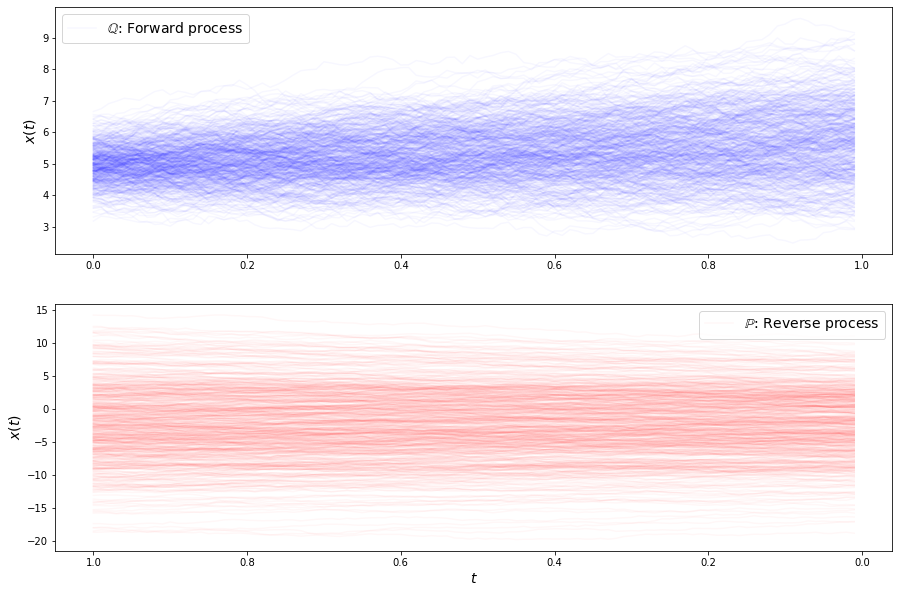

loss b 3412.768798828125
loss b 3321.30615234375
loss b 3299.56494140625
loss b 3208.753173828125
loss b 3140.030517578125
loss b 3164.22509765625
loss b 3136.425537109375
loss b 3025.549072265625
loss b 3023.53662109375
loss b 3094.1689453125
loss b 2988.251220703125
loss b 2940.937744140625
loss b 2863.867431640625
loss b 2863.4814453125
loss b 2804.65234375
loss b 2843.21630859375
loss b 2703.023681640625
loss b 2638.424072265625
loss b 2631.857666015625
loss b 2703.709228515625
loss b 2625.868896484375
loss b 2544.715087890625
loss f 4.96275520324707
loss f 4.986804485321045
loss f 4.961912155151367
loss f 4.946071147918701
loss f 4.958040714263916
loss f 4.951336860656738
loss f 4.945664882659912
loss f 4.9731125831604
loss f 4.980088710784912
loss f 4.939601421356201
loss f 4.967678546905518
loss f 4.959171772003174
loss f 4.939695835113525
loss f 4.9167022705078125
loss f 4.954754829406738
loss f 4.971364498138428
loss f 4.978144645690918
loss f 4.975193023681641
loss f 4.926590

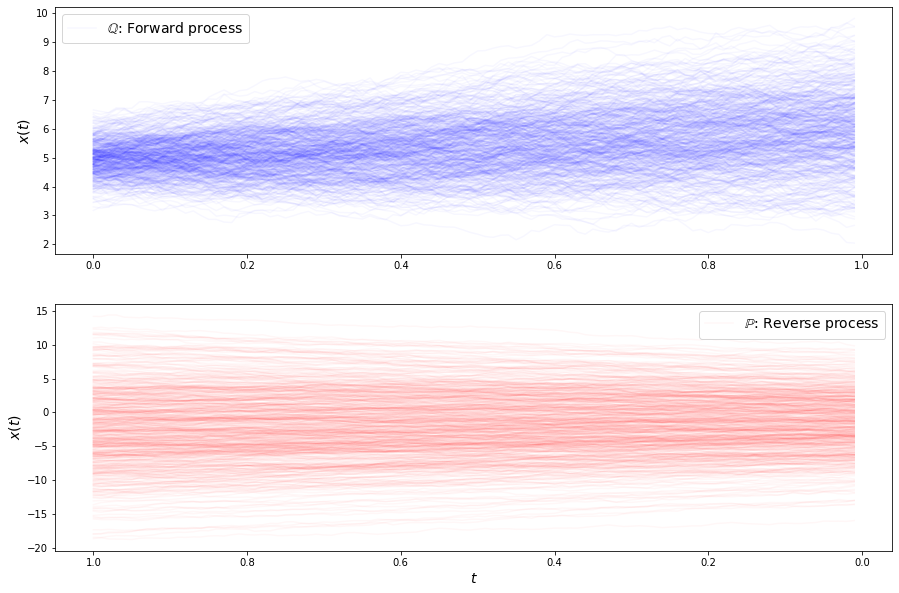

loss b 2494.156005859375
loss b 2385.704345703125
loss b 2385.44091796875
loss b 2319.090576171875
loss b 2296.93359375
loss b 2258.194091796875
loss b 2237.560302734375
loss b 2169.54443359375
loss b 2188.484619140625
loss b 2110.96728515625
loss b 2089.54345703125
loss b 2019.4127197265625
loss b 1981.0726318359375
loss b 1946.2315673828125
loss b 1977.93701171875
loss b 1894.57177734375
loss b 1913.5382080078125
loss b 1859.9193115234375
loss b 1800.5538330078125
loss b 1817.104736328125
loss b 1771.020263671875
loss b 1744.0711669921875
loss f 4.96828556060791
loss f 4.878694534301758
loss f 4.891989707946777
loss f 4.901548862457275
loss f 4.867029666900635
loss f 4.913143157958984
loss f 4.893291473388672
loss f 4.864597797393799
loss f 4.905566692352295
loss f 4.941244125366211
loss f 4.958258628845215
loss f 4.895345211029053
loss f 4.881950855255127
loss f 4.90254020690918
loss f 4.952451229095459
loss f 4.915350914001465
loss f 4.925020217895508
loss f 4.8467793464660645
loss

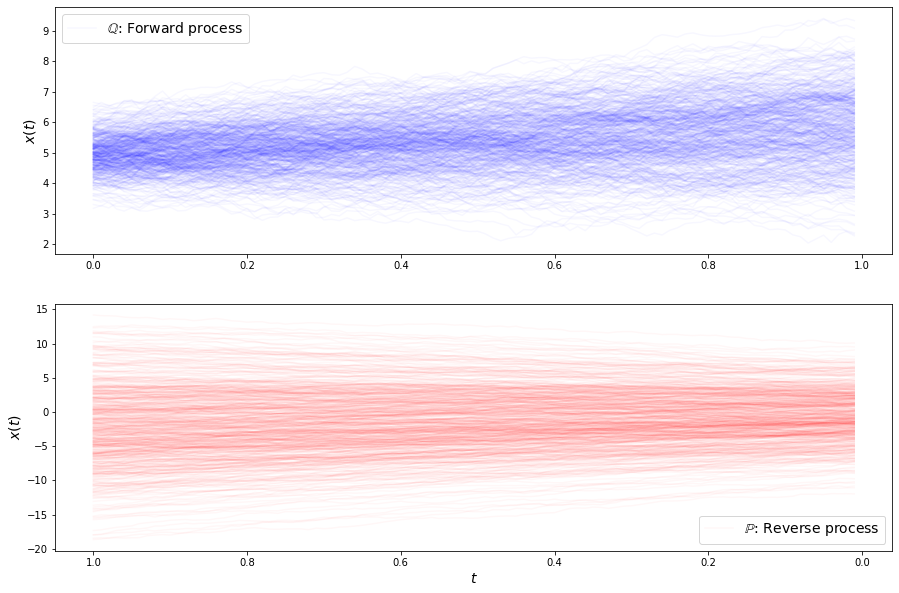

loss b 1654.561279296875
loss b 1628.1785888671875
loss b 1628.448486328125
loss b 1573.13134765625
loss b 1511.9417724609375
loss b 1501.9378662109375
loss b 1461.9468994140625
loss b 1442.86279296875
loss b 1434.4232177734375
loss b 1419.7261962890625
loss b 1393.7431640625
loss b 1403.7237548828125
loss b 1332.112060546875
loss b 1324.0460205078125
loss b 1334.32421875
loss b 1272.9364013671875
loss b 1251.290771484375
loss b 1225.86279296875
loss b 1200.0130615234375
loss b 1196.7989501953125
loss b 1159.449951171875
loss b 1164.002197265625
loss f 4.79555082321167
loss f 4.874612808227539
loss f 4.8455328941345215
loss f 4.846181392669678
loss f 4.786841869354248
loss f 4.7985100746154785
loss f 4.7985029220581055
loss f 4.77692985534668
loss f 4.8495588302612305
loss f 4.866384029388428
loss f 4.799861431121826
loss f 4.87112283706665
loss f 4.807885646820068
loss f 4.828864097595215
loss f 4.836188793182373
loss f 4.860486030578613
loss f 4.798548221588135
loss f 4.7385373115539

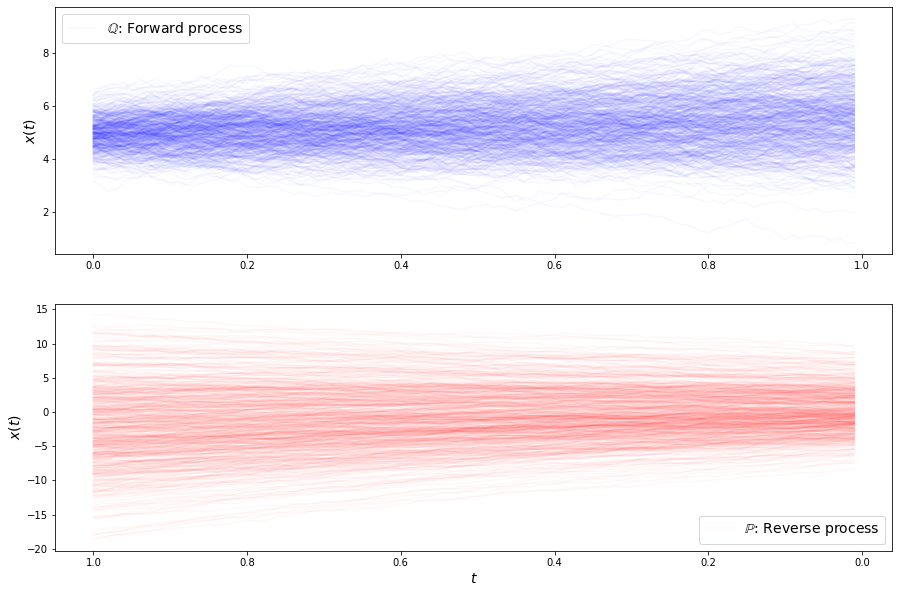

loss b 1107.4625244140625
loss b 1102.948486328125
loss b 1105.3253173828125
loss b 1065.1829833984375
loss b 1043.0723876953125
loss b 1034.53857421875
loss b 1011.0321655273438
loss b 998.02392578125
loss b 952.7214965820312
loss b 968.4862060546875
loss b 964.7088623046875
loss b 913.0317993164062
loss b 909.2529907226562
loss b 922.2506713867188
loss b 903.511962890625
loss b 888.427490234375
loss b 854.1708984375
loss b 885.5599365234375
loss b 819.4956665039062
loss b 816.244873046875
loss b 822.4436645507812
loss b 792.4467163085938
loss f 4.709846019744873
loss f 4.723852157592773
loss f 4.711193084716797
loss f 4.718306064605713
loss f 4.697284698486328
loss f 4.714085578918457
loss f 4.700870037078857
loss f 4.650447845458984
loss f 4.728758335113525
loss f 4.678904056549072
loss f 4.690131187438965
loss f 4.724308013916016
loss f 4.661788463592529
loss f 4.676206588745117
loss f 4.602828502655029
loss f 4.675159931182861
loss f 4.703897953033447
loss f 4.658257961273193
loss

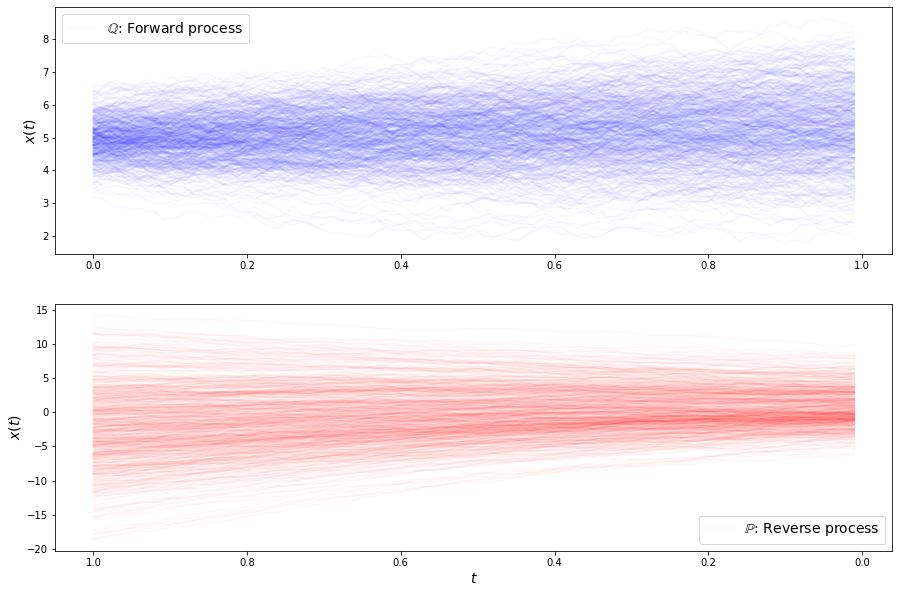

loss b 806.4476928710938
loss b 751.414794921875
loss b 761.1792602539062
loss b 736.10595703125
loss b 725.5028076171875
loss b 702.6604614257812
loss b 745.0103149414062
loss b 709.5641479492188
loss b 686.9039916992188
loss b 680.2881469726562
loss b 662.5611572265625
loss b 662.5101318359375
loss b 652.7050170898438
loss b 639.585693359375
loss b 623.191650390625
loss b 631.5431518554688
loss b 641.8143920898438
loss b 624.326904296875
loss b 601.8079833984375
loss b 600.0215454101562
loss b 587.0936889648438
loss b 581.20166015625
loss f 4.573877811431885
loss f 4.614626884460449
loss f 4.603212833404541
loss f 4.619924545288086
loss f 4.58032751083374
loss f 4.622303009033203
loss f 4.569286823272705
loss f 4.550522804260254
loss f 4.536190032958984
loss f 4.483981132507324
loss f 4.496616840362549
loss f 4.5519514083862305
loss f 4.554841041564941
loss f 4.527626991271973
loss f 4.522970199584961
loss f 4.495304107666016
loss f 4.49902868270874
loss f 4.429693222045898
loss f 4.

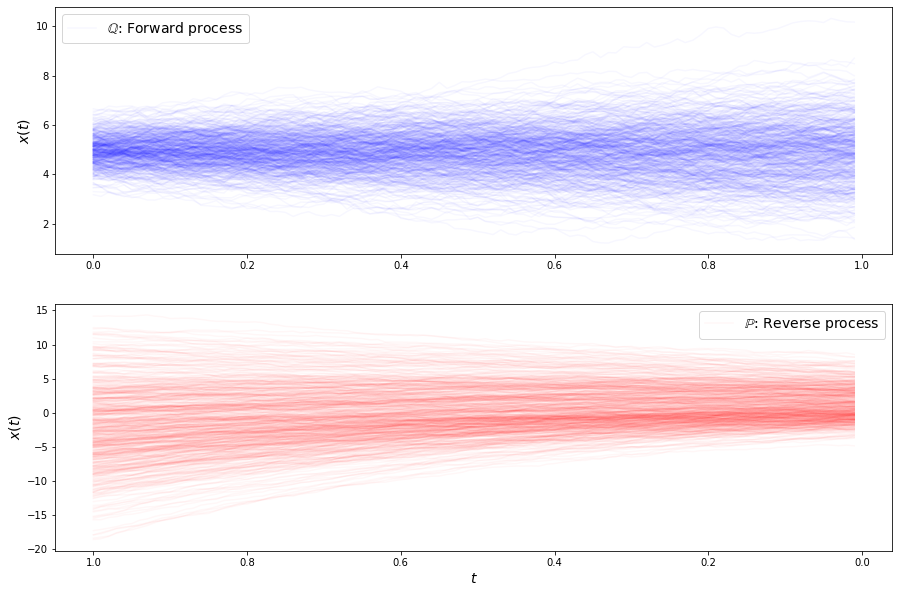

loss b 580.5047607421875
loss b 542.5982055664062
loss b 536.7315673828125
loss b 554.5745849609375
loss b 545.0390014648438
loss b 536.5867919921875
loss b 522.184326171875
loss b 508.017333984375
loss b 495.92181396484375
loss b 511.309814453125
loss b 487.83203125
loss b 490.37872314453125
loss b 479.4215087890625
loss b 482.6701965332031
loss b 471.2969970703125
loss b 460.5987854003906
loss b 470.89337158203125
loss b 451.0467224121094
loss b 459.1681823730469
loss b 439.9158020019531
loss b 448.8875427246094
loss b 424.853759765625
loss f 4.457386016845703
loss f 4.411014556884766
loss f 4.433647632598877
loss f 4.408501625061035
loss f 4.413712024688721
loss f 4.358302116394043
loss f 4.355870723724365
loss f 4.341679573059082
loss f 4.388094902038574
loss f 4.369966983795166
loss f 4.297700881958008
loss f 4.3343000411987305
loss f 4.2828569412231445
loss f 4.336389064788818
loss f 4.327751159667969
loss f 4.341198444366455
loss f 4.319804668426514
loss f 4.359571933746338
loss

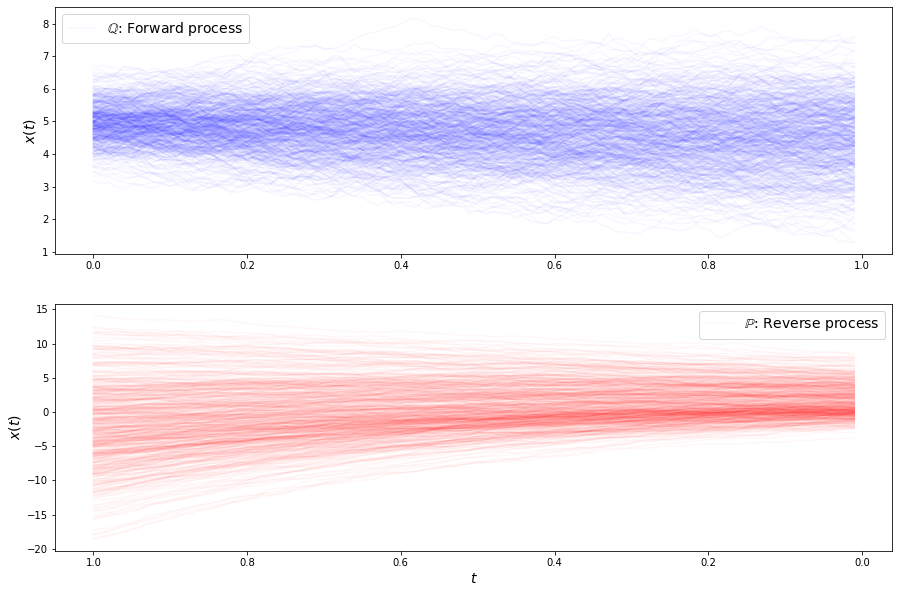

loss b 429.4444885253906
loss b 406.0611267089844
loss b 419.1737060546875
loss b 414.4927673339844
loss b 408.7610778808594
loss b 398.1041259765625
loss b 394.71026611328125
loss b 396.2616271972656
loss b 379.59832763671875
loss b 394.46514892578125
loss b 364.6119079589844
loss b 377.7451171875
loss b 374.4488830566406
loss b 366.2957763671875
loss b 360.7050476074219
loss b 356.5398254394531
loss b 354.9466857910156
loss b 360.75201416015625
loss b 355.87420654296875
loss b 346.1557312011719
loss b 336.1535949707031
loss b 333.42437744140625
loss f 4.238834381103516
loss f 4.227947235107422
loss f 4.291182994842529
loss f 4.284002304077148
loss f 4.249576091766357
loss f 4.1819963455200195
loss f 4.141892910003662
loss f 4.21739387512207
loss f 4.1978912353515625
loss f 4.129234313964844
loss f 4.1834397315979
loss f 4.14245080947876
loss f 4.16381311416626
loss f 4.1353607177734375
loss f 4.169317722320557
loss f 4.108346462249756
loss f 4.076149940490723
loss f 4.096524238586426

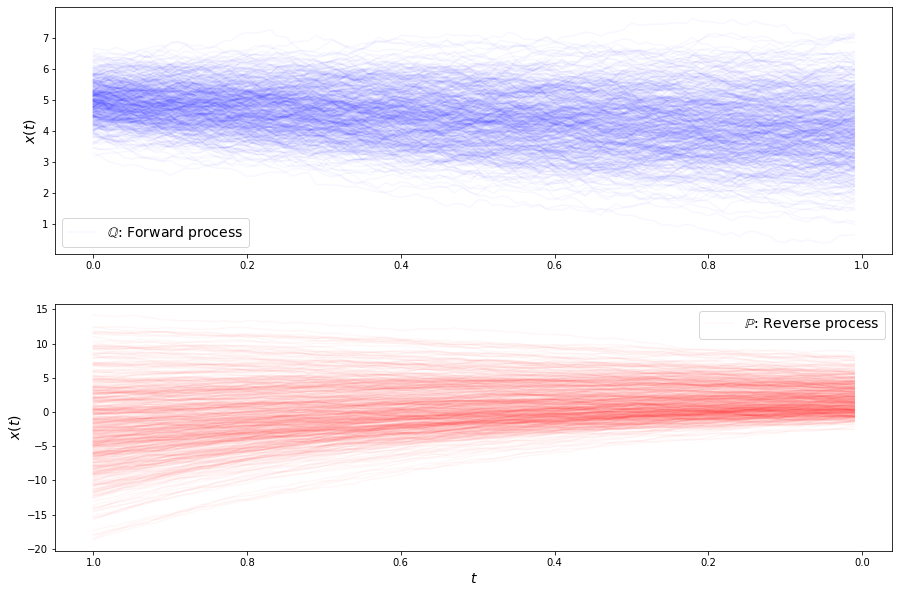

loss b 329.2539978027344
loss b 326.1430358886719
loss b 321.13690185546875
loss b 312.8847351074219
loss b 314.27105712890625
loss b 315.8504333496094
loss b 303.1274108886719
loss b 305.50518798828125
loss b 294.0407409667969
loss b 308.6695251464844
loss b 295.4779968261719
loss b 303.7842102050781
loss b 285.80950927734375
loss b 297.9200134277344
loss b 285.19818115234375
loss b 284.56024169921875
loss b 278.3250427246094
loss b 264.108154296875
loss b 269.6209716796875
loss b 267.42059326171875
loss b 264.9747314453125
loss b 265.1517028808594
loss f 4.078767776489258
loss f 4.103254795074463
loss f 4.055850505828857
loss f 3.976492166519165
loss f 3.991896390914917
loss f 3.9742753505706787
loss f 3.988323926925659
loss f 4.005258560180664
loss f 3.8669471740722656
loss f 3.9673240184783936
loss f 3.9290831089019775
loss f 3.897542953491211
loss f 3.8054404258728027
loss f 3.8854570388793945
loss f 3.866431474685669
loss f 3.905677556991577
loss f 3.7956910133361816
loss f 3.916

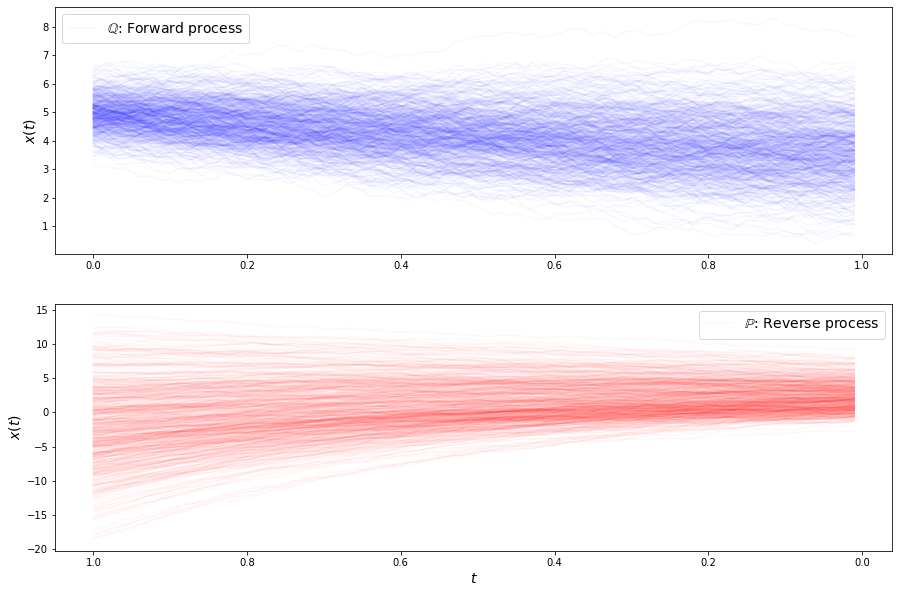

loss b 262.18499755859375
loss b 242.69430541992188
loss b 250.97775268554688
loss b 246.95907592773438
loss b 245.62083435058594
loss b 236.1354217529297
loss b 242.01239013671875
loss b 245.1044158935547
loss b 235.16458129882812
loss b 232.2612762451172
loss b 227.6432647705078
loss b 226.01625061035156
loss b 222.511962890625
loss b 217.4463653564453
loss b 219.05702209472656
loss b 216.578369140625
loss b 223.9156494140625
loss b 219.78878784179688
loss b 213.098388671875
loss b 211.8331298828125
loss b 204.58583068847656
loss b 207.5279998779297
loss f 3.9350647926330566
loss f 3.77876877784729
loss f 3.8335254192352295
loss f 3.7578868865966797
loss f 3.7773184776306152
loss f 3.805767774581909
loss f 3.833014965057373
loss f 3.7777891159057617
loss f 3.737635612487793
loss f 3.6585564613342285
loss f 3.700813055038452
loss f 3.7082934379577637
loss f 3.7239112854003906
loss f 3.688999891281128
loss f 3.6377251148223877
loss f 3.6318795680999756
loss f 3.6367979049682617
loss f 

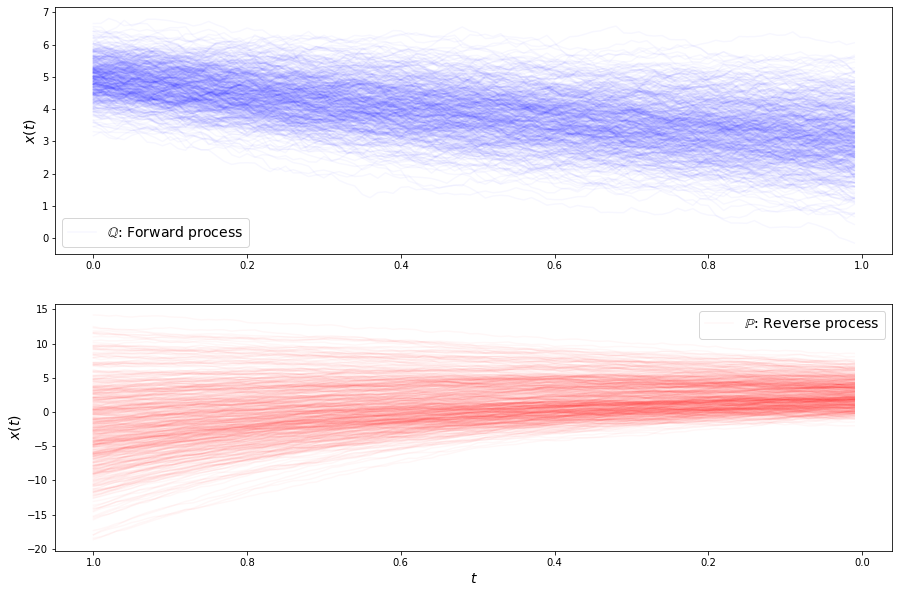

loss b 197.72007751464844
loss b 196.57452392578125
loss b 194.94781494140625
loss b 192.1241912841797
loss b 189.5055389404297
loss b 195.27003479003906
loss b 185.10206604003906
loss b 189.24551391601562
loss b 187.11549377441406
loss b 181.4310302734375
loss b 188.02377319335938
loss b 182.81590270996094
loss b 186.65711975097656
loss b 183.63772583007812
loss b 168.3609161376953
loss b 172.40870666503906
loss b 163.5482177734375
loss b 163.79124450683594
loss b 179.464111328125
loss b 175.416748046875
loss b 166.64125061035156
loss b 166.04293823242188
loss f 3.7287867069244385
loss f 3.7498371601104736
loss f 3.695692539215088
loss f 3.775458574295044
loss f 3.7736029624938965
loss f 3.67771315574646
loss f 3.676614999771118
loss f 3.588020086288452
loss f 3.6672098636627197
loss f 3.6805241107940674
loss f 3.54477596282959
loss f 3.5944790840148926
loss f 3.61506724357605
loss f 3.5472941398620605
loss f 3.5881659984588623
loss f 3.543379545211792
loss f 3.5542960166931152
loss f

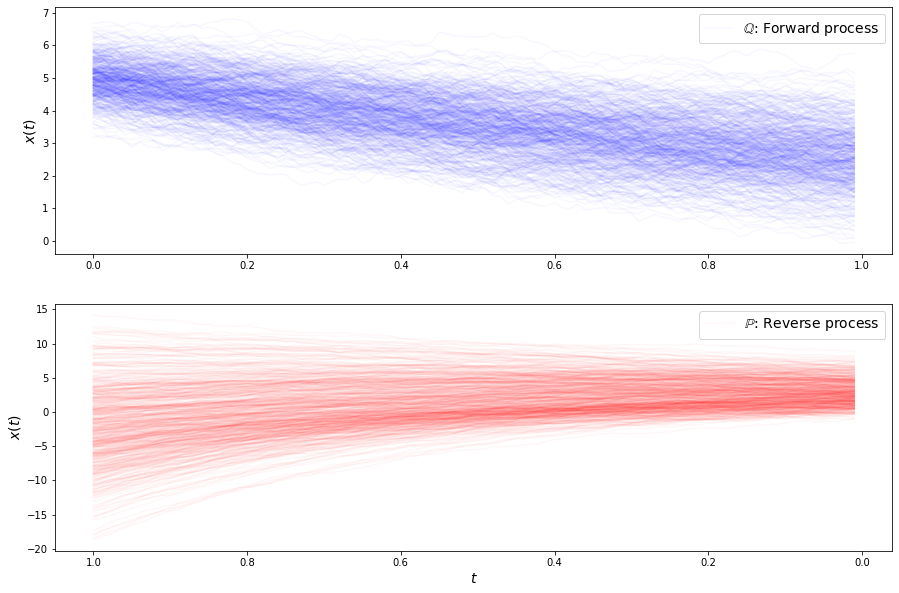

loss b 168.53158569335938
loss b 152.93629455566406
loss b 156.7673797607422
loss b 150.8902587890625
loss b 157.0690460205078
loss b 144.0965118408203
loss b 147.1541748046875
loss b 145.4824676513672
loss b 151.90090942382812
loss b 150.9794464111328
loss b 143.67027282714844
loss b 144.50563049316406
loss b 136.96607971191406
loss b 131.9786376953125
loss b 139.9742431640625
loss b 129.80979919433594
loss b 145.56732177734375
loss b 136.2233123779297
loss b 130.66184997558594
loss b 126.65308380126953
loss b 140.06246948242188
loss b 125.14105224609375
loss f 3.7931935787200928
loss f 3.7851555347442627
loss f 3.7566170692443848
loss f 3.767366647720337
loss f 3.7355310916900635
loss f 3.7161619663238525
loss f 3.7351579666137695
loss f 3.710632562637329
loss f 3.6944282054901123
loss f 3.6511359214782715
loss f 3.6727373600006104
loss f 3.759300470352173
loss f 3.714353084564209
loss f 3.681192398071289
loss f 3.6263256072998047
loss f 3.622196912765503
loss f 3.6461730003356934
lo

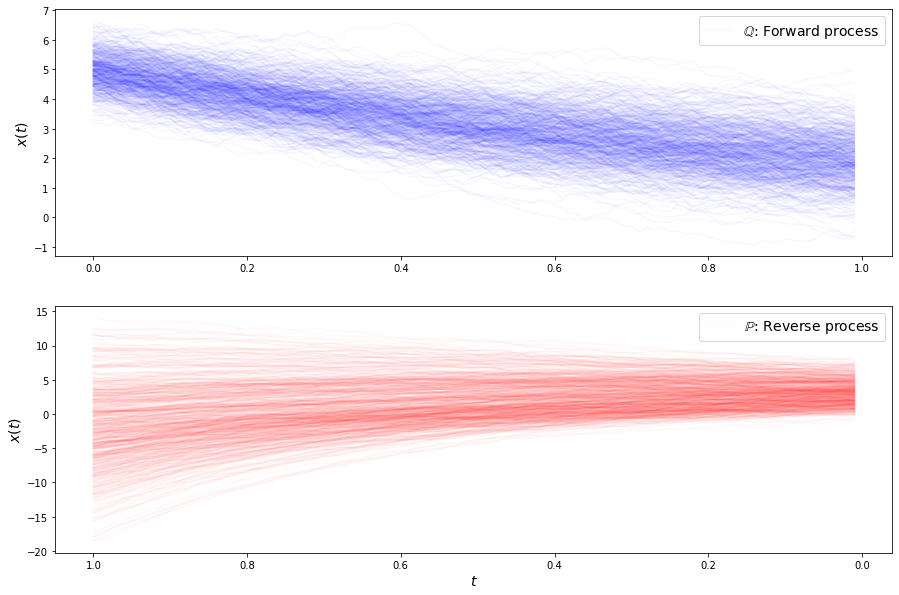

loss b 129.27587890625
loss b 119.04515075683594
loss b 126.24974822998047
loss b 115.53852844238281
loss b 108.30169677734375
loss b 122.06438446044922
loss b 113.44222259521484
loss b 115.20671844482422
loss b 114.3280258178711
loss b 109.90235137939453
loss b 114.03152465820312
loss b 106.46491241455078
loss b 109.65572357177734
loss b 108.25764465332031
loss b 107.7644271850586
loss b 105.06539154052734
loss b 105.3695068359375
loss b 106.21985626220703
loss b 101.02442169189453
loss b 98.98041534423828
loss b 101.3233413696289
loss b 101.44512176513672
loss f 3.9621543884277344
loss f 3.869659423828125
loss f 3.9964685440063477
loss f 3.8885810375213623
loss f 3.8338210582733154
loss f 3.8731698989868164
loss f 3.854063034057617
loss f 3.829958915710449
loss f 3.9049720764160156
loss f 3.9087235927581787
loss f 3.801307439804077
loss f 3.9286415576934814
loss f 3.8661134243011475
loss f 3.867594003677368
loss f 3.828279972076416
loss f 3.9069325923919678
loss f 3.85294508934021
lo

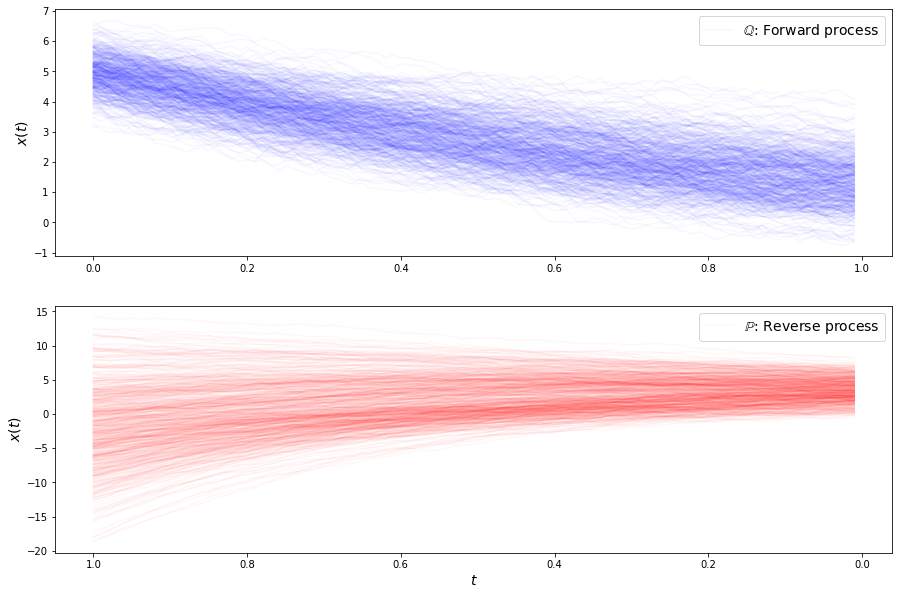

loss b 94.76217651367188
loss b 96.36984252929688
loss b 88.05911254882812
loss b 86.06168365478516
loss b 89.4504165649414
loss b 92.0943832397461
loss b 93.77035522460938
loss b 86.66902160644531
loss b 86.02595520019531
loss b 86.87702941894531
loss b 85.96543884277344
loss b 85.5805435180664
loss b 84.21833801269531
loss b 87.20651245117188
loss b 77.90214538574219
loss b 82.44428253173828
loss b 80.84760284423828
loss b 80.65724182128906
loss b 82.05065155029297
loss b 84.87020111083984
loss b 74.91466522216797
loss b 76.63441467285156
loss f 4.275353908538818
loss f 4.198803901672363
loss f 4.1487860679626465
loss f 4.159959316253662
loss f 4.169766426086426
loss f 4.153337478637695
loss f 4.12543249130249
loss f 4.099880218505859
loss f 4.147921562194824
loss f 4.188539028167725
loss f 4.148789882659912
loss f 4.089487552642822
loss f 4.072567462921143
loss f 4.107306003570557
loss f 3.9870340824127197
loss f 4.077319145202637
loss f 4.06525182723999
loss f 4.069093704223633
los

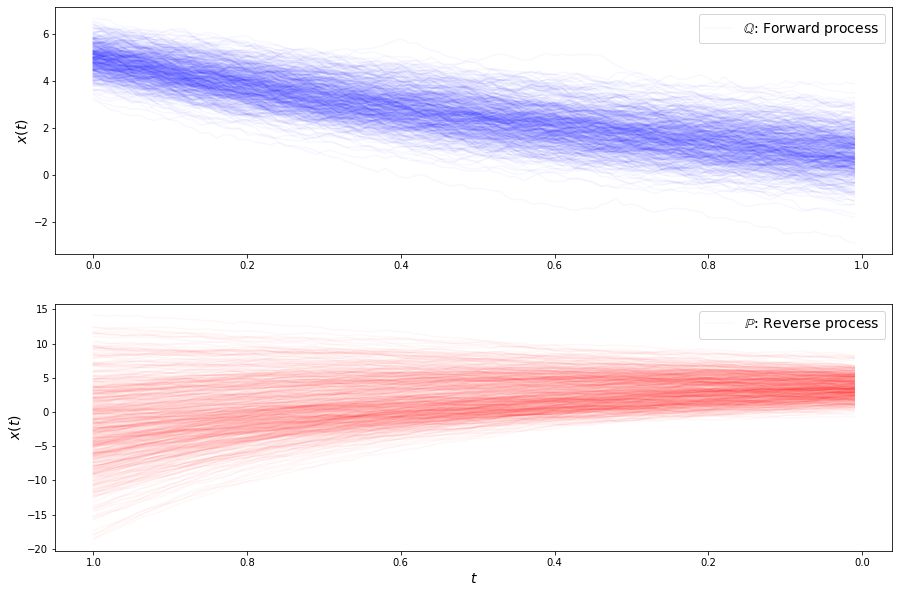

loss b 68.16998291015625
loss b 72.05036926269531
loss b 64.62128448486328
loss b 70.83161926269531
loss b 67.5701904296875
loss b 65.29766845703125
loss b 72.23310852050781
loss b 72.0271987915039
loss b 65.1781005859375
loss b 65.01268005371094
loss b 60.61077880859375
loss b 65.47232055664062
loss b 64.57320404052734
loss b 61.936649322509766
loss b 65.251220703125
loss b 64.90320587158203
loss b 62.66163635253906
loss b 60.88013458251953
loss b 58.64247512817383
loss b 58.53968811035156
loss b 62.16999053955078
loss b 65.02880096435547
loss f 4.513237953186035
loss f 4.49645471572876
loss f 4.4331231117248535
loss f 4.409869194030762
loss f 4.292818546295166
loss f 4.3864970207214355
loss f 4.376715660095215
loss f 4.271653652191162
loss f 4.317058563232422
loss f 4.358926773071289
loss f 4.302282810211182
loss f 4.373238563537598
loss f 4.289173603057861
loss f 4.336637020111084
loss f 4.162804126739502
loss f 4.252147197723389
loss f 4.209845542907715
loss f 4.128188133239746
los

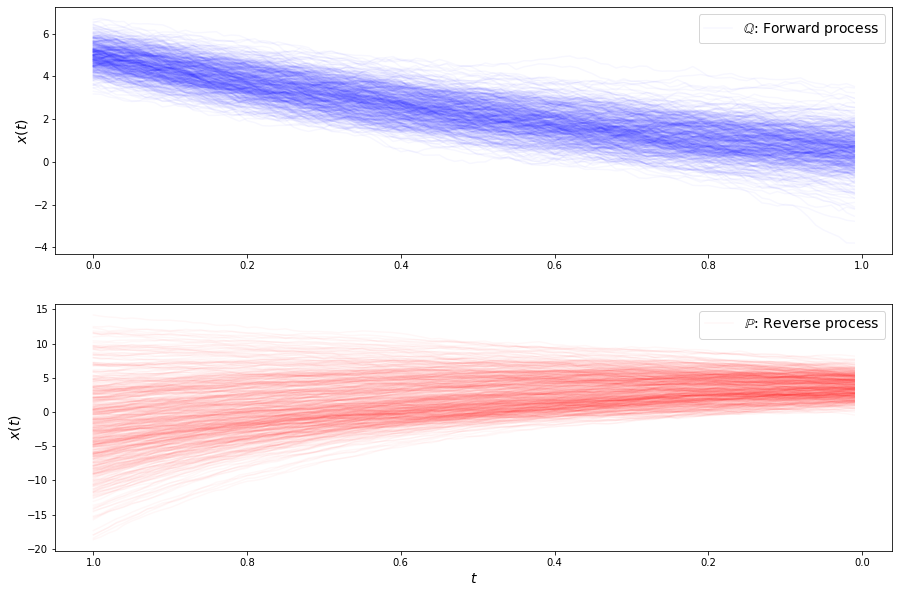

loss b 51.52425765991211
loss b 52.5697135925293
loss b 56.38167953491211
loss b 52.374271392822266
loss b 47.85308074951172
loss b 51.4229850769043
loss b 48.60417175292969
loss b 49.878456115722656
loss b 50.69229507446289
loss b 45.479209899902344
loss b 52.343544006347656
loss b 47.44163513183594
loss b 47.12085723876953
loss b 47.274192810058594
loss b 45.24692916870117
loss b 46.043758392333984
loss b 43.382904052734375
loss b 45.73877716064453
loss b 45.50428009033203
loss b 45.648338317871094
loss b 45.555328369140625
loss b 47.220062255859375
loss f 4.480137348175049
loss f 4.337584018707275
loss f 4.374031066894531
loss f 4.2040863037109375
loss f 4.287350177764893
loss f 4.265895366668701
loss f 4.144321918487549
loss f 4.187499046325684
loss f 4.17022705078125
loss f 4.07973575592041
loss f 4.054095268249512
loss f 4.020904064178467
loss f 3.9990875720977783
loss f 3.9225640296936035
loss f 3.9151346683502197
loss f 3.8908262252807617
loss f 3.824115037918091
loss f 3.78944

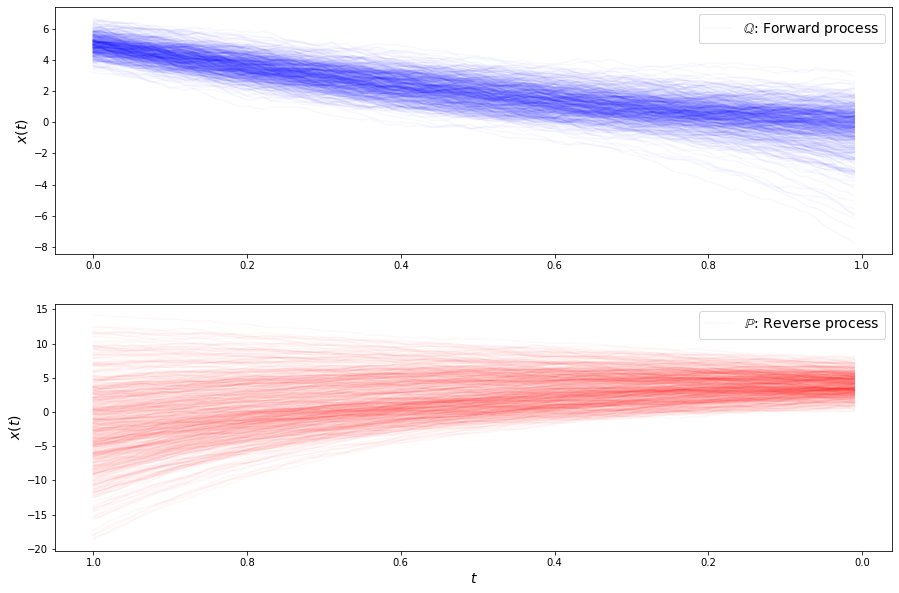

loss b 39.860111236572266
loss b 35.21375274658203
loss b 38.78266525268555
loss b 41.748199462890625
loss b 40.253177642822266
loss b 42.418209075927734
loss b 41.02971267700195
loss b 39.316017150878906
loss b 35.823001861572266
loss b 36.48000717163086
loss b 33.52122497558594
loss b 39.23609924316406
loss b 42.37566375732422
loss b 38.1467170715332
loss b 34.967166900634766
loss b 38.78770446777344
loss b 37.46017837524414
loss b 33.22706604003906
loss b 32.37092590332031
loss b 32.92948913574219
loss b 38.432247161865234
loss b 33.03935623168945
loss f 3.9098801612854004
loss f 3.854377031326294
loss f 3.8168728351593018
loss f 3.771240711212158
loss f 3.662247896194458
loss f 3.668914794921875
loss f 3.56032395362854
loss f 3.5619699954986572
loss f 3.5346224308013916
loss f 3.4756217002868652
loss f 3.484410047531128
loss f 3.3789730072021484
loss f 3.397623300552368
loss f 3.3482983112335205
loss f 3.278994560241699
loss f 3.3104281425476074
loss f 3.2679660320281982
loss f 3.2

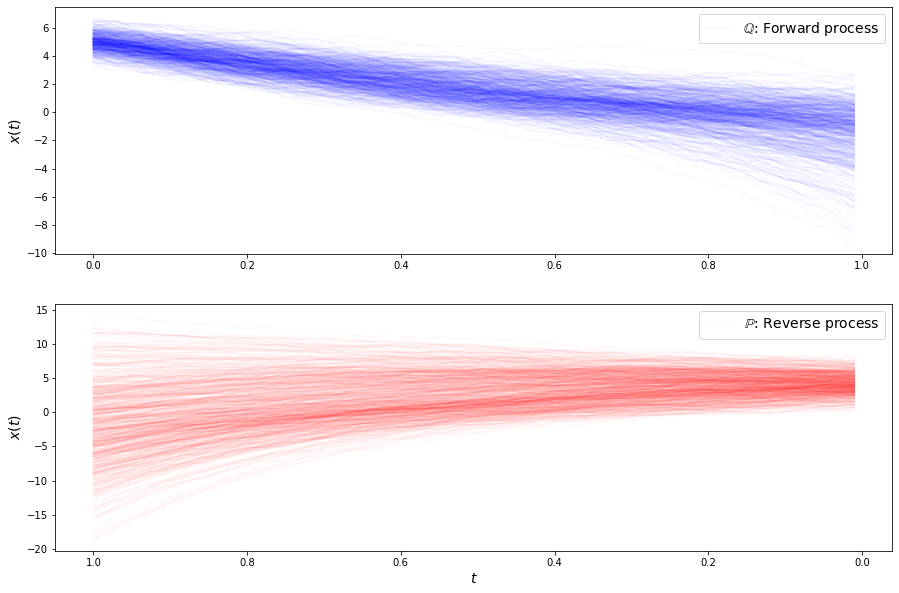

loss b 31.35016441345215
loss b 31.777568817138672
loss b 28.784330368041992
loss b 27.541412353515625
loss b 30.681556701660156
loss b 30.682004928588867
loss b 27.891372680664062
loss b 26.826139450073242
loss b 27.793336868286133
loss b 28.002710342407227
loss b 28.72628402709961
loss b 30.346668243408203
loss b 29.796602249145508
loss b 27.50991439819336
loss b 27.126968383789062
loss b 28.064760208129883
loss b 24.95313262939453
loss b 23.64593505859375
loss b 30.104768753051758
loss b 24.890287399291992
loss b 26.8984432220459
loss b 26.829172134399414
loss f 3.263972043991089
loss f 3.247706651687622
loss f 3.1743905544281006
loss f 3.1150760650634766
loss f 3.045762062072754
loss f 2.9995789527893066
loss f 3.033832311630249
loss f 2.9528141021728516
loss f 2.942082166671753
loss f 2.906696081161499
loss f 2.8485898971557617
loss f 2.852905035018921
loss f 2.826796531677246
loss f 2.8105974197387695
loss f 2.766125440597534
loss f 2.723365545272827
loss f 2.7448973655700684
los

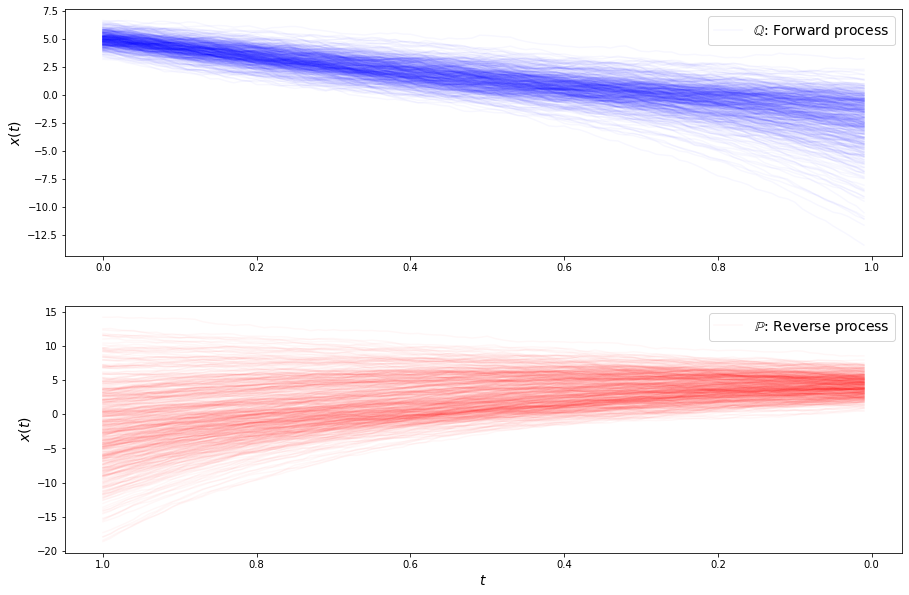

loss b 23.73221206665039
loss b 23.94039535522461
loss b 22.601604461669922
loss b 23.507827758789062
loss b 22.886272430419922
loss b 23.555660247802734
loss b 22.43853759765625
loss b 26.235536575317383
loss b 23.773645401000977
loss b 22.839767456054688
loss b 23.524091720581055
loss b 24.005775451660156
loss b 23.040000915527344
loss b 21.57048225402832
loss b 22.04225730895996
loss b 21.670988082885742
loss b 23.653175354003906
loss b 21.249868392944336
loss b 25.832563400268555
loss b 20.016876220703125
loss b 20.837207794189453
loss b 19.559019088745117
loss f 2.730595588684082
loss f 2.677006721496582
loss f 2.6416075229644775
loss f 2.594970464706421
loss f 2.573819398880005
loss f 2.531705141067505
loss f 2.522453546524048
loss f 2.5170340538024902
loss f 2.4796595573425293
loss f 2.4534473419189453
loss f 2.4777140617370605
loss f 2.432981491088867
loss f 2.4340734481811523
loss f 2.4017508029937744
loss f 2.4000887870788574
loss f 2.401280641555786
loss f 2.3971359729766846

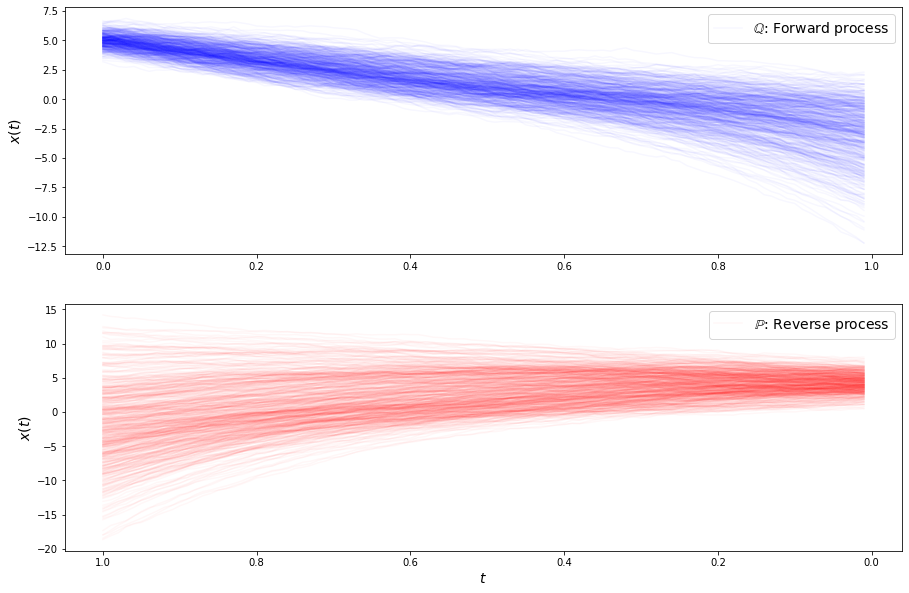

loss b 21.33368682861328
loss b 18.85630226135254
loss b 18.873048782348633
loss b 20.222068786621094
loss b 16.35354995727539
loss b 18.963600158691406
loss b 18.00678825378418
loss b 18.632776260375977
loss b 19.26201629638672
loss b 19.50484848022461
loss b 19.054412841796875
loss b 17.491914749145508
loss b 20.598466873168945
loss b 17.182010650634766
loss b 17.055723190307617
loss b 19.70610809326172
loss b 19.835433959960938
loss b 16.94219207763672
loss b 17.117961883544922
loss b 17.0221004486084
loss b 16.77436065673828
loss b 17.89282989501953
loss f 2.417010545730591
loss f 2.3672595024108887
loss f 2.3684639930725098
loss f 2.337830066680908
loss f 2.3031814098358154
loss f 2.2975716590881348
loss f 2.3011014461517334
loss f 2.3024606704711914
loss f 2.279603958129883
loss f 2.3101601600646973
loss f 2.285430431365967
loss f 2.252462387084961
loss f 2.27095890045166
loss f 2.2731668949127197
loss f 2.2243387699127197
loss f 2.2283904552459717
loss f 2.241715669631958
loss f

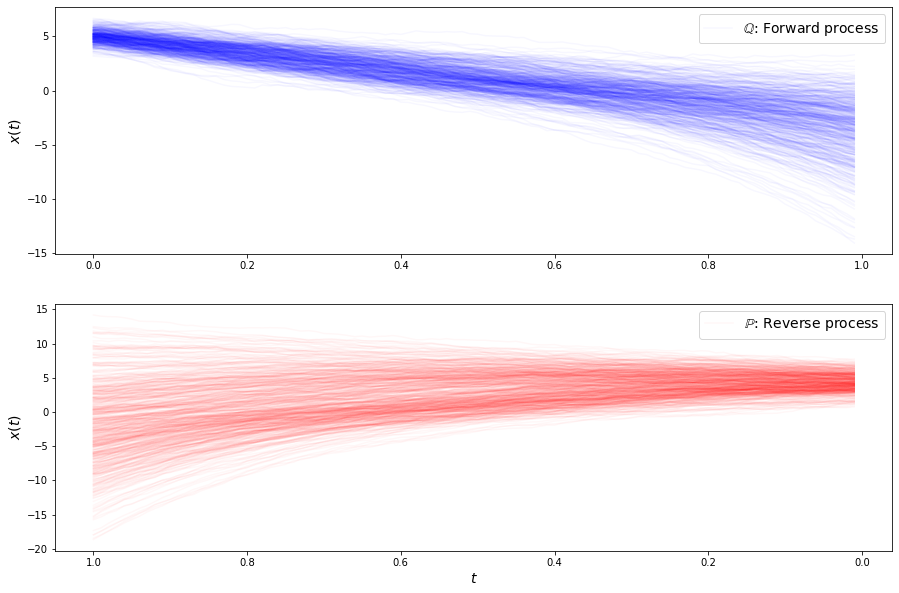

loss b 16.754165649414062
loss b 17.99176025390625
loss b 16.090635299682617
loss b 15.04810619354248
loss b 18.658931732177734
loss b 16.85677146911621
loss b 15.5107421875
loss b 15.425431251525879
loss b 17.35424041748047
loss b 15.828227996826172
loss b 12.921527862548828
loss b 15.992398262023926
loss b 16.379291534423828
loss b 15.329374313354492
loss b 12.153763771057129
loss b 12.60489559173584
loss b 17.35675621032715
loss b 14.651915550231934
loss b 14.039813041687012
loss b 14.635214805603027
loss b 15.700127601623535
loss b 13.637969970703125
loss f 2.3204948902130127
loss f 2.356088399887085
loss f 2.2639987468719482
loss f 2.2500455379486084
loss f 2.281344175338745
loss f 2.268937587738037
loss f 2.230111598968506
loss f 2.2168445587158203
loss f 2.2744624614715576
loss f 2.2190780639648438
loss f 2.2526004314422607
loss f 2.2281172275543213
loss f 2.2558956146240234
loss f 2.24042010307312
loss f 2.2189111709594727
loss f 2.2262940406799316
loss f 2.255328416824341
loss

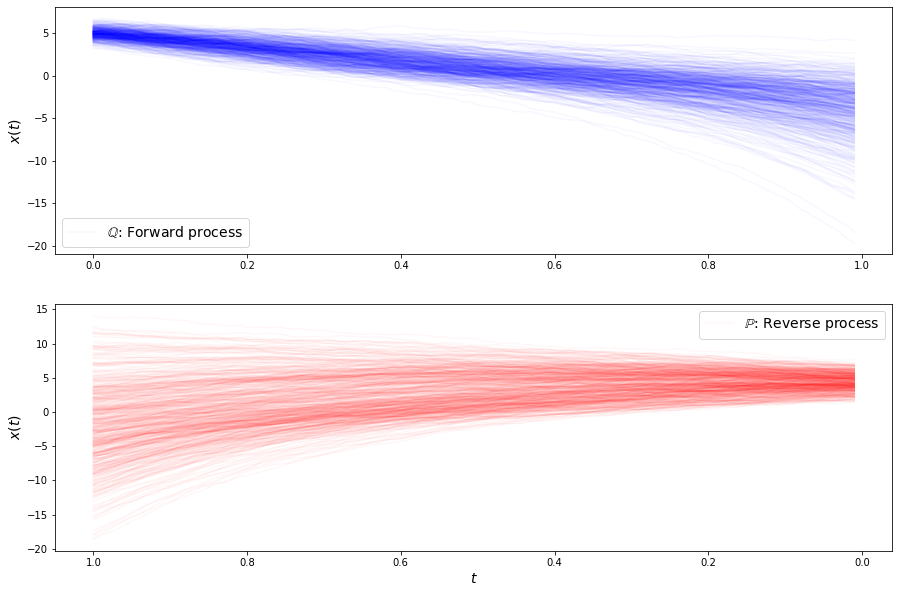

loss b 15.23275089263916
loss b 15.589712142944336
loss b 11.252056121826172
loss b 13.290346145629883
loss b 14.060999870300293
loss b 13.650961875915527
loss b 14.692414283752441
loss b 10.601016998291016
loss b 12.00438404083252
loss b 12.86445140838623
loss b 13.677953720092773
loss b 15.054916381835938
loss b 11.684661865234375
loss b 12.938063621520996
loss b 12.146162033081055
loss b 13.175413131713867
loss b 12.933371543884277
loss b 12.059863090515137
loss b 13.696136474609375
loss b 13.5336332321167
loss b 14.309765815734863
loss b 10.89635944366455
loss f 2.2998909950256348
loss f 2.2761104106903076
loss f 2.327272891998291
loss f 2.2683355808258057
loss f 2.278510093688965
loss f 2.2977545261383057
loss f 2.2235965728759766
loss f 2.3080244064331055
loss f 2.283412218093872
loss f 2.2637815475463867
loss f 2.263772487640381
loss f 2.2850489616394043
loss f 2.3428046703338623
loss f 2.247710943222046
loss f 2.304783582687378
loss f 2.2751214504241943
loss f 2.307674407958984

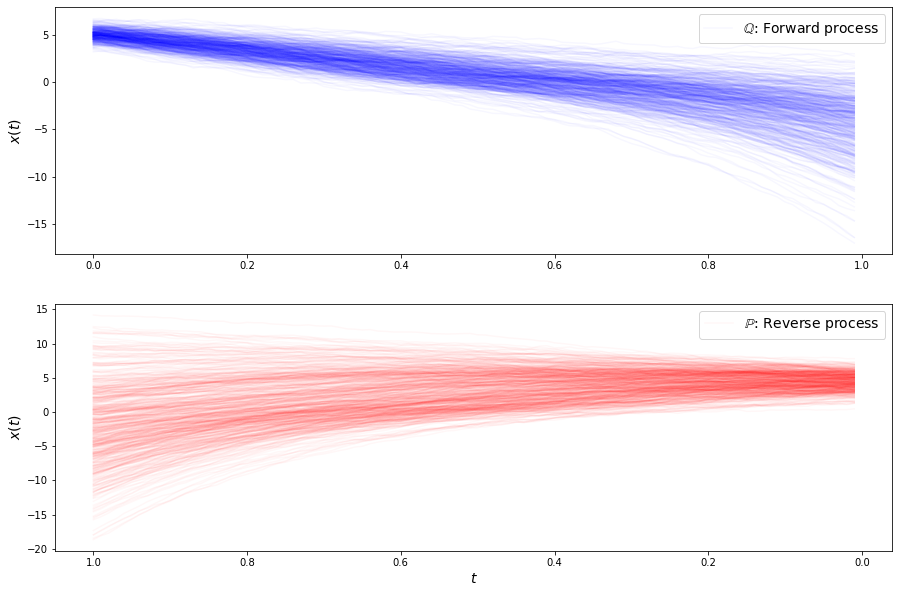

loss b 14.04625415802002
loss b 11.9718599319458
loss b 11.482295989990234
loss b 9.90558910369873
loss b 11.567831993103027
loss b 10.297518730163574
loss b 14.536097526550293
loss b 9.77650260925293
loss b 10.59543228149414
loss b 10.865594863891602
loss b 12.717650413513184
loss b 10.552151679992676
loss b 11.539922714233398
loss b 12.581605911254883
loss b 12.43618392944336
loss b 13.659773826599121
loss b 11.504401206970215
loss b 12.173895835876465
loss b 10.853105545043945
loss b 10.252821922302246
loss b 10.675678253173828
loss b 11.264792442321777
loss f 2.362147569656372
loss f 2.3714215755462646
loss f 2.299495220184326
loss f 2.309152603149414
loss f 2.2902259826660156
loss f 2.386030912399292
loss f 2.2821593284606934
loss f 2.2955949306488037
loss f 2.3469252586364746
loss f 2.3644728660583496
loss f 2.3497188091278076
loss f 2.310533046722412
loss f 2.2877869606018066
loss f 2.329174518585205
loss f 2.3161094188690186
loss f 2.3508145809173584
loss f 2.3435962200164795
l

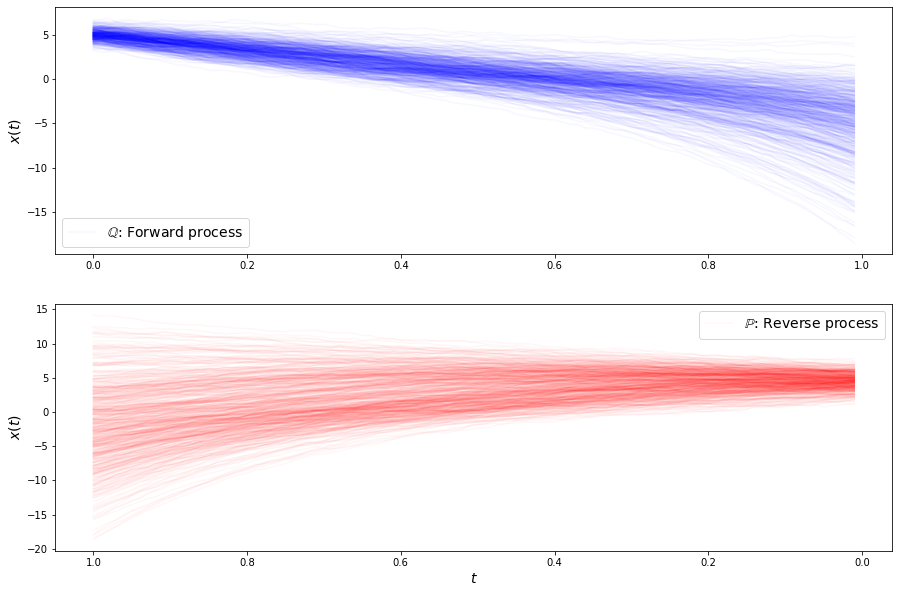

loss b 10.059686660766602
loss b 10.203218460083008
loss b 13.380435943603516
loss b 10.662375450134277
loss b 10.233809471130371
loss b 9.129276275634766
loss b 9.425164222717285
loss b 10.607609748840332
loss b 10.356209754943848
loss b 10.405089378356934
loss b 11.734355926513672
loss b 11.703720092773438
loss b 13.250275611877441
loss b 9.769102096557617
loss b 10.96394157409668
loss b 10.092191696166992
loss b 10.653914451599121
loss b 11.340385437011719
loss b 9.237780570983887
loss b 9.764686584472656
loss b 10.478363990783691
loss b 11.056486129760742
loss f 2.4251270294189453
loss f 2.3313136100769043
loss f 2.345118522644043
loss f 2.393388032913208
loss f 2.3890414237976074
loss f 2.3678395748138428
loss f 2.410391330718994
loss f 2.3582539558410645
loss f 2.3797194957733154
loss f 2.3408474922180176
loss f 2.418898820877075
loss f 2.4140124320983887
loss f 2.3855435848236084
loss f 2.360830307006836
loss f 2.411299228668213
loss f 2.483360528945923
loss f 2.384026050567627


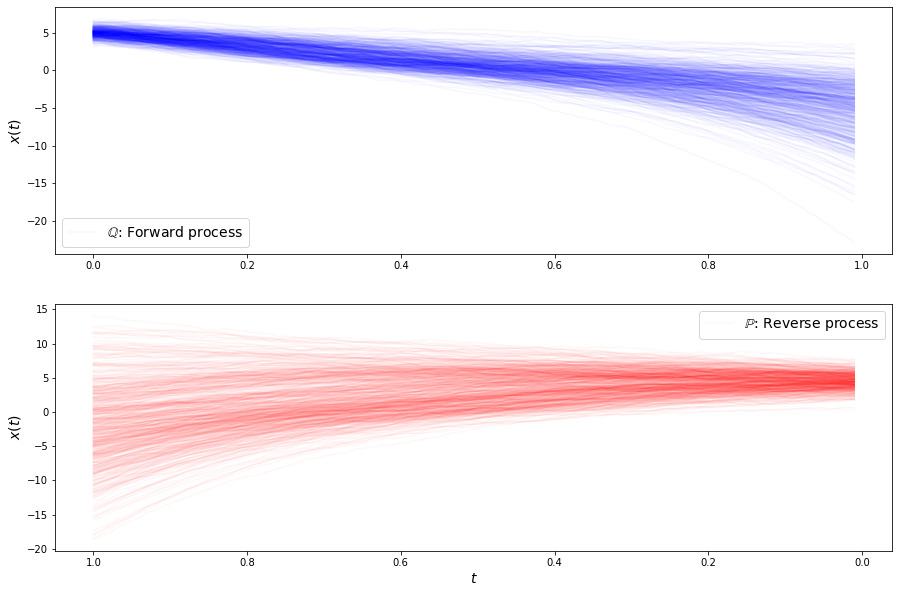

loss b 10.270124435424805
loss b 10.651589393615723
loss b 10.430672645568848
loss b 7.834721565246582
loss b 9.383243560791016
loss b 10.391495704650879
loss b 9.782212257385254
loss b 9.585989952087402
loss b 9.973566055297852
loss b 8.780997276306152
loss b 9.694835662841797
loss b 9.57779312133789
loss b 10.666112899780273
loss b 9.847756385803223
loss b 8.601153373718262
loss b 10.090018272399902
loss b 10.444297790527344
loss b 9.46177864074707
loss b 9.051090240478516
loss b 9.470154762268066
loss b 9.542855262756348
loss b 8.593751907348633
loss f 2.4581692218780518
loss f 2.4337222576141357
loss f 2.401271104812622
loss f 2.4577255249023438
loss f 2.4102630615234375
loss f 2.439976930618286
loss f 2.505866527557373
loss f 2.552720546722412
loss f 2.374992847442627
loss f 2.459243059158325
loss f 2.4376447200775146
loss f 2.5444719791412354
loss f 2.396141767501831
loss f 2.3736956119537354
loss f 2.391448736190796
loss f 2.4343459606170654
loss f 2.4996564388275146
loss f 2.40

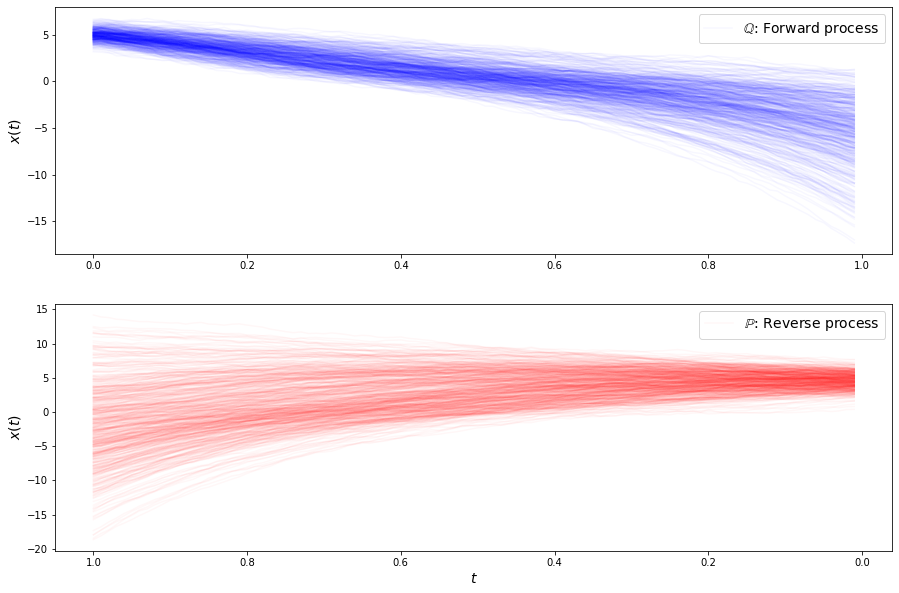

loss b 8.544770240783691
loss b 10.592501640319824
loss b 8.884978294372559
loss b 8.145910263061523
loss b 11.871026992797852
loss b 10.253873825073242
loss b 9.21522331237793
loss b 8.457633972167969
loss b 11.687363624572754
loss b 8.18958854675293
loss b 8.499354362487793
loss b 10.789347648620605
loss b 8.379008293151855
loss b 8.892068862915039
loss b 8.56994342803955
loss b 8.867265701293945
loss b 9.550339698791504
loss b 8.789892196655273
loss b 9.103248596191406
loss b 9.582254409790039
loss b 7.257741451263428
loss b 8.539270401000977
loss f 2.4935476779937744
loss f 2.5406334400177
loss f 2.4683024883270264
loss f 2.518017530441284
loss f 2.5360100269317627
loss f 2.504920482635498
loss f 2.4787747859954834
loss f 2.554755449295044
loss f 2.454418420791626
loss f 2.5247364044189453
loss f 2.514552116394043
loss f 2.587388038635254
loss f 2.4933125972747803
loss f 2.4978220462799072
loss f 2.4702022075653076
loss f 2.5422298908233643
loss f 2.5216500759124756
loss f 2.473338

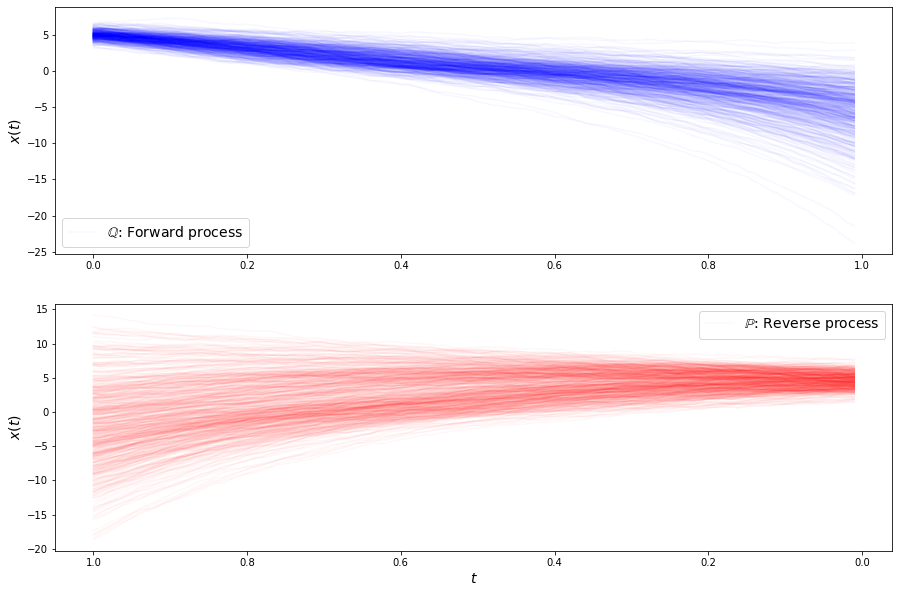

loss b 7.329503059387207
loss b 8.251328468322754
loss b 8.689047813415527
loss b 8.204710960388184
loss b 8.195687294006348
loss b 7.565741062164307
loss b 8.476568222045898
loss b 8.201712608337402
loss b 7.900486469268799
loss b 7.533048152923584
loss b 7.627803802490234
loss b 9.068540573120117
loss b 8.21224594116211
loss b 9.342920303344727
loss b 9.815768241882324
loss b 7.878110885620117
loss b 8.497200012207031
loss b 8.464143753051758
loss b 7.857865333557129
loss b 8.520822525024414
loss b 6.915816783905029
loss b 7.056774616241455
loss f 2.5774455070495605
loss f 2.5460703372955322
loss f 2.5635290145874023
loss f 2.6111671924591064
loss f 2.6295249462127686
loss f 2.5245580673217773
loss f 2.573664426803589
loss f 2.5625336170196533
loss f 2.5951919555664062
loss f 2.487942934036255
loss f 2.5662643909454346
loss f 2.590785264968872
loss f 2.567714214324951
loss f 2.6190855503082275
loss f 2.558837890625
loss f 2.6093759536743164
loss f 2.5754005908966064
loss f 2.59086894

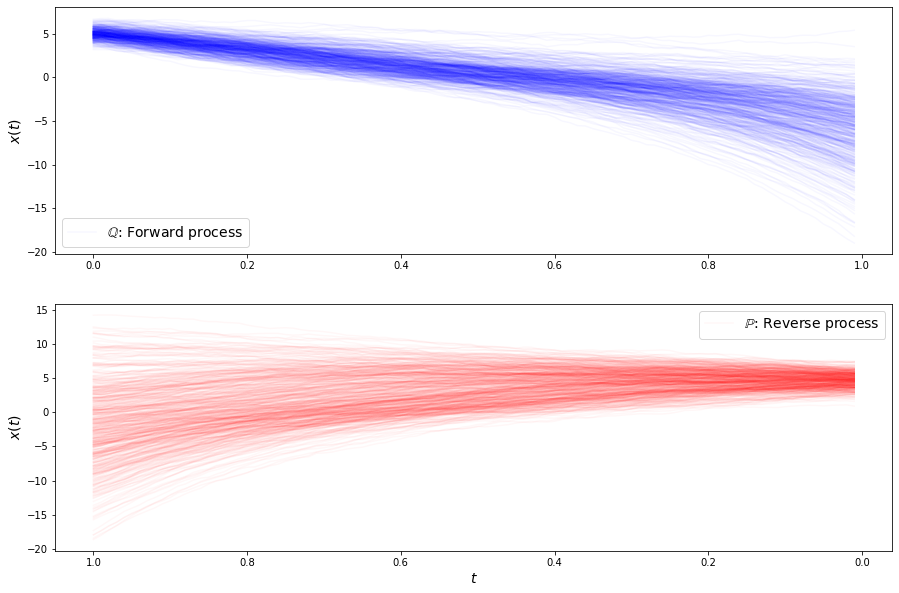

loss b 8.977417945861816
loss b 7.325196266174316
loss b 7.45812463760376
loss b 7.794206142425537
loss b 7.136651992797852
loss b 7.5919342041015625
loss b 7.332843780517578
loss b 9.325920104980469
loss b 7.328094959259033
loss b 8.128782272338867
loss b 8.317237854003906
loss b 6.63580846786499
loss b 9.180198669433594
loss b 7.721209526062012
loss b 7.136998176574707
loss b 7.963517189025879
loss b 6.40527868270874
loss b 8.284823417663574
loss b 8.114684104919434
loss b 8.013229370117188
loss b 9.582284927368164
loss b 7.414271831512451
loss f 2.76129150390625
loss f 2.5844712257385254
loss f 2.651763916015625
loss f 2.6324214935302734
loss f 2.647982597351074
loss f 2.6507229804992676
loss f 2.612534284591675
loss f 2.5710723400115967
loss f 2.537501573562622
loss f 2.663562774658203
loss f 2.5917415618896484
loss f 2.5891060829162598
loss f 2.654223680496216
loss f 2.6510560512542725
loss f 2.561534881591797
loss f 2.5504024028778076
loss f 2.595613479614258
loss f 2.62142944335

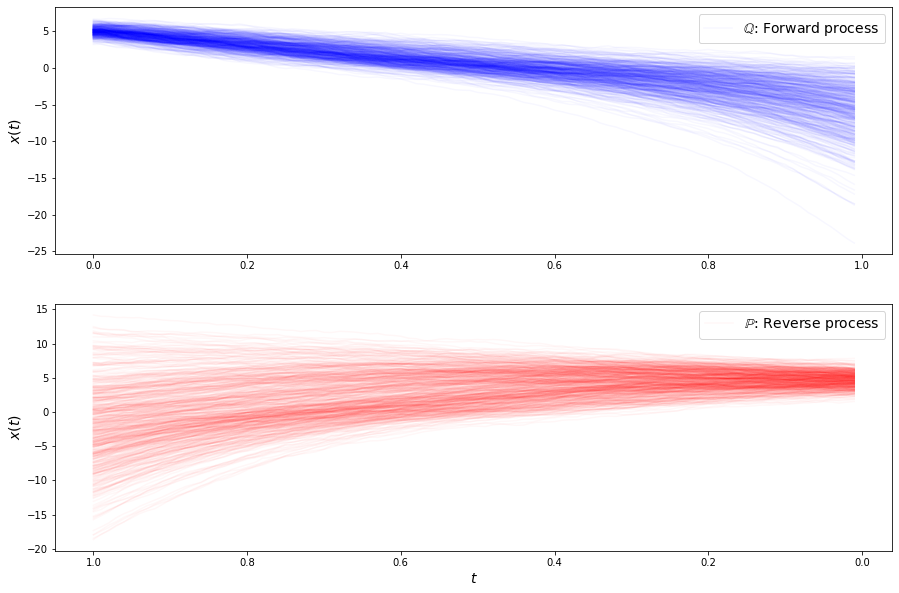

loss b 7.870823860168457
loss b 7.579448223114014
loss b 7.301935195922852
loss b 7.490426063537598
loss b 6.9426140785217285
loss b 8.372833251953125
loss b 6.871121883392334
loss b 7.972845077514648
loss b 6.588342189788818
loss b 6.6769890785217285
loss b 8.108030319213867
loss b 8.211503028869629
loss b 8.88646125793457
loss b 7.722815036773682
loss b 6.638429164886475
loss b 7.811223030090332
loss b 6.872729778289795
loss b 9.424574851989746
loss b 7.576282978057861
loss b 6.66447639465332
loss b 6.714469909667969
loss b 7.295363426208496
loss f 2.6209089756011963
loss f 2.732274055480957
loss f 2.6219687461853027
loss f 2.7031075954437256
loss f 2.646047592163086
loss f 2.641343116760254
loss f 2.6944100856781006
loss f 2.563962697982788
loss f 2.6300785541534424
loss f 2.6453728675842285
loss f 2.6409099102020264
loss f 2.656632423400879
loss f 2.72416615486145
loss f 2.6768341064453125
loss f 2.7627029418945312
loss f 2.6746270656585693
loss f 2.6851110458374023
loss f 2.566140

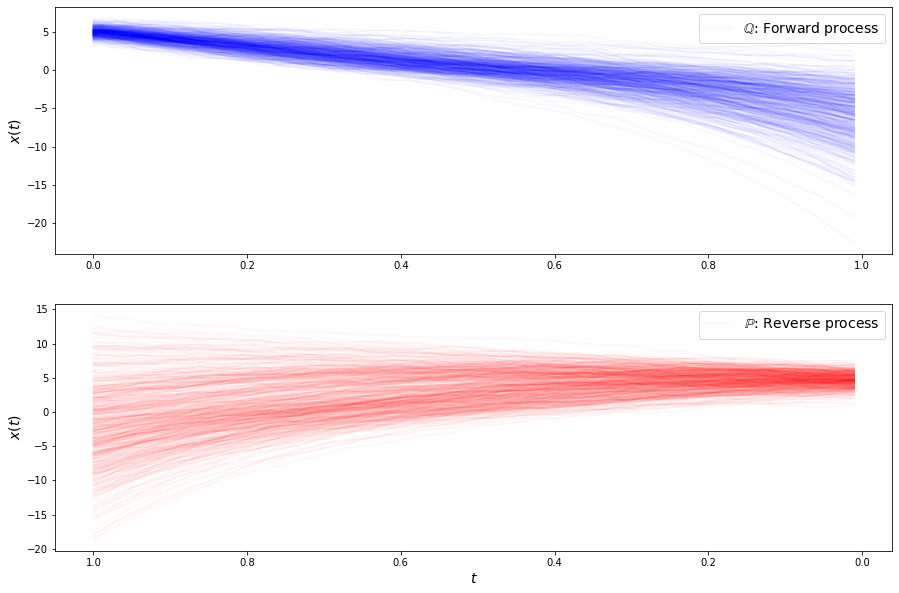

loss b 8.234593391418457
loss b 6.428092956542969
loss b 7.384157657623291
loss b 6.879507064819336
loss b 7.099307060241699
loss b 8.273297309875488
loss b 6.6233038902282715
loss b 7.344977855682373
loss b 7.467823505401611
loss b 6.008562088012695
loss b 6.773190021514893
loss b 7.9468841552734375
loss b 6.070639610290527
loss b 7.939568519592285
loss b 6.674500942230225
loss b 6.890942096710205
loss b 6.847378730773926
loss b 6.8579020500183105
loss b 7.219164848327637
loss b 6.473697185516357
loss b 8.232311248779297
loss b 6.662654399871826
loss f 2.7494401931762695
loss f 2.7925961017608643
loss f 2.7913548946380615
loss f 2.753136396408081
loss f 2.8079147338867188
loss f 2.6744699478149414
loss f 2.73625111579895
loss f 2.681365966796875
loss f 2.7096409797668457
loss f 2.7650279998779297
loss f 2.721839427947998
loss f 2.7915470600128174
loss f 2.759999990463257
loss f 2.805312156677246
loss f 2.690932035446167
loss f 2.7517340183258057
loss f 2.758681297302246
loss f 2.70566

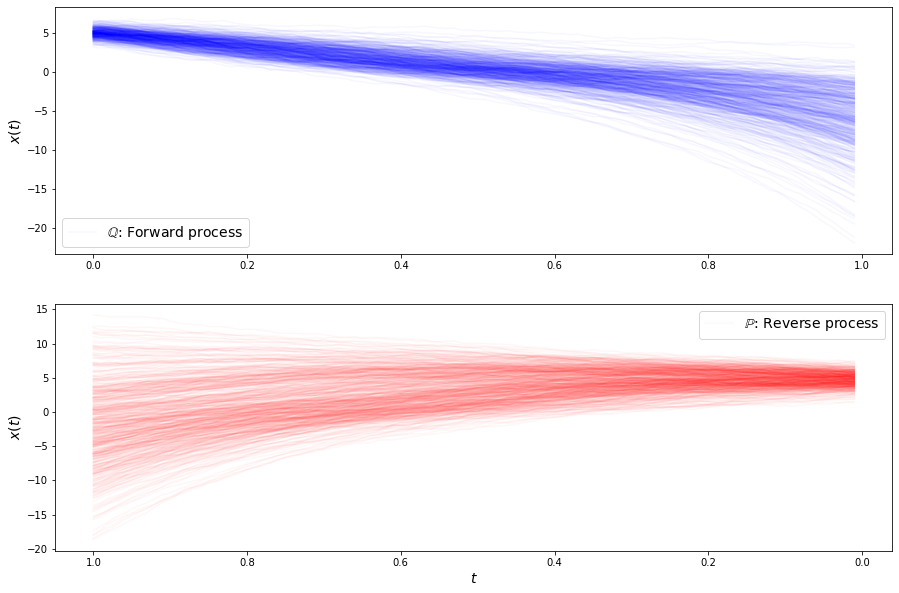

loss b 6.497138500213623
loss b 6.785923957824707
loss b 7.35530948638916
loss b 8.023517608642578
loss b 7.162566184997559
loss b 7.091989994049072
loss b 7.088686943054199
loss b 5.994340896606445
loss b 6.803155899047852
loss b 7.65006685256958
loss b 7.196047306060791
loss b 5.648096561431885
loss b 8.122427940368652
loss b 7.757081031799316
loss b 7.397243022918701
loss b 8.037217140197754
loss b 6.1360578536987305
loss b 6.098780632019043
loss b 5.723925590515137
loss b 6.562882900238037
loss b 6.479468822479248
loss b 7.037086486816406
loss f 2.704373598098755
loss f 2.9093031883239746
loss f 2.8582592010498047
loss f 2.797445058822632
loss f 2.776627540588379
loss f 2.7541310787200928
loss f 2.784271001815796
loss f 2.8131184577941895
loss f 2.8513646125793457
loss f 2.815563201904297
loss f 2.7405104637145996
loss f 2.7959959506988525
loss f 2.7035458087921143
loss f 2.831563711166382
loss f 2.7615585327148438
loss f 2.7620534896850586
loss f 2.7469449043273926
loss f 2.758058

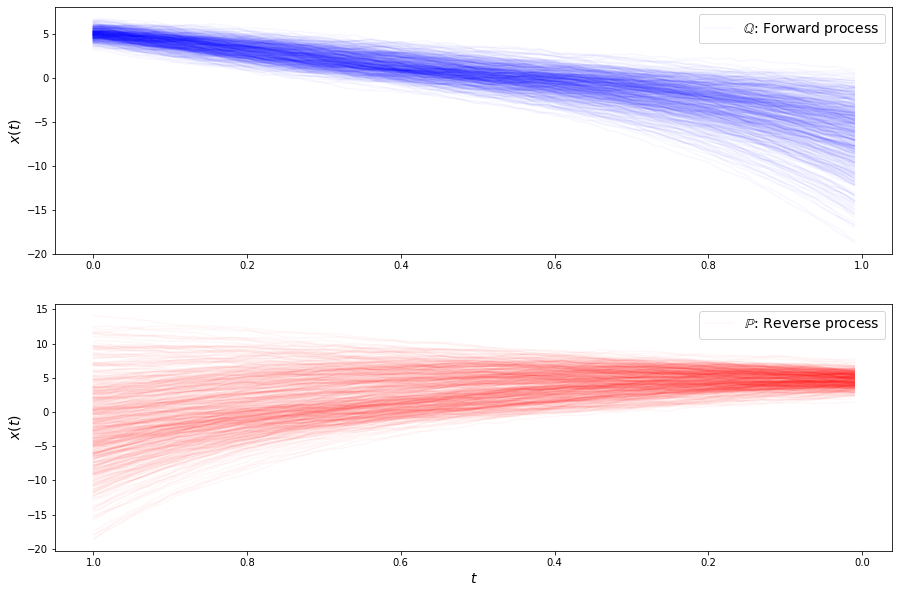

loss b 7.683877944946289
loss b 6.462728977203369
loss b 6.0272698402404785
loss b 6.93221378326416
loss b 7.130926132202148
loss b 7.106918811798096
loss b 6.135004043579102
loss b 6.853625297546387
loss b 5.884061336517334
loss b 5.690817832946777
loss b 7.05579137802124
loss b 7.071725845336914
loss b 6.857645034790039
loss b 6.786311149597168
loss b 6.453152179718018
loss b 6.053521156311035
loss b 6.24971342086792
loss b 6.587464809417725
loss b 6.151175022125244
loss b 7.462149620056152
loss b 7.504663944244385
loss b 6.724520206451416
loss f 2.933042049407959
loss f 2.7961225509643555
loss f 2.771029472351074
loss f 2.8586108684539795
loss f 2.8504459857940674
loss f 2.7909111976623535
loss f 2.8252511024475098
loss f 2.7382924556732178
loss f 2.8061954975128174
loss f 2.7877237796783447
loss f 2.748457908630371
loss f 2.7527318000793457
loss f 2.942211389541626
loss f 2.831739902496338
loss f 2.8259525299072266
loss f 2.8162055015563965
loss f 2.7485218048095703
loss f 2.856012

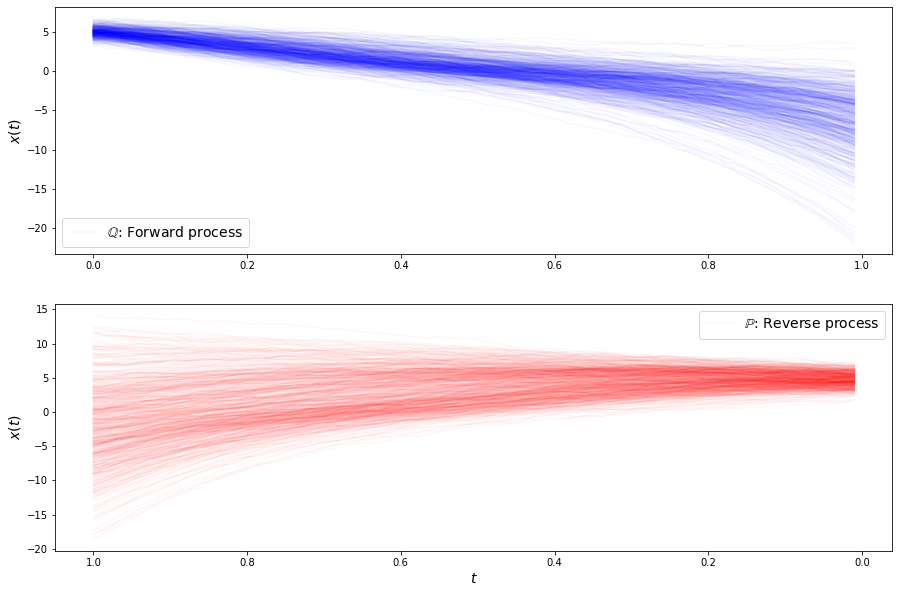

loss b 5.966070175170898
loss b 8.13077163696289
loss b 5.574032783508301
loss b 6.914869785308838
loss b 6.174124717712402
loss b 6.802609443664551
loss b 6.6950860023498535
loss b 5.799332141876221
loss b 6.139001846313477
loss b 6.0684309005737305
loss b 5.581113815307617
loss b 6.026862144470215
loss b 6.378138542175293
loss b 6.227659225463867
loss b 5.542807102203369
loss b 7.289710521697998
loss b 5.648003101348877
loss b 6.049155235290527
loss b 6.595871925354004
loss b 7.333614826202393
loss b 6.950732231140137
loss b 6.168290138244629
loss f 2.8725333213806152
loss f 2.920377016067505
loss f 2.908292055130005
loss f 2.871464729309082
loss f 2.996079683303833
loss f 2.8240551948547363
loss f 2.826939344406128
loss f 2.899197816848755
loss f 2.9618401527404785
loss f 2.857125759124756
loss f 2.817416191101074
loss f 2.8954274654388428
loss f 2.859828472137451
loss f 2.7932841777801514
loss f 2.998948812484741
loss f 2.9027202129364014
loss f 2.86356258392334
loss f 2.9808208942

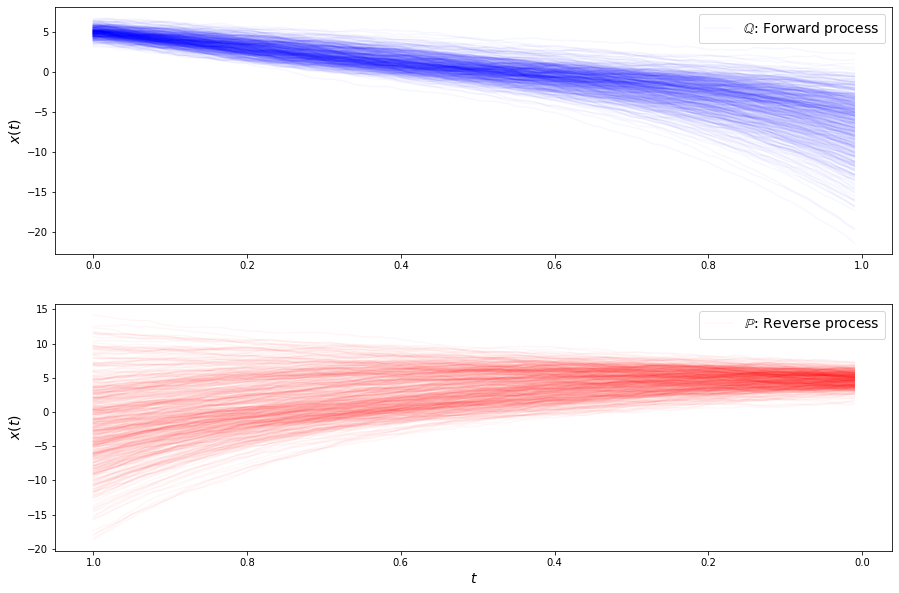

loss b 5.9879069328308105
loss b 5.826900959014893
loss b 5.82689905166626
loss b 5.812108039855957
loss b 6.902397632598877
loss b 5.448993682861328
loss b 6.552871227264404
loss b 6.5665082931518555
loss b 5.583898067474365
loss b 5.922811031341553
loss b 5.820429801940918
loss b 6.4143171310424805
loss b 6.2351579666137695
loss b 6.171006202697754
loss b 6.610118389129639
loss b 5.96250057220459
loss b 6.291855812072754
loss b 7.488988399505615
loss b 6.240777969360352
loss b 5.485547065734863
loss b 6.1135945320129395
loss b 6.570953369140625
loss f 2.865380048751831
loss f 3.060049295425415
loss f 2.9804654121398926
loss f 3.0208334922790527
loss f 2.9308414459228516
loss f 2.815437078475952
loss f 2.9451804161071777
loss f 3.0779876708984375
loss f 2.91188383102417
loss f 2.936323404312134
loss f 2.9134109020233154
loss f 2.9830474853515625
loss f 2.867249011993408
loss f 2.9127752780914307
loss f 2.8872978687286377
loss f 2.9211058616638184
loss f 2.904902219772339
loss f 2.9892

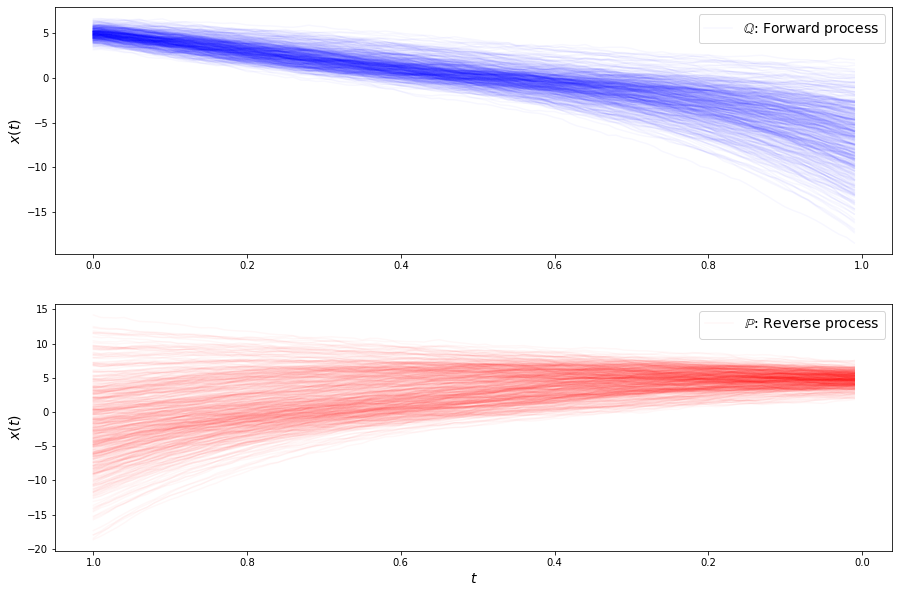

loss b 5.346309185028076
loss b 7.152749538421631
loss b 6.205658912658691
loss b 5.625683784484863
loss b 5.070282936096191
loss b 4.738580226898193
loss b 6.543760776519775
loss b 5.839173793792725
loss b 5.795176982879639
loss b 5.940682888031006
loss b 6.593169212341309
loss b 5.512916088104248
loss b 6.012296676635742
loss b 5.888410568237305
loss b 6.561563014984131
loss b 6.15885591506958
loss b 6.061050891876221
loss b 5.790309906005859
loss b 5.384872913360596
loss b 5.901622772216797
loss b 6.506606101989746
loss b 5.424214839935303
loss f 3.0420024394989014
loss f 2.9258193969726562
loss f 3.026437282562256
loss f 2.981397867202759
loss f 3.1460258960723877
loss f 2.9776227474212646
loss f 2.9711990356445312
loss f 3.072767734527588
loss f 2.9722957611083984
loss f 2.9723124504089355
loss f 3.1116108894348145
loss f 3.0857698917388916
loss f 2.9618940353393555
loss f 2.9411323070526123
loss f 3.03995943069458
loss f 2.987859010696411
loss f 3.0554940700531006
loss f 2.934286

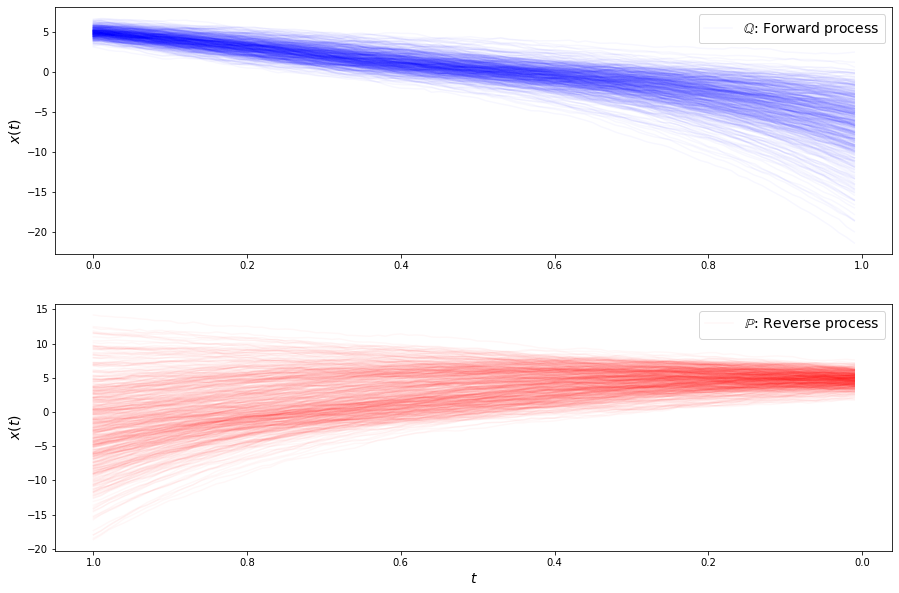

loss b 6.808590412139893
loss b 5.990694999694824
loss b 5.576056003570557
loss b 5.543656826019287
loss b 6.137616157531738
loss b 5.8566083908081055
loss b 5.684366226196289
loss b 5.967370986938477
loss b 5.957201957702637
loss b 6.025257110595703
loss b 5.41849422454834
loss b 6.612454414367676
loss b 6.196891784667969
loss b 6.384276866912842
loss b 5.90169095993042
loss b 5.573647975921631
loss b 6.241621971130371
loss b 6.503910541534424
loss b 6.204532623291016
loss b 6.55825662612915
loss b 5.709003448486328
loss b 6.3980631828308105
loss f 3.0234382152557373
loss f 3.0152475833892822
loss f 3.1553916931152344
loss f 3.0512468814849854
loss f 2.9915645122528076
loss f 3.057797908782959
loss f 3.085871458053589
loss f 2.9867115020751953
loss f 3.0211474895477295
loss f 3.024271011352539
loss f 3.0099220275878906
loss f 2.9315097332000732
loss f 3.025233745574951
loss f 3.0751118659973145
loss f 2.995393991470337
loss f 2.972566604614258
loss f 2.9732089042663574
loss f 3.120780

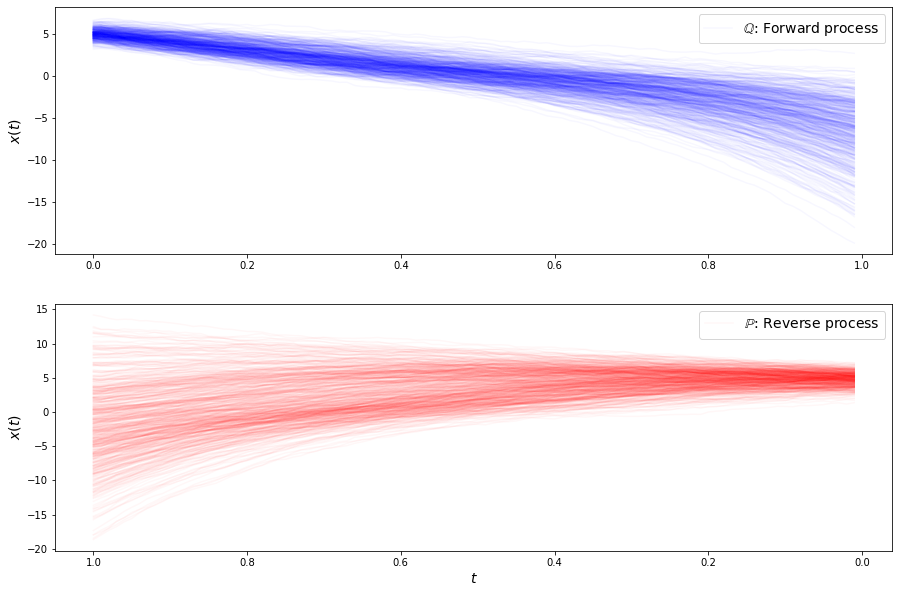

loss b 5.947412014007568
loss b 6.624622821807861
loss b 5.932616233825684
loss b 6.053005218505859
loss b 5.472840785980225
loss b 4.997842788696289
loss b 5.510439872741699
loss b 5.683451175689697
loss b 5.407177925109863
loss b 5.817625999450684
loss b 6.321062088012695
loss b 6.069869041442871
loss b 6.26089334487915
loss b 6.11852502822876
loss b 6.0386199951171875
loss b 5.318538665771484
loss b 5.032423973083496
loss b 6.172019004821777
loss b 6.138937950134277
loss b 5.778374195098877
loss b 5.8107500076293945
loss b 5.944411277770996
loss f 2.9651260375976562
loss f 3.0590224266052246
loss f 3.0363614559173584
loss f 3.0765182971954346
loss f 2.9778316020965576
loss f 3.0462660789489746
loss f 3.0287959575653076
loss f 3.111243486404419
loss f 3.086914539337158
loss f 2.9670939445495605
loss f 2.988219738006592
loss f 3.06607985496521
loss f 3.0795834064483643
loss f 2.937453269958496
loss f 3.035707950592041
loss f 3.0591719150543213
loss f 3.068237781524658
loss f 3.0465793

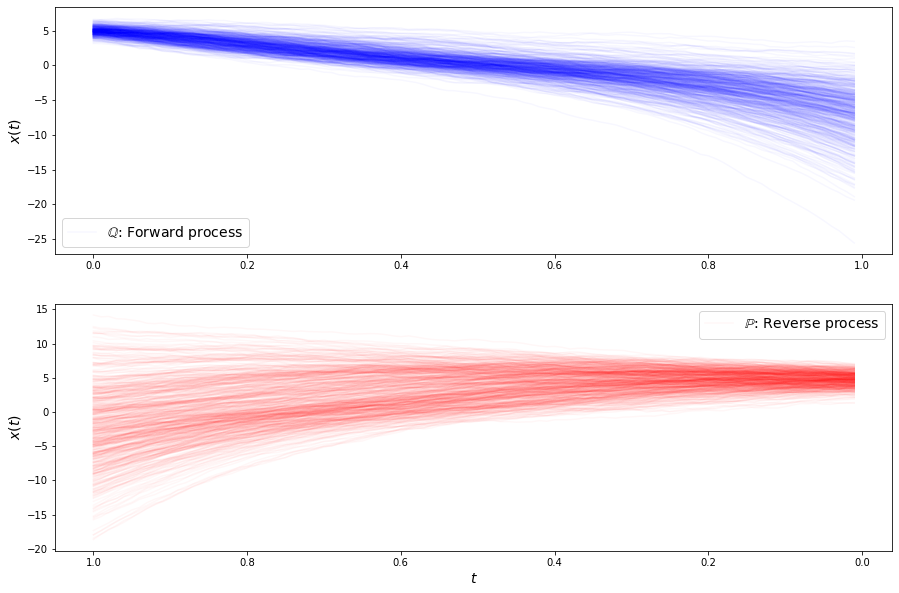

loss b 5.201873779296875
loss b 5.995621204376221
loss b 5.954165935516357
loss b 6.726729869842529
loss b 5.586875915527344
loss b 5.014998912811279
loss b 5.578711032867432
loss b 5.570314884185791
loss b 5.528634071350098
loss b 5.236321926116943
loss b 5.059179782867432
loss b 6.1368865966796875
loss b 6.114732265472412
loss b 6.113586902618408
loss b 5.623541831970215
loss b 6.586914539337158
loss b 6.759263038635254
loss b 5.394681930541992
loss b 5.405985355377197
loss b 5.5423479080200195
loss b 5.63462495803833
loss b 4.71416711807251
loss f 3.006446361541748
loss f 2.994518518447876
loss f 3.060633420944214
loss f 3.127333402633667
loss f 3.0596563816070557
loss f 2.979079008102417
loss f 3.0676918029785156
loss f 3.036191940307617
loss f 3.0764315128326416
loss f 3.175610065460205
loss f 3.0846972465515137
loss f 3.028419017791748
loss f 3.0321075916290283
loss f 3.024419069290161
loss f 2.9131689071655273
loss f 3.10064697265625
loss f 3.151534080505371
loss f 3.12885546684

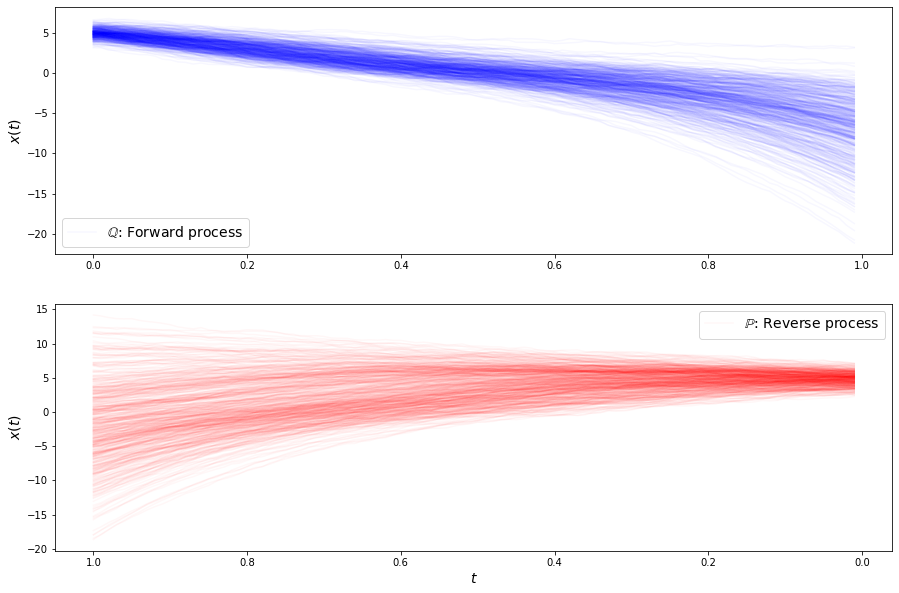

loss b 5.497300148010254
loss b 5.678605079650879
loss b 4.84486722946167
loss b 4.850175857543945
loss b 5.269562721252441
loss b 5.4903998374938965
loss b 5.538745880126953
loss b 5.680191993713379
loss b 5.072894096374512
loss b 5.054917812347412
loss b 6.003035068511963
loss b 5.262327194213867
loss b 5.477003574371338
loss b 5.308897972106934
loss b 5.199027061462402
loss b 4.832231044769287
loss b 5.594604969024658
loss b 6.28365421295166
loss b 5.355588436126709
loss b 5.720571994781494
loss b 5.2127180099487305
loss b 6.683337211608887
loss f 3.046696424484253
loss f 3.0263988971710205
loss f 3.1510255336761475
loss f 3.0888514518737793
loss f 3.1086063385009766
loss f 3.032848596572876
loss f 3.0719070434570312
loss f 3.0841643810272217
loss f 3.0959455966949463
loss f 3.127943515777588
loss f 3.1252546310424805
loss f 3.0622870922088623
loss f 3.179964303970337
loss f 3.0651540756225586
loss f 3.0976507663726807
loss f 3.083235502243042
loss f 3.0521225929260254
loss f 3.0480

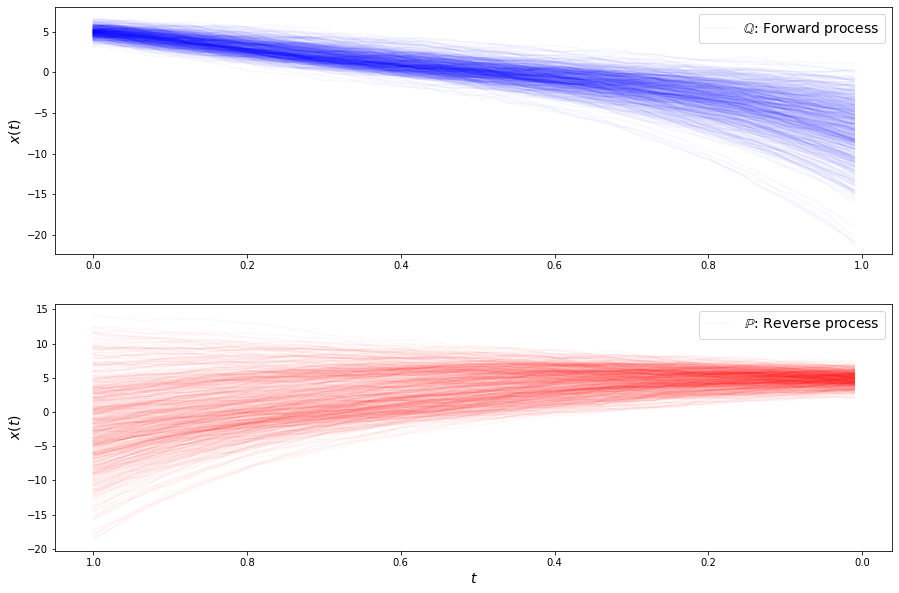

loss b 5.583477973937988
loss b 5.396748065948486
loss b 5.400566577911377
loss b 5.777157783508301
loss b 5.2744879722595215
loss b 5.454978942871094
loss b 5.4061689376831055
loss b 5.418071269989014
loss b 4.990594387054443
loss b 4.429739952087402
loss b 5.349783420562744
loss b 5.109626293182373
loss b 6.087087631225586
loss b 5.774209022521973
loss b 5.541136264801025
loss b 5.619068145751953
loss b 5.171844005584717
loss b 5.431797504425049
loss b 6.04783821105957
loss b 5.8581390380859375
loss b 5.588747978210449
loss b 4.6948699951171875
loss f 3.2143263816833496
loss f 3.121511459350586
loss f 3.0877254009246826
loss f 3.1431448459625244
loss f 3.093967914581299
loss f 3.131756544113159
loss f 3.1314001083374023
loss f 3.065419912338257
loss f 3.03952956199646
loss f 3.072974920272827
loss f 3.1113595962524414
loss f 3.1773314476013184
loss f 3.161778450012207
loss f 3.10593843460083
loss f 3.1365554332733154
loss f 3.0940849781036377
loss f 3.059732437133789
loss f 3.1202130

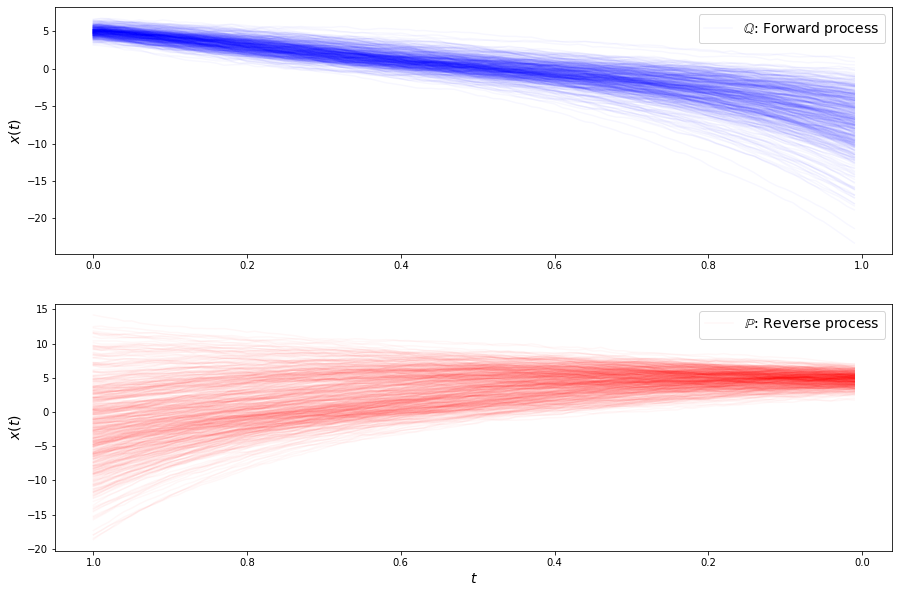

loss b 5.028267860412598
loss b 4.866824626922607
loss b 5.091166973114014
loss b 5.215315818786621
loss b 5.435132026672363
loss b 5.610682487487793
loss b 5.446286201477051
loss b 5.210848808288574
loss b 4.744760513305664
loss b 4.894493103027344
loss b 6.088627815246582
loss b 5.827322959899902
loss b 5.48159646987915
loss b 5.2814812660217285
loss b 5.29741096496582
loss b 5.488259792327881
loss b 4.938332557678223
loss b 4.794400691986084
loss b 6.017077445983887
loss b 5.727987766265869
loss b 5.043716907501221
loss b 4.992737293243408
loss f 3.1991844177246094
loss f 3.169086456298828
loss f 3.079603910446167
loss f 3.083277940750122
loss f 3.1657259464263916
loss f 3.069103479385376
loss f 3.0836539268493652
loss f 3.0694215297698975
loss f 3.1440374851226807
loss f 3.078953981399536
loss f 3.1057305335998535
loss f 3.226925849914551
loss f 3.1324758529663086
loss f 3.1994309425354004
loss f 3.1254775524139404
loss f 3.2873430252075195
loss f 3.309587001800537
loss f 3.1623384

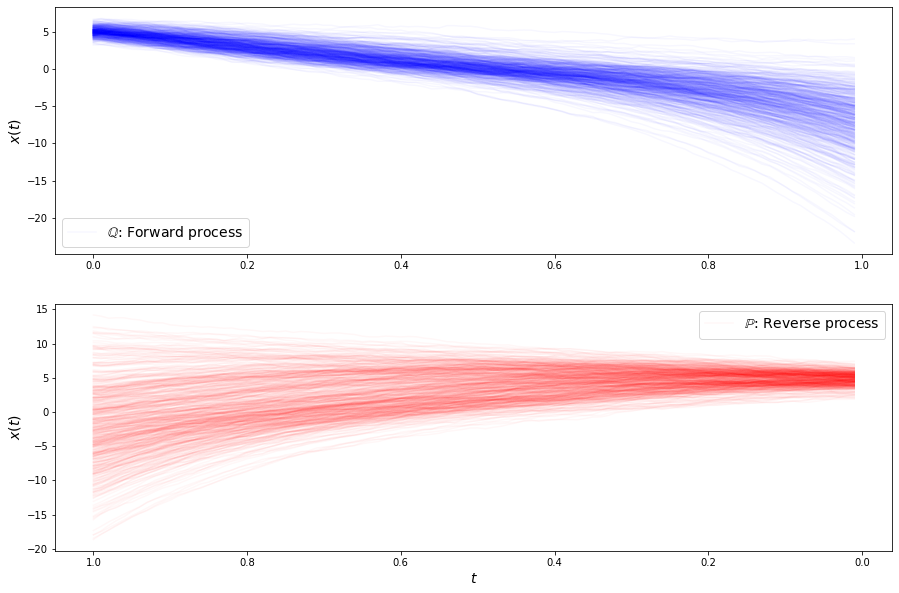

loss b 5.5710368156433105
loss b 4.661734104156494
loss b 5.159061908721924
loss b 5.241409778594971
loss b 5.466177940368652
loss b 4.575273513793945
loss b 5.4047675132751465
loss b 5.0018696784973145
loss b 5.079942226409912
loss b 5.69448184967041
loss b 5.034717082977295
loss b 5.354473114013672
loss b 5.185715198516846
loss b 5.103793621063232
loss b 4.584373474121094
loss b 5.740509033203125
loss b 5.591125011444092
loss b 4.959134578704834
loss b 4.594489574432373
loss b 5.064801216125488
loss b 5.1144537925720215
loss b 4.694036960601807
loss f 3.2943239212036133
loss f 3.1149353981018066
loss f 3.177088975906372
loss f 3.1286754608154297
loss f 3.2747039794921875
loss f 3.3865551948547363
loss f 3.2419919967651367
loss f 3.289560556411743
loss f 3.134006977081299
loss f 3.1002190113067627
loss f 3.226536989212036
loss f 3.215078592300415
loss f 3.1632111072540283
loss f 3.166234016418457
loss f 3.175018787384033
loss f 3.030299425125122
loss f 3.187066078186035
loss f 3.10043

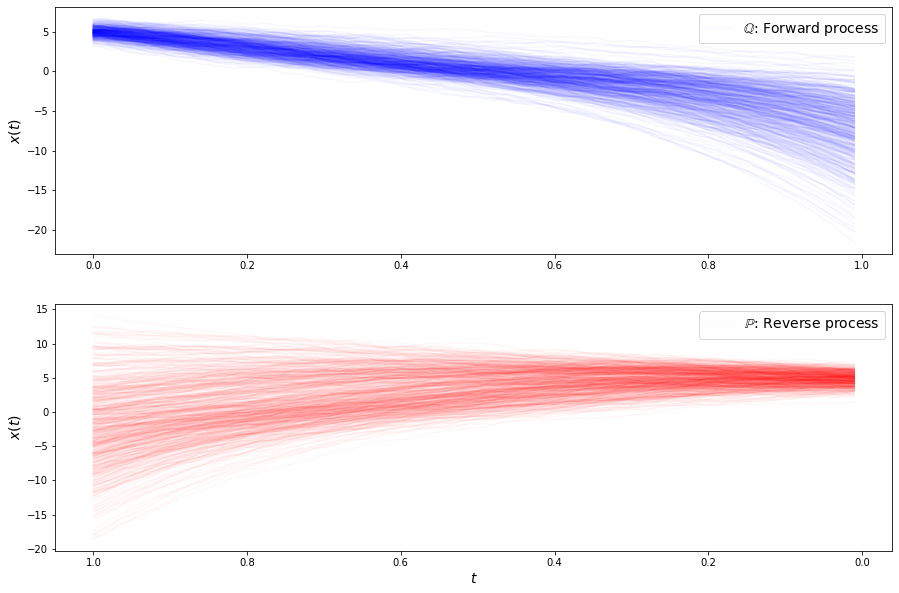

loss b 5.007450580596924
loss b 5.325766086578369
loss b 4.737296104431152
loss b 5.193595886230469
loss b 5.2153239250183105
loss b 4.74395227432251
loss b 4.858912467956543
loss b 4.5658721923828125
loss b 5.099673271179199
loss b 4.626430034637451
loss b 5.555224895477295
loss b 4.874959945678711
loss b 5.314495086669922
loss b 5.365262031555176
loss b 4.930939197540283
loss b 4.874932765960693
loss b 5.72483491897583
loss b 4.559114933013916
loss b 5.270834922790527
loss b 5.250281810760498
loss b 5.850681781768799
loss b 4.31474494934082
loss f 3.164968967437744
loss f 3.191581964492798
loss f 3.202929973602295
loss f 3.1568245887756348
loss f 3.2102749347686768
loss f 3.1988089084625244
loss f 3.123326063156128
loss f 3.246535062789917
loss f 3.1532509326934814
loss f 3.198730230331421
loss f 3.2155325412750244
loss f 3.139549970626831
loss f 3.2410945892333984
loss f 3.228341579437256
loss f 3.181994915008545
loss f 3.1087758541107178
loss f 3.2580347061157227
loss f 3.127806425

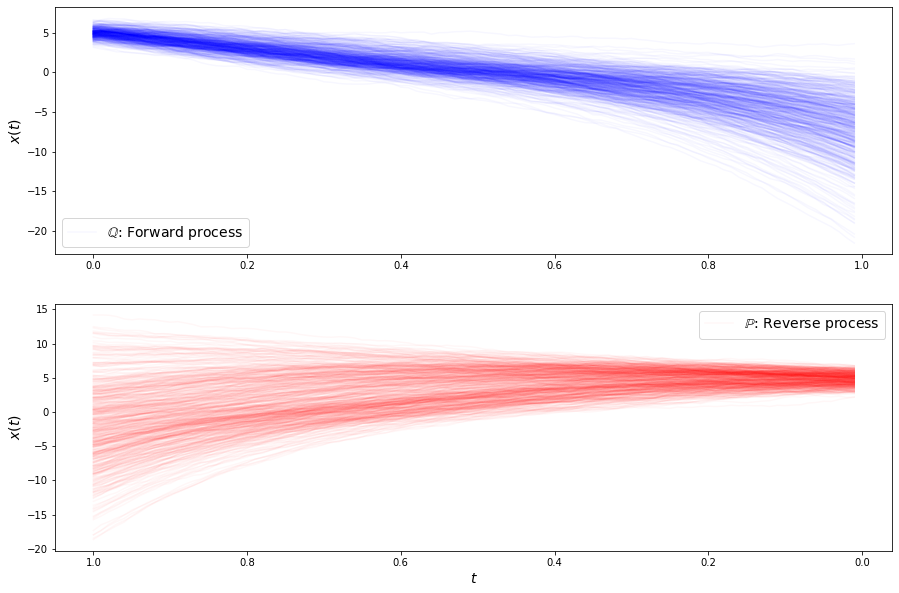

loss b 5.651918411254883
loss b 5.001813888549805
loss b 4.832006454467773
loss b 5.2002363204956055
loss b 4.719287872314453
loss b 5.836278438568115
loss b 5.280738830566406
loss b 5.050687789916992
loss b 4.977139949798584
loss b 4.861498832702637
loss b 5.2607598304748535
loss b 5.428390026092529
loss b 4.646477222442627
loss b 5.134483814239502
loss b 5.442438125610352
loss b 5.021971702575684
loss b 4.747901916503906
loss b 5.388673305511475
loss b 5.077205181121826
loss b 5.803760051727295
loss b 4.881898880004883
loss b 4.886691093444824
loss f 3.2403533458709717
loss f 3.2157318592071533
loss f 3.269700527191162
loss f 3.2059459686279297
loss f 3.2836804389953613
loss f 3.229065418243408
loss f 3.1901674270629883
loss f 3.1378173828125
loss f 3.211151599884033
loss f 3.2021114826202393
loss f 3.205375909805298
loss f 3.0930073261260986
loss f 3.2378647327423096
loss f 3.2439029216766357
loss f 3.1936066150665283
loss f 3.1853559017181396
loss f 3.2410764694213867
loss f 3.1630

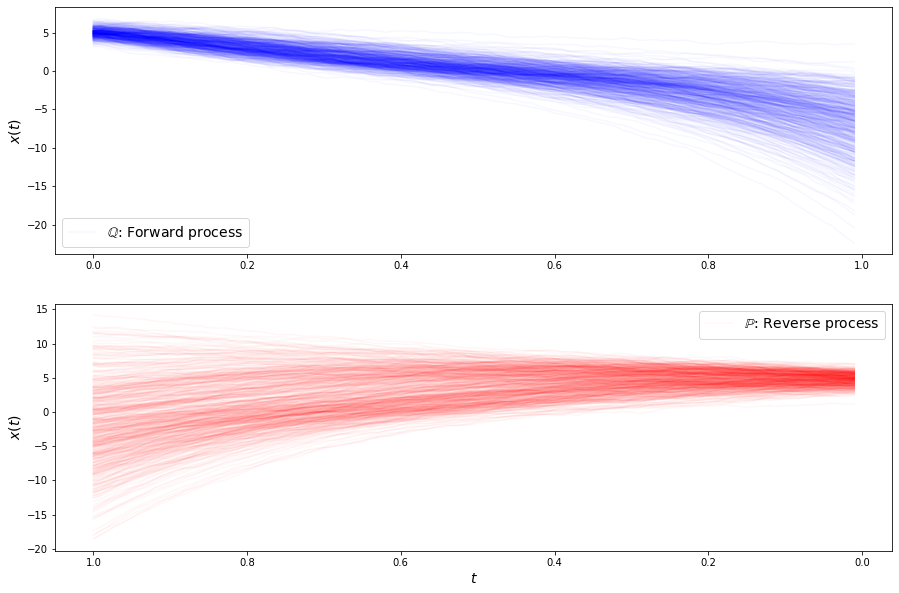

loss b 4.405395984649658
loss b 4.40313196182251
loss b 5.127317428588867
loss b 4.8799309730529785
loss b 5.341085910797119
loss b 4.470613956451416
loss b 4.5328369140625
loss b 5.787080764770508
loss b 5.198915958404541
loss b 4.8120808601379395
loss b 4.912670612335205
loss b 4.927804946899414
loss b 4.485535144805908
loss b 5.017367362976074
loss b 4.88350772857666
loss b 4.8635969161987305
loss b 5.1900315284729
loss b 4.894279956817627
loss b 5.686464786529541
loss b 4.529024124145508
loss b 5.026269435882568
loss b 5.805729866027832
loss f 3.2007482051849365
loss f 3.293262004852295
loss f 3.1810262203216553
loss f 3.308736562728882
loss f 3.182245969772339
loss f 3.414736032485962
loss f 3.2604875564575195
loss f 3.2531769275665283
loss f 3.212682008743286
loss f 3.2520594596862793
loss f 3.180727005004883
loss f 3.1880970001220703
loss f 3.503056049346924
loss f 3.155681610107422
loss f 3.276442527770996
loss f 3.4277708530426025
loss f 3.262990951538086
loss f 3.154690265655

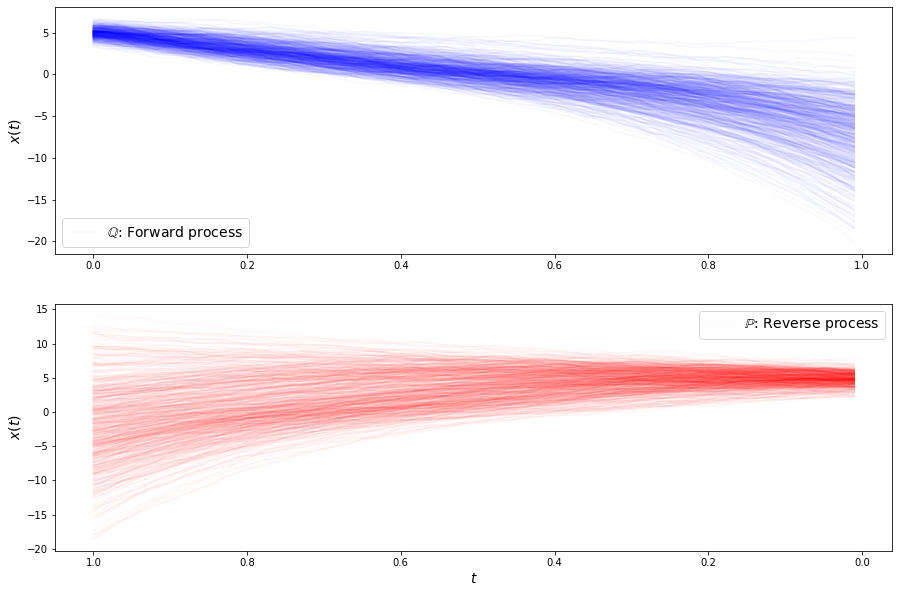

loss b 5.254088878631592
loss b 5.089017868041992
loss b 5.400709629058838
loss b 5.075840950012207
loss b 4.986990928649902
loss b 5.245304107666016
loss b 4.449490070343018
loss b 4.596461772918701
loss b 4.9514899253845215
loss b 6.31841516494751
loss b 4.603141784667969
loss b 4.475089073181152
loss b 4.976685047149658
loss b 5.021793842315674
loss b 4.685313701629639
loss b 4.440075874328613
loss b 4.728250503540039
loss b 4.6232686042785645
loss b 5.105175018310547
loss b 4.5969977378845215
loss b 4.448631763458252
loss b 5.345455646514893
loss f 3.422898530960083
loss f 3.1568119525909424
loss f 3.231691598892212
loss f 3.429180383682251
loss f 3.193941593170166
loss f 3.2435598373413086
loss f 3.2310893535614014
loss f 3.3306005001068115
loss f 3.14058256149292
loss f 3.254795789718628
loss f 3.1323297023773193
loss f 3.2278802394866943
loss f 3.122406005859375
loss f 3.284858465194702
loss f 3.2352755069732666
loss f 3.215480089187622
loss f 3.2164831161499023
loss f 3.2369050

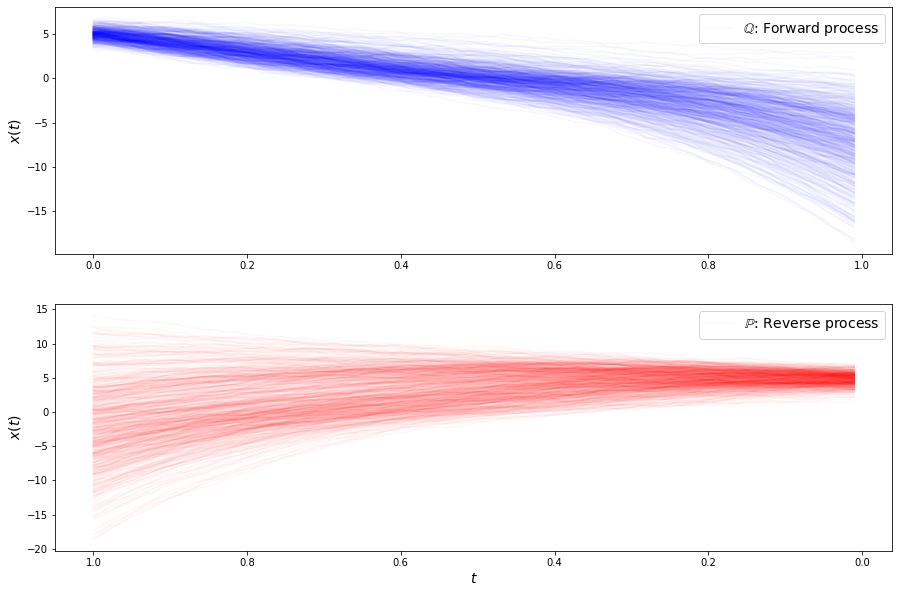

loss b 4.517093181610107
loss b 4.699388027191162
loss b 4.891604423522949
loss b 4.515561103820801
loss b 4.61809778213501
loss b 4.79940938949585
loss b 5.01001501083374
loss b 4.911896228790283
loss b 5.050642490386963
loss b 4.390086650848389
loss b 4.569859981536865
loss b 4.57110595703125
loss b 4.727718830108643
loss b 4.752798557281494
loss b 5.0299601554870605
loss b 5.39142370223999
loss b 4.103365421295166
loss b 5.660951137542725
loss b 5.213395118713379
loss b 4.241796970367432
loss b 4.317012786865234
loss b 5.104053974151611
loss f 3.2524845600128174
loss f 3.3434174060821533
loss f 3.201700448989868
loss f 3.252817392349243
loss f 3.253216028213501
loss f 3.1919965744018555
loss f 3.1382458209991455
loss f 3.304485559463501
loss f 3.3298749923706055
loss f 3.2202274799346924
loss f 3.2101540565490723
loss f 3.189317464828491
loss f 3.1814661026000977
loss f 3.2234303951263428
loss f 3.265455484390259
loss f 3.1844170093536377
loss f 3.269484043121338
loss f 3.3797791004

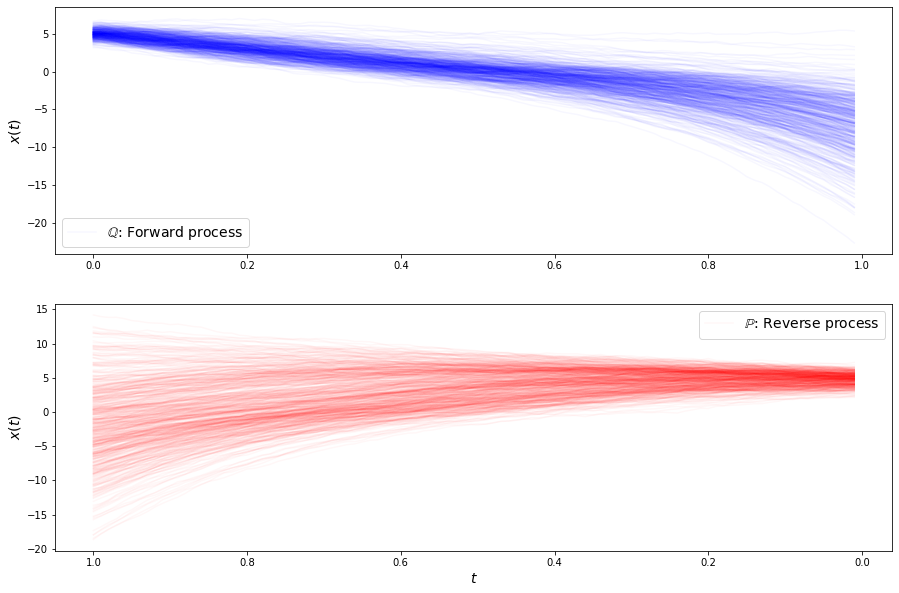

loss b 4.789825916290283
loss b 5.043076992034912
loss b 5.084933280944824
loss b 5.311886787414551
loss b 4.713781356811523
loss b 4.559511661529541
loss b 4.595211505889893
loss b 5.606377124786377
loss b 4.471972465515137
loss b 4.5844831466674805
loss b 4.5550432205200195
loss b 4.63369083404541
loss b 5.297107219696045
loss b 4.423625946044922
loss b 4.4540534019470215
loss b 4.850308895111084
loss b 4.551573276519775
loss b 5.093148231506348
loss b 4.299736976623535
loss b 5.0600409507751465
loss b 5.155436038970947
loss b 4.615320205688477
loss f 3.2848126888275146
loss f 3.290609359741211
loss f 3.2512049674987793
loss f 3.2564005851745605
loss f 3.2910847663879395
loss f 3.1545610427856445
loss f 3.252939462661743
loss f 3.2247979640960693
loss f 3.2357563972473145
loss f 3.3323967456817627
loss f 3.2487025260925293
loss f 3.324836492538452
loss f 3.220860481262207
loss f 3.283836603164673
loss f 3.235949993133545
loss f 3.288910150527954
loss f 3.332761287689209
loss f 3.2601

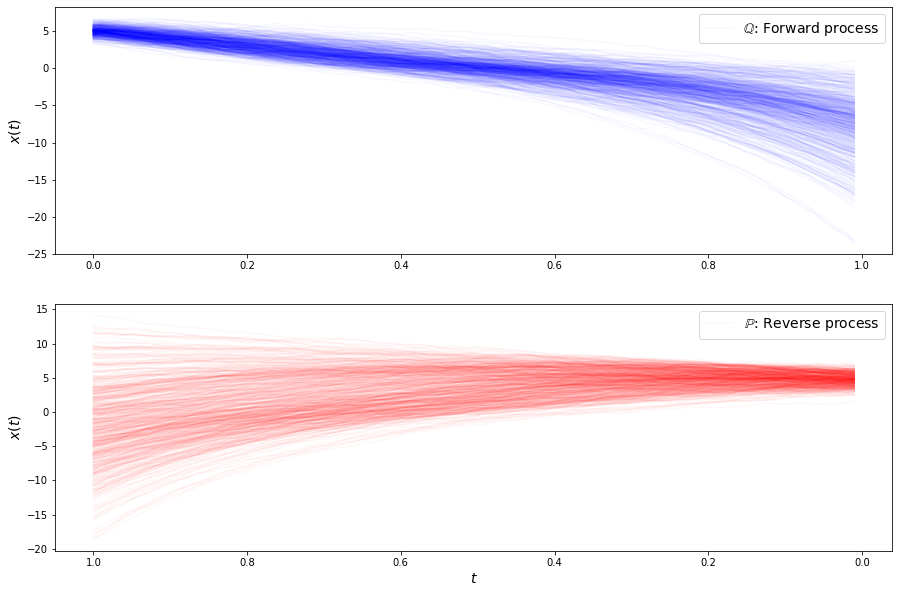

loss b 4.55403995513916
loss b 4.840714931488037
loss b 4.618932723999023
loss b 4.261829853057861
loss b 4.524965763092041
loss b 4.482641696929932
loss b 4.861921310424805
loss b 4.982505798339844
loss b 5.074741840362549
loss b 4.375860214233398
loss b 4.316316604614258
loss b 4.723834037780762
loss b 4.3726806640625
loss b 4.705721855163574
loss b 4.221815586090088
loss b 5.249606132507324
loss b 4.65915584564209
loss b 4.325088024139404
loss b 4.7440619468688965
loss b 4.25726318359375
loss b 4.633730888366699
loss b 4.157629489898682
loss f 3.163719654083252
loss f 3.290363311767578
loss f 3.220372438430786
loss f 3.198481559753418
loss f 3.265505075454712
loss f 3.288315773010254
loss f 3.239741325378418
loss f 3.3744239807128906
loss f 3.282586097717285
loss f 3.215399742126465
loss f 3.2822225093841553
loss f 3.2284817695617676
loss f 3.4831204414367676
loss f 3.22774600982666
loss f 3.210899591445923
loss f 3.269939661026001
loss f 3.1722607612609863
loss f 3.2313475608825684

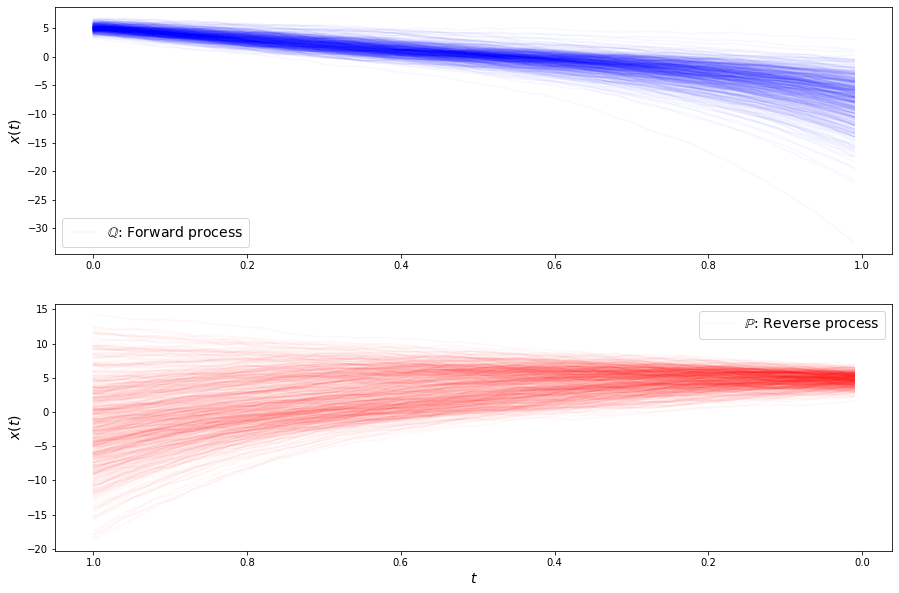

loss b 4.821263313293457
loss b 4.978222370147705
loss b 4.561398506164551
loss b 4.7537922859191895
loss b 4.612969875335693
loss b 4.424585819244385
loss b 4.551187038421631
loss b 4.804967403411865
loss b 4.9356536865234375
loss b 4.693596839904785
loss b 4.95773983001709
loss b 5.0364909172058105
loss b 5.407270908355713
loss b 4.97153377532959
loss b 4.408098220825195
loss b 5.055422782897949
loss b 5.157922267913818
loss b 4.380253314971924
loss b 4.540369987487793
loss b 5.050234794616699
loss b 4.650670051574707
loss b 4.626089096069336
loss f 3.3355135917663574
loss f 3.324740409851074
loss f 3.252270460128784
loss f 3.1632936000823975
loss f 3.380702257156372
loss f 3.2304811477661133
loss f 3.276360511779785
loss f 3.196484088897705
loss f 3.3283112049102783
loss f 3.32035493850708
loss f 3.2286601066589355
loss f 3.2581398487091064
loss f 3.194287061691284
loss f 3.23521089553833
loss f 3.2549893856048584
loss f 3.2581379413604736
loss f 3.268670082092285
loss f 3.255417585

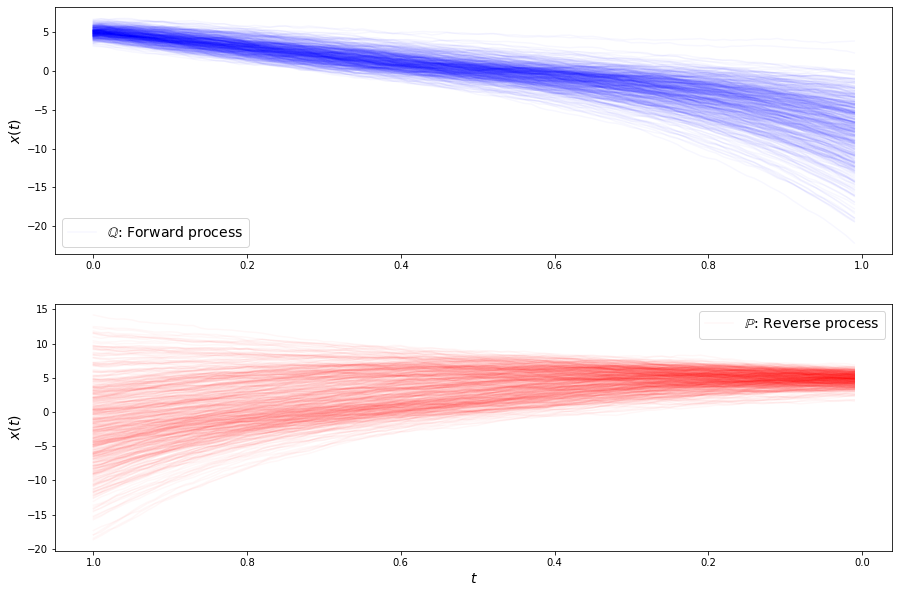

loss b 4.329702854156494
loss b 4.284361362457275
loss b 4.558992385864258
loss b 5.37496280670166
loss b 4.275733947753906
loss b 5.157595157623291
loss b 5.113407135009766
loss b 4.463788032531738
loss b 4.511457920074463
loss b 4.477150917053223
loss b 4.904387474060059
loss b 5.157856464385986
loss b 4.382139205932617
loss b 4.521275043487549
loss b 4.449792385101318
loss b 4.584140777587891
loss b 4.9275898933410645
loss b 4.42393684387207
loss b 4.639684200286865
loss b 5.026250839233398
loss b 5.570001602172852
loss b 4.232670783996582
loss f 3.2132019996643066
loss f 3.2714650630950928
loss f 3.3889236450195312
loss f 3.368683338165283
loss f 3.257495403289795
loss f 3.3205578327178955
loss f 3.284571886062622
loss f 3.31671404838562
loss f 3.25325345993042
loss f 3.1876964569091797
loss f 3.67860746383667
loss f 3.2322254180908203
loss f 3.1997134685516357
loss f 3.226757526397705
loss f 3.2060306072235107
loss f 3.3595645427703857
loss f 3.1875929832458496
loss f 3.3837485313

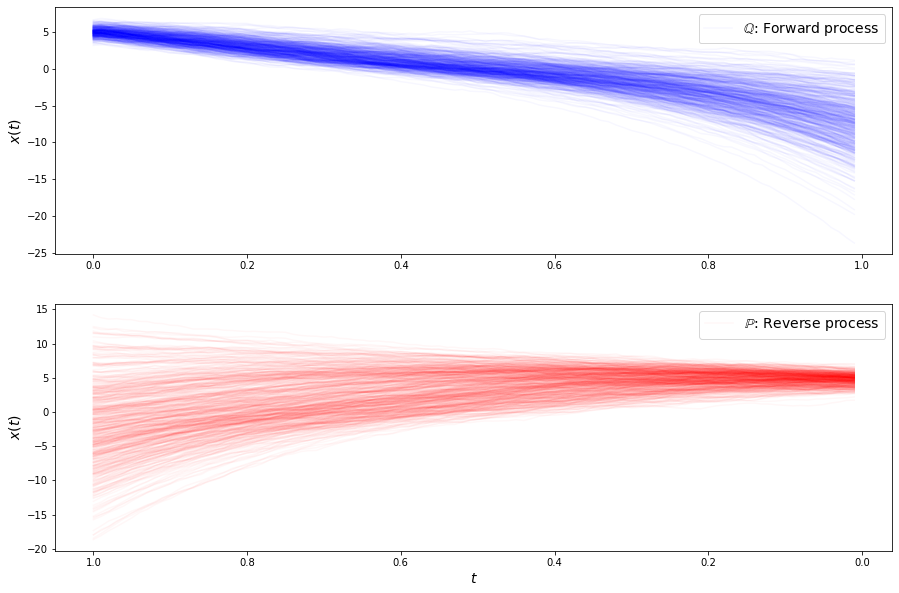

loss b 4.726908206939697
loss b 5.193199634552002
loss b 4.946887969970703
loss b 4.559717178344727
loss b 4.286542892456055
loss b 4.626882076263428
loss b 4.317911148071289
loss b 4.740774154663086
loss b 4.387420177459717
loss b 5.785668849945068
loss b 4.430096626281738
loss b 4.5955491065979
loss b 4.419302940368652
loss b 4.041732311248779
loss b 4.251914978027344
loss b 4.607058525085449
loss b 4.520293712615967
loss b 4.799997806549072
loss b 4.723849773406982
loss b 4.4665398597717285
loss b 5.097312927246094
loss b 4.493319988250732
loss f 3.2934184074401855
loss f 3.1564793586730957
loss f 3.3363354206085205
loss f 3.2420830726623535
loss f 3.3087334632873535
loss f 3.2669994831085205
loss f 3.290240526199341
loss f 3.1914634704589844
loss f 3.1123878955841064
loss f 3.2212717533111572
loss f 3.198070526123047
loss f 3.2249794006347656
loss f 3.244072198867798
loss f 3.2914328575134277
loss f 3.1727004051208496
loss f 3.1880545616149902
loss f 3.292231559753418
loss f 3.2183

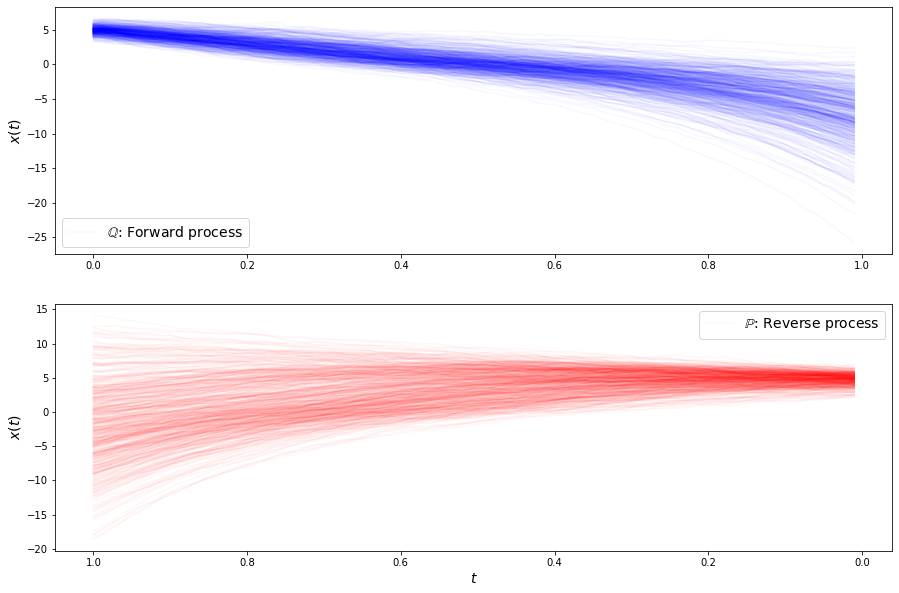

loss b 4.321591377258301
loss b 4.690272808074951
loss b 4.735208988189697
loss b 4.391630172729492
loss b 4.591079235076904
loss b 4.23771858215332
loss b 4.765750408172607
loss b 4.804450511932373
loss b 4.218924522399902
loss b 4.682568073272705
loss b 4.168143272399902
loss b 4.543278217315674
loss b 4.585753440856934
loss b 5.263451099395752
loss b 4.440120220184326
loss b 4.6026530265808105
loss b 4.6792144775390625
loss b 4.819215297698975
loss b 5.4532599449157715
loss b 5.537944793701172
loss b 4.7067108154296875
loss b 4.73374605178833
loss f 3.2960293292999268
loss f 3.3122715950012207
loss f 3.2003591060638428
loss f 3.2763524055480957
loss f 3.2555954456329346
loss f 3.2858924865722656
loss f 3.2063732147216797
loss f 3.2884061336517334
loss f 3.390441417694092
loss f 3.192147970199585
loss f 3.197146415710449
loss f 3.2861032485961914
loss f 3.2624926567077637
loss f 3.2178783416748047
loss f 3.3292903900146484
loss f 3.326273202896118
loss f 3.3470494747161865
loss f 3.3

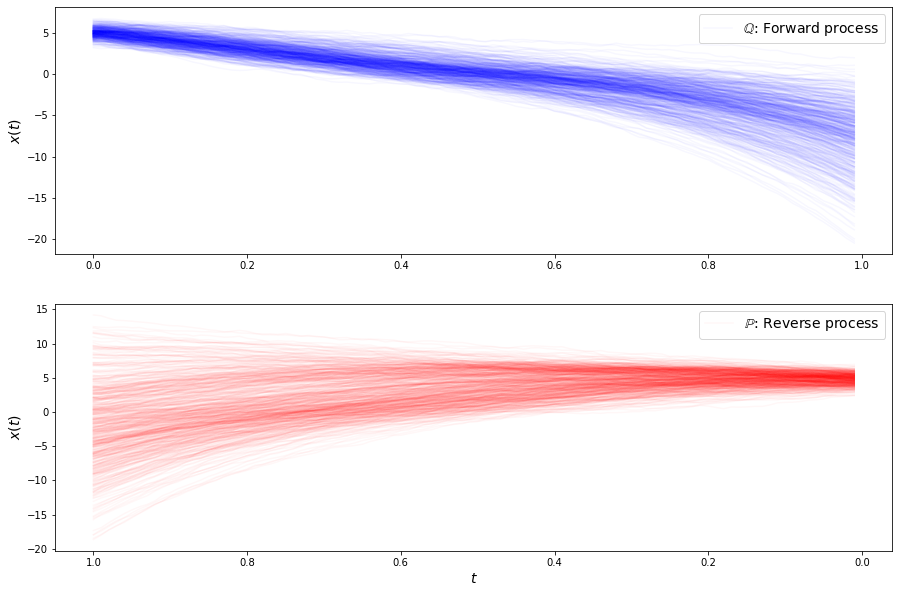

loss b 4.6809539794921875
loss b 4.298410892486572
loss b 4.392576694488525
loss b 5.648149490356445
loss b 4.74290657043457
loss b 3.9443440437316895
loss b 4.62011194229126
loss b 4.978274345397949
loss b 4.677787780761719
loss b 4.152207374572754
loss b 4.760402202606201
loss b 4.717306137084961
loss b 5.542230606079102
loss b 4.6984639167785645
loss b 4.270061492919922
loss b 4.0331645011901855
loss b 4.466693878173828
loss b 4.8580708503723145
loss b 5.575262069702148
loss b 4.970769882202148
loss b 4.753570556640625
loss b 4.732510566711426
loss f 3.4434614181518555
loss f 3.336514711380005
loss f 3.3317039012908936
loss f 3.4168026447296143
loss f 3.2666637897491455
loss f 3.337178945541382
loss f 3.1411564350128174
loss f 3.2383623123168945
loss f 3.2352654933929443
loss f 3.3546488285064697
loss f 3.2363553047180176
loss f 3.1823136806488037
loss f 3.3201146125793457
loss f 3.299474000930786
loss f 3.2271552085876465
loss f 3.2917914390563965
loss f 3.300614595413208
loss f 3.

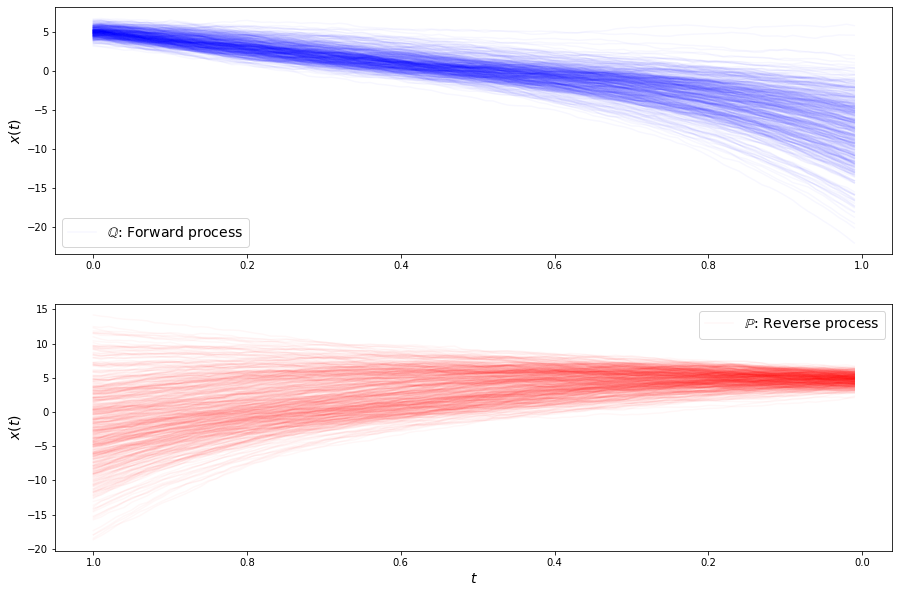

loss b 4.592563629150391
loss b 4.886569499969482
loss b 5.205138206481934
loss b 4.5319719314575195
loss b 4.384687900543213
loss b 4.651909828186035
loss b 4.766688823699951
loss b 4.776861190795898
loss b 4.508179187774658
loss b 4.519651889801025
loss b 4.89298152923584
loss b 4.944882392883301
loss b 4.679856777191162
loss b 4.831260681152344
loss b 5.180799961090088
loss b 5.096405029296875
loss b 4.934543132781982
loss b 4.520820140838623
loss b 4.47822904586792
loss b 4.582425117492676
loss b 4.482899188995361
loss b 4.590869903564453
loss f 3.242124557495117
loss f 3.291358232498169
loss f 3.268536329269409
loss f 3.3328020572662354
loss f 3.355745553970337
loss f 3.2822837829589844
loss f 3.380095958709717
loss f 3.403913736343384
loss f 3.204190492630005
loss f 3.289916515350342
loss f 3.3598785400390625
loss f 3.1921803951263428
loss f 3.3551180362701416
loss f 3.251082420349121
loss f 3.211313009262085
loss f 3.3105039596557617
loss f 3.2398712635040283
loss f 3.2637634277

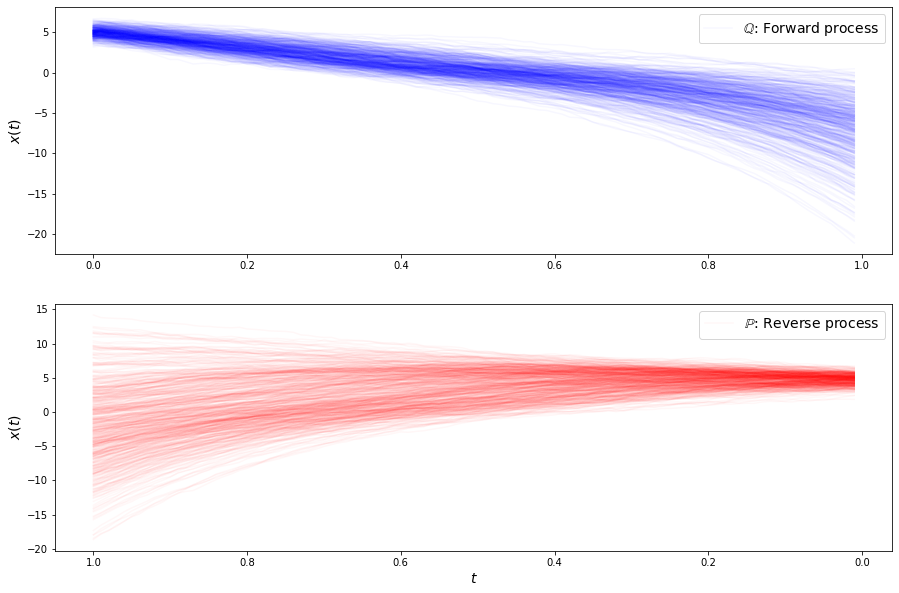

loss b 4.303479194641113
loss b 4.894779205322266
loss b 4.759538650512695
loss b 4.39646053314209
loss b 4.259724140167236
loss b 4.66761589050293
loss b 4.338266849517822
loss b 4.9234771728515625
loss b 4.65097188949585
loss b 4.631465911865234
loss b 5.231306076049805
loss b 5.215346813201904
loss b 4.746923923492432
loss b 4.820144176483154
loss b 4.292215824127197
loss b 5.053606986999512
loss b 4.676097869873047
loss b 4.849150657653809
loss b 4.319899559020996
loss b 4.830441474914551
loss b 4.549892902374268
loss b 4.781576156616211
loss f 3.3272905349731445
loss f 3.2729275226593018
loss f 3.330289840698242
loss f 3.223381757736206
loss f 3.281212329864502
loss f 3.259829044342041
loss f 3.267832040786743
loss f 3.247424602508545
loss f 3.3181800842285156
loss f 3.311631679534912
loss f 3.223541498184204
loss f 3.2809524536132812
loss f 3.237344741821289
loss f 3.3891613483428955
loss f 3.326124429702759
loss f 3.217941999435425
loss f 3.2449440956115723
loss f 3.287912607192

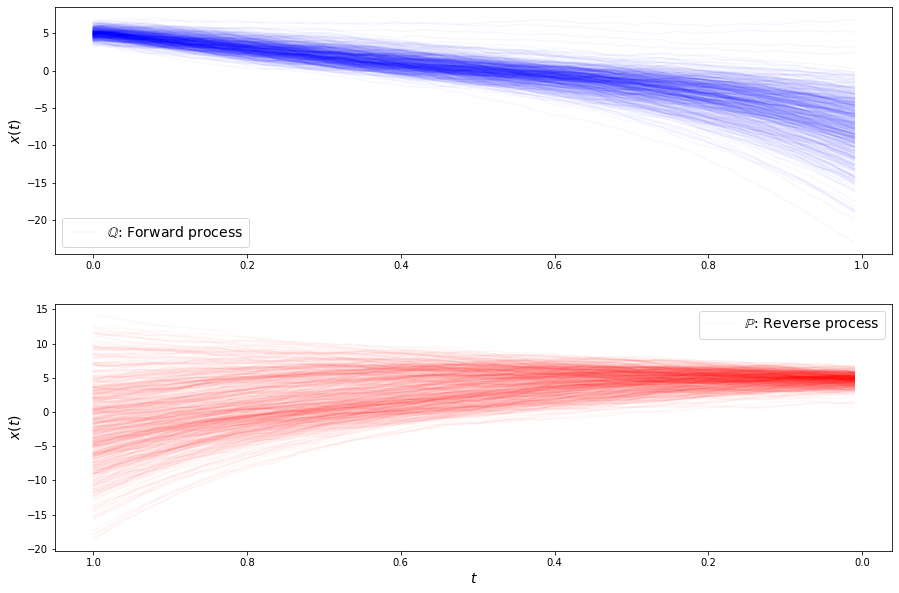

loss b 4.845337867736816
loss b 4.594022274017334
loss b 4.838654518127441
loss b 4.555350303649902
loss b 4.276495933532715
loss b 4.947897434234619
loss b 4.627236366271973
loss b 4.8428239822387695
loss b 5.20803165435791
loss b 4.670864105224609
loss b 4.485933303833008
loss b 4.832117080688477
loss b 4.288928985595703
loss b 4.654891014099121
loss b 4.757382392883301
loss b 4.361732006072998
loss b 4.515719890594482
loss b 5.531740188598633
loss b 4.5887017250061035
loss b 4.321313858032227
loss b 4.439165115356445
loss b 4.53103494644165
loss f 3.336237907409668
loss f 3.2893800735473633
loss f 3.3736560344696045
loss f 3.3366646766662598
loss f 3.3148086071014404
loss f 3.34055495262146
loss f 3.287325143814087
loss f 3.398672103881836
loss f 3.405329465866089
loss f 3.3536856174468994
loss f 3.2581615447998047
loss f 3.3245584964752197
loss f 3.2002875804901123
loss f 3.2902424335479736
loss f 3.295314073562622
loss f 3.2556989192962646
loss f 3.3519978523254395
loss f 3.285897

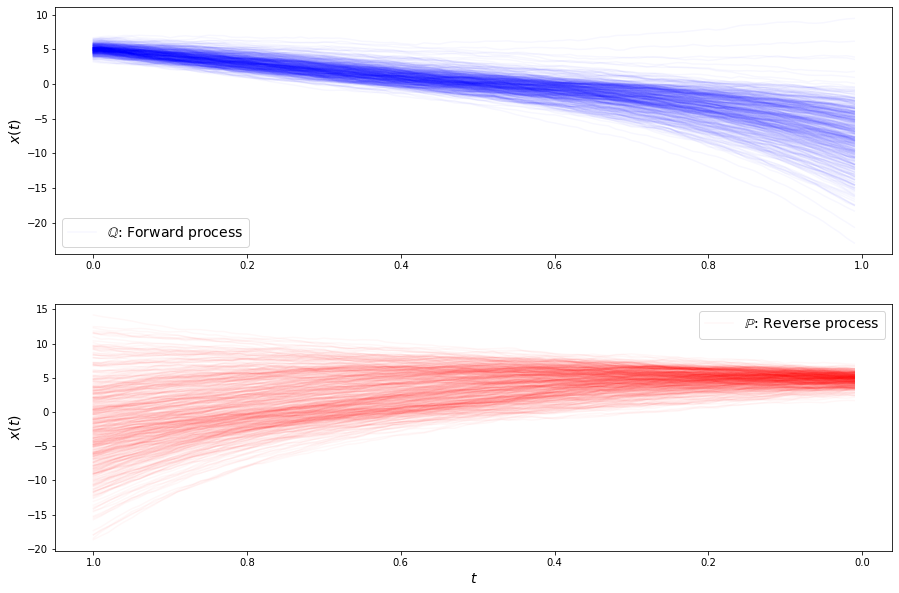

loss b 4.145901679992676
loss b 4.281120777130127
loss b 4.63787841796875
loss b 4.465534210205078
loss b 5.096475124359131
loss b 4.6292500495910645
loss b 4.673223972320557
loss b 4.482915878295898
loss b 4.5795207023620605
loss b 4.495753765106201
loss b 4.518343925476074
loss b 4.326848030090332
loss b 4.842976093292236
loss b 4.416532039642334
loss b 4.277071475982666
loss b 4.178121566772461
loss b 4.614688396453857
loss b 4.651653289794922
loss b 5.034381866455078
loss b 5.229603290557861
loss b 4.815878391265869
loss b 4.620779037475586
loss f 3.311713218688965
loss f 3.278494358062744
loss f 3.2719600200653076
loss f 3.4629147052764893
loss f 3.3295605182647705
loss f 3.3309824466705322
loss f 3.3618717193603516
loss f 3.4346184730529785
loss f 3.2543880939483643
loss f 3.2234816551208496
loss f 3.1667962074279785
loss f 3.3174889087677
loss f 3.26716947555542
loss f 3.2375597953796387
loss f 3.438098907470703
loss f 3.362640857696533
loss f 3.268599033355713
loss f 3.40838956

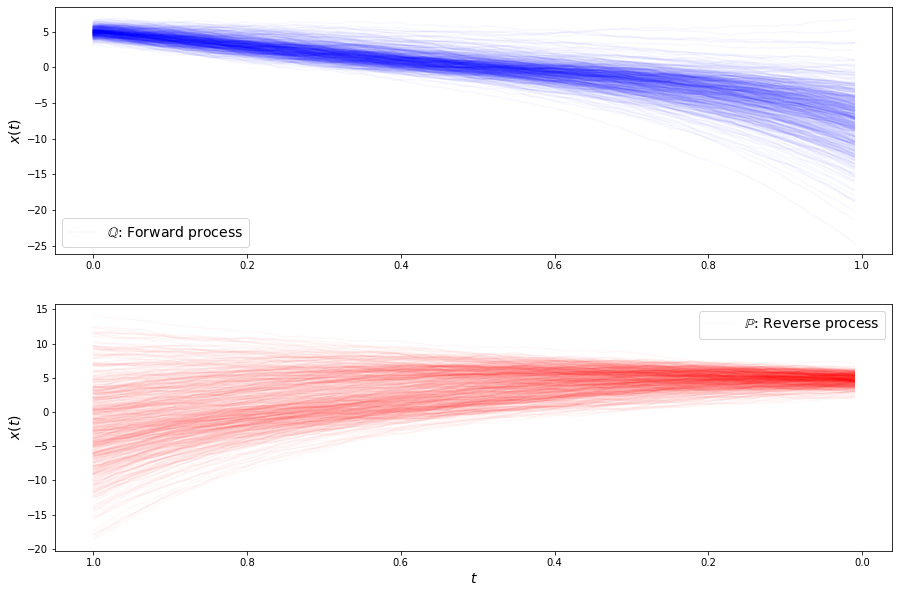

loss b 5.035988807678223
loss b 4.988161087036133
loss b 4.445415019989014
loss b 4.435873985290527
loss b 4.833198070526123
loss b 5.103340148925781
loss b 4.518779277801514
loss b 4.808709621429443
loss b 5.013244152069092
loss b 4.4555344581604
loss b 4.71872091293335
loss b 4.642237186431885
loss b 4.942594051361084
loss b 4.433290958404541
loss b 4.880049228668213
loss b 4.172682762145996
loss b 4.734964370727539
loss b 4.817934989929199
loss b 5.220309734344482
loss b 4.361745357513428
loss b 4.510255813598633
loss b 5.032182216644287
loss f 3.387784957885742
loss f 3.294342517852783
loss f 3.364945411682129
loss f 3.2818639278411865
loss f 3.428447723388672
loss f 3.2537076473236084
loss f 3.322805166244507
loss f 3.251718282699585
loss f 3.2750864028930664
loss f 3.453045606613159
loss f 3.3823463916778564
loss f 3.4335949420928955
loss f 3.417750597000122
loss f 3.2996201515197754
loss f 3.302769660949707
loss f 3.197324514389038
loss f 3.3446767330169678
loss f 3.226979970932

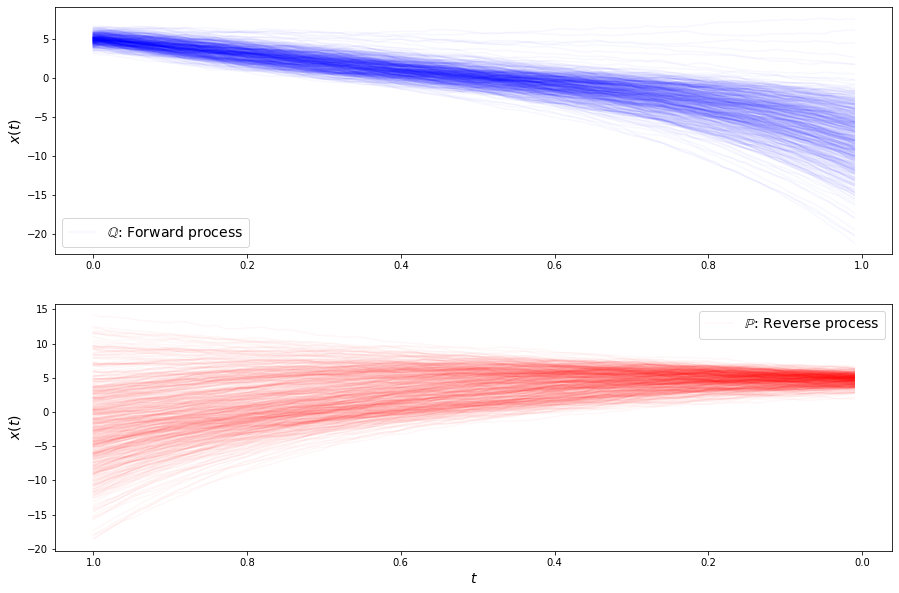

loss b 4.312929630279541
loss b 4.489992141723633
loss b 5.228501796722412
loss b 4.808047771453857
loss b 4.481821060180664
loss b 4.791299819946289
loss b 4.461312770843506
loss b 4.341976642608643
loss b 4.678437232971191
loss b 5.18779993057251
loss b 4.935644149780273
loss b 4.644265174865723
loss b 4.528530120849609
loss b 5.101734638214111
loss b 4.845416069030762
loss b 4.703635215759277
loss b 4.672708511352539
loss b 4.599701881408691
loss b 4.525320529937744
loss b 4.253028392791748
loss b 4.393529415130615
loss b 4.993334770202637
loss f 3.3775134086608887
loss f 3.2833099365234375
loss f 3.535583257675171
loss f 3.3085391521453857
loss f 3.502652645111084
loss f 3.303800582885742
loss f 3.3368494510650635
loss f 3.3470511436462402
loss f 3.2255914211273193
loss f 3.2787675857543945
loss f 3.35548734664917
loss f 3.3342700004577637
loss f 3.2361509799957275
loss f 3.372684955596924
loss f 3.2850170135498047
loss f 3.210974931716919
loss f 3.2945148944854736
loss f 3.2997937

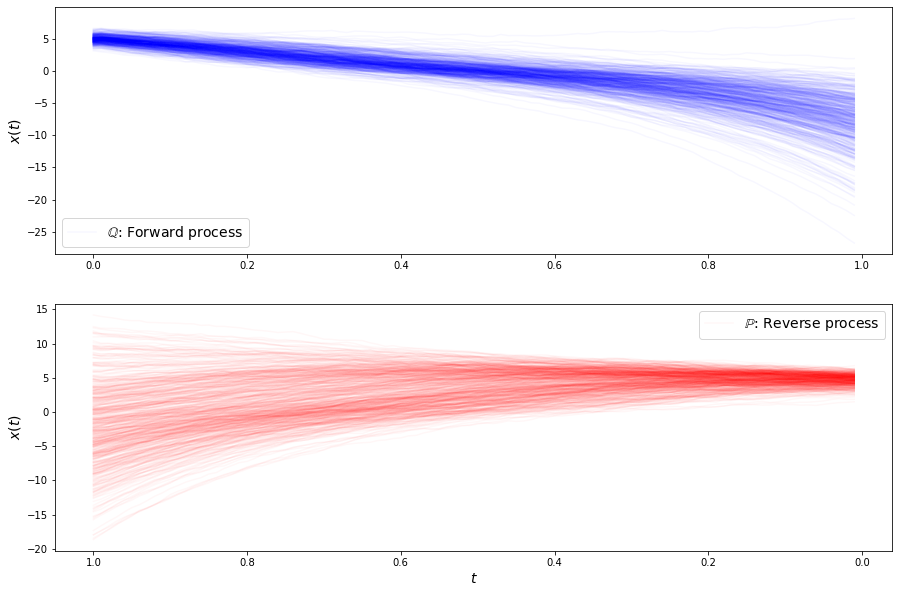

loss b 4.675990104675293
loss b 4.238393783569336
loss b 4.767943382263184
loss b 4.676210403442383
loss b 4.210886001586914
loss b 4.945024013519287
loss b 5.094422340393066
loss b 4.407011985778809
loss b 5.124133586883545
loss b 4.4202094078063965
loss b 4.948714733123779
loss b 4.274799823760986
loss b 4.614580154418945
loss b 5.103432655334473
loss b 4.111606597900391
loss b 4.52327823638916
loss b 4.984096050262451
loss b 4.80364990234375
loss b 4.937943935394287
loss b 4.698441028594971
loss b 4.745576858520508
loss b 4.352334976196289
loss f 3.3826704025268555
loss f 3.2438759803771973
loss f 3.319598913192749
loss f 3.3702635765075684
loss f 3.3349483013153076
loss f 3.327094078063965
loss f 3.303156614303589
loss f 3.24648118019104
loss f 3.3334529399871826
loss f 3.226443290710449
loss f 3.3645100593566895
loss f 3.3046417236328125
loss f 3.4363698959350586
loss f 3.3774139881134033
loss f 3.3164570331573486
loss f 3.2712464332580566
loss f 3.290647506713867
loss f 3.3867645

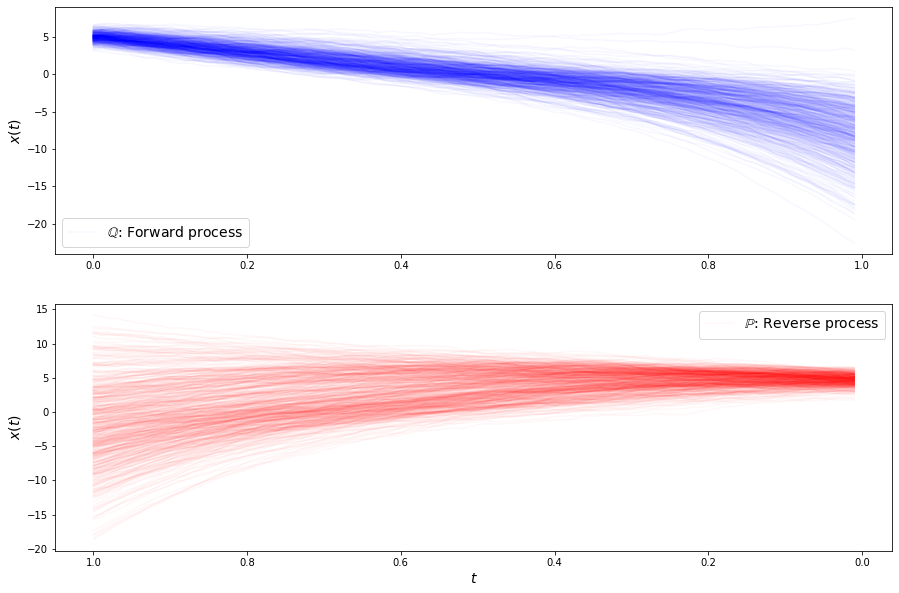

loss b 4.184431076049805
loss b 4.791386127471924
loss b 5.359612941741943
loss b 5.240174770355225
loss b 5.06619119644165
loss b 4.372456073760986
loss b 4.3599629402160645
loss b 4.634880542755127
loss b 5.5108184814453125
loss b 4.871457099914551
loss b 4.572795867919922
loss b 4.540250301361084
loss b 4.87518310546875
loss b 4.3405375480651855
loss b 4.435644149780273
loss b 4.09754753112793
loss b 4.412047863006592
loss b 4.592064380645752
loss b 4.4958295822143555
loss b 4.787994861602783
loss b 4.949449062347412
loss b 4.676840782165527
loss f 3.40340256690979
loss f 3.425499677658081
loss f 3.373605728149414
loss f 3.3319239616394043
loss f 3.3276309967041016
loss f 3.4730324745178223
loss f 3.2894418239593506
loss f 3.285705089569092
loss f 3.3564112186431885
loss f 3.4316859245300293
loss f 3.478332042694092
loss f 3.3417084217071533
loss f 3.3106582164764404
loss f 3.3932104110717773
loss f 3.3025989532470703
loss f 3.3412206172943115
loss f 3.3355064392089844
loss f 3.4277

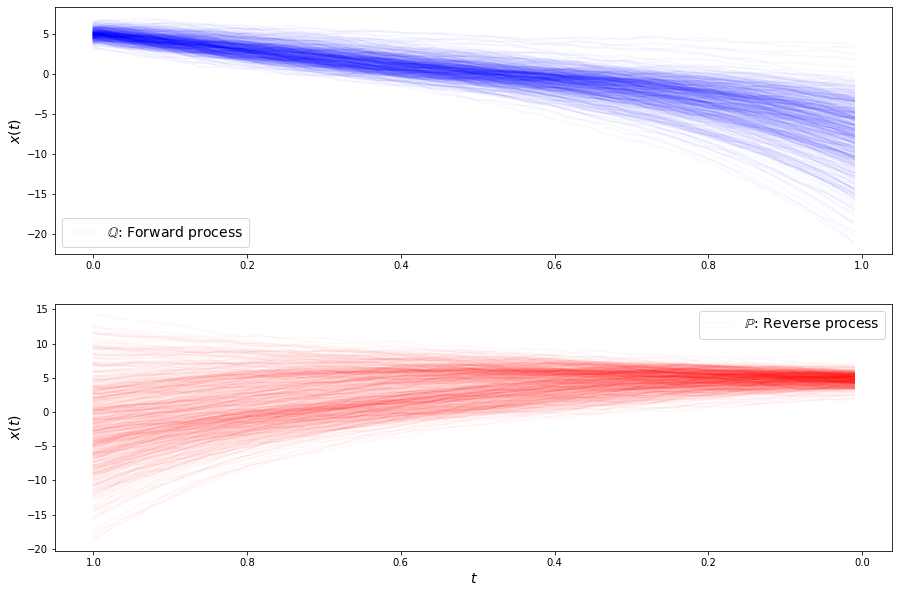

loss b 4.478145122528076
loss b 4.469156265258789
loss b 4.694685935974121
loss b 4.924716949462891
loss b 4.7943949699401855
loss b 4.684215068817139
loss b 4.2109856605529785
loss b 5.255650997161865
loss b 4.737505912780762
loss b 5.110323905944824
loss b 4.640172004699707
loss b 4.743227481842041
loss b 4.694456100463867
loss b 4.339773178100586
loss b 4.6659369468688965
loss b 4.711687088012695
loss b 4.900801658630371
loss b 4.39080810546875
loss b 4.562555313110352
loss b 4.188948154449463
loss b 4.361462593078613
loss b 4.659835338592529
loss f 3.209315776824951
loss f 3.214984655380249
loss f 3.2969133853912354
loss f 3.3238890171051025
loss f 3.269758462905884
loss f 3.43735408782959
loss f 3.2946619987487793
loss f 3.245965003967285
loss f 3.473592519760132
loss f 3.2534260749816895
loss f 3.2712113857269287
loss f 3.367539167404175
loss f 3.2863690853118896
loss f 3.32997727394104
loss f 3.2602548599243164
loss f 3.2316620349884033
loss f 3.1987898349761963
loss f 3.4398064

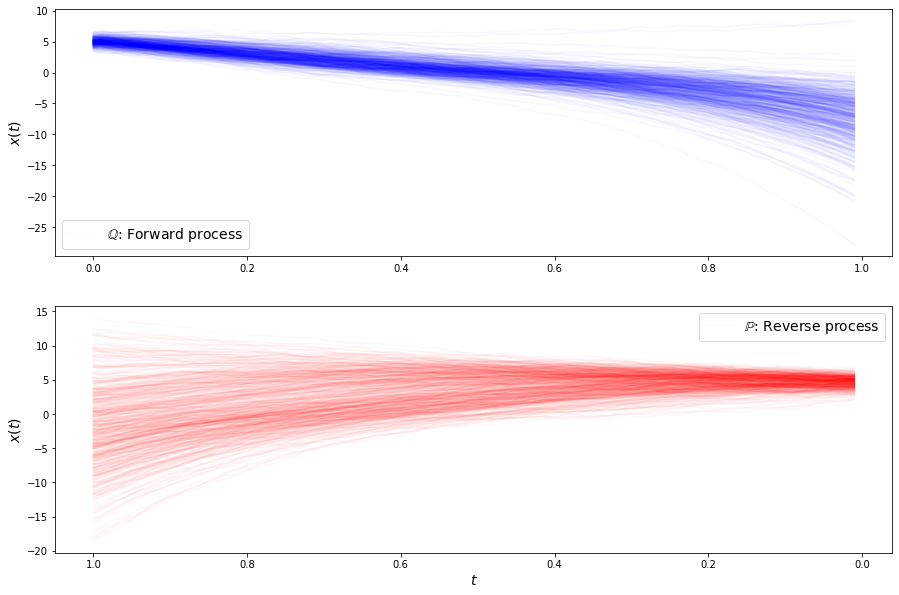

loss b 5.0181403160095215
loss b 4.782026290893555
loss b 4.572188377380371
loss b 4.869984149932861
loss b 5.031437397003174
loss b 5.366885185241699
loss b 4.79522180557251
loss b 4.431708812713623
loss b 4.730051040649414
loss b 4.633824825286865
loss b 4.218437194824219
loss b 5.019546985626221
loss b 4.501864433288574
loss b 4.981005668640137
loss b 4.511939525604248
loss b 4.687682151794434
loss b 4.760203838348389
loss b 5.313564300537109
loss b 4.525465965270996
loss b 4.455829620361328
loss b 4.233055591583252
loss b 4.9924211502075195
loss f 3.223752975463867
loss f 3.327960968017578
loss f 3.3243632316589355
loss f 3.370126962661743
loss f 3.251328468322754
loss f 3.2886135578155518
loss f 3.343618392944336
loss f 3.1940975189208984
loss f 3.2493584156036377
loss f 3.480865716934204
loss f 3.22123646736145
loss f 3.2932839393615723
loss f 3.342833995819092
loss f 3.2480885982513428
loss f 3.16465425491333
loss f 3.770301103591919
loss f 3.2634479999542236
loss f 3.3496372699

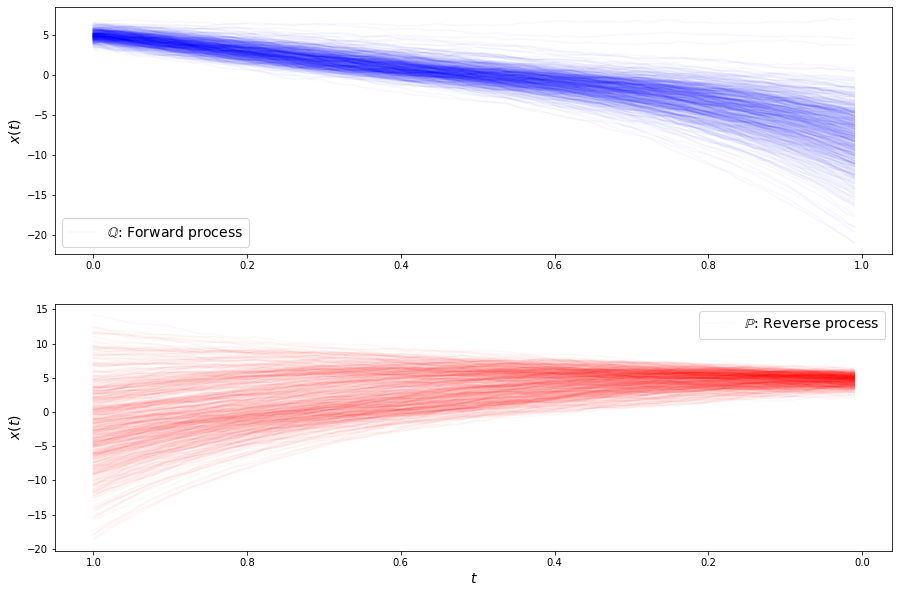

loss b 5.011911392211914
loss b 4.68610143661499
loss b 5.063469409942627
loss b 4.7935895919799805
loss b 4.3220438957214355
loss b 5.49479866027832
loss b 4.520974159240723
loss b 4.425066947937012
loss b 4.346858501434326
loss b 4.177835464477539
loss b 5.002486228942871
loss b 4.265693187713623
loss b 5.102729797363281
loss b 5.01833438873291
loss b 5.040070533752441
loss b 5.210926055908203
loss b 4.368068218231201
loss b 5.083745956420898
loss b 4.405476093292236
loss b 4.966296195983887
loss b 4.831800937652588
loss b 5.315485954284668
loss f 3.334545612335205
loss f 3.293174982070923
loss f 3.334595203399658
loss f 3.262279510498047
loss f 3.265160083770752
loss f 3.3735735416412354
loss f 3.281527042388916
loss f 3.1923134326934814
loss f 3.29538893699646
loss f 3.3870184421539307
loss f 3.2580924034118652
loss f 3.4157161712646484
loss f 3.2899482250213623
loss f 3.405191659927368
loss f 3.276372194290161
loss f 3.2922327518463135
loss f 3.3415279388427734
loss f 3.3610448837

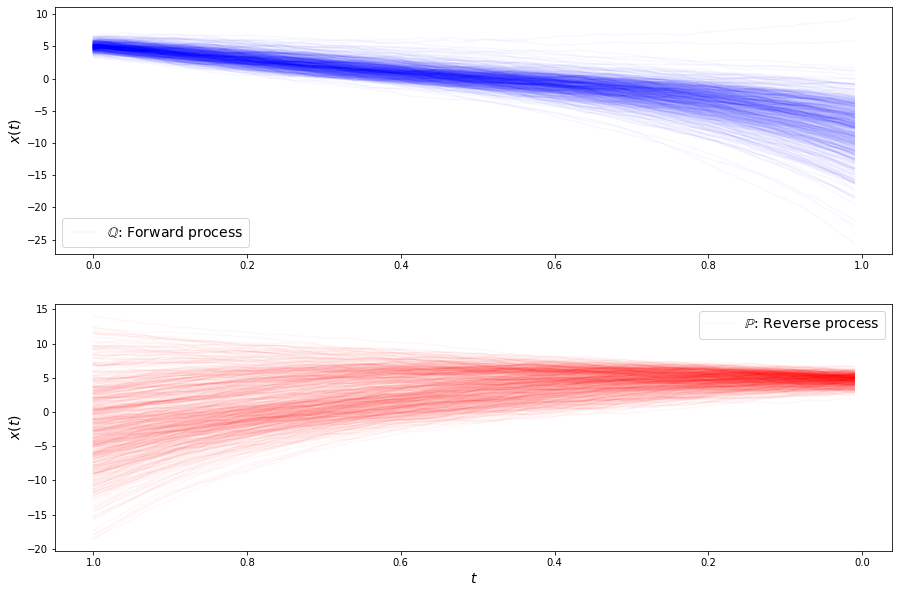

loss b 4.408077716827393
loss b 4.323966026306152
loss b 4.698484897613525
loss b 4.456226825714111
loss b 5.920483112335205
loss b 4.750829219818115
loss b 4.497532844543457
loss b 4.845119953155518
loss b 4.320166110992432
loss b 4.8980488777160645
loss b 4.736639976501465
loss b 5.141016006469727
loss b 5.265829563140869
loss b 4.620490074157715
loss b 4.419667720794678
loss b 4.494038105010986
loss b 4.500100135803223
loss b 5.024649143218994
loss b 4.7033820152282715
loss b 4.2427778244018555
loss b 4.5197367668151855
loss b 4.724903106689453
loss f 3.515937328338623
loss f 3.408764600753784
loss f 3.5035431385040283
loss f 3.283827066421509
loss f 3.2874560356140137
loss f 3.2952816486358643
loss f 3.3981430530548096
loss f 3.3001599311828613
loss f 3.334622383117676
loss f 3.4146389961242676
loss f 3.3163673877716064
loss f 3.39382266998291
loss f 3.281604051589966
loss f 3.401317596435547
loss f 3.2923190593719482
loss f 3.334238052368164
loss f 3.274838924407959
loss f 3.43110

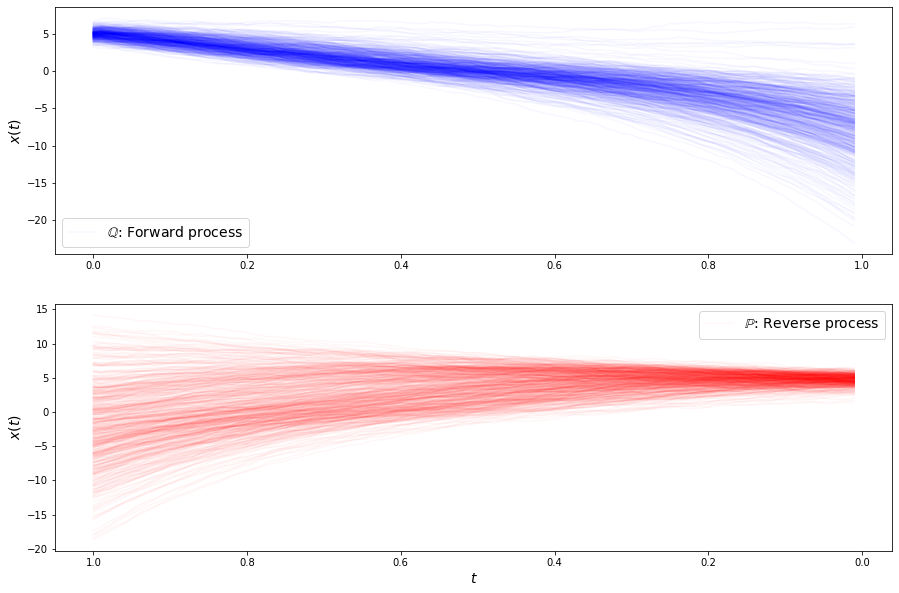

loss b 4.229692459106445
loss b 5.101867198944092
loss b 4.367629051208496
loss b 4.688042640686035
loss b 4.242229461669922
loss b 4.383594989776611
loss b 4.905025005340576
loss b 4.6078691482543945
loss b 4.370445728302002
loss b 4.863508224487305
loss b 4.569325923919678
loss b 4.731943607330322
loss b 4.596735000610352
loss b 4.828769683837891
loss b 4.576965808868408
loss b 4.85588264465332
loss b 4.551543712615967
loss b 4.662661075592041
loss b 4.674258232116699
loss b 4.9864678382873535
loss b 4.3417205810546875
loss b 4.783690929412842
loss f 3.3969318866729736
loss f 3.2858364582061768
loss f 3.25868821144104
loss f 3.269042491912842
loss f 3.3984215259552
loss f 3.348365545272827
loss f 3.364497184753418
loss f 3.2406375408172607
loss f 3.2610960006713867
loss f 3.3402254581451416
loss f 3.4855751991271973
loss f 3.341383457183838
loss f 3.425323963165283
loss f 3.247276544570923
loss f 3.2160205841064453
loss f 3.372554063796997
loss f 3.366701602935791
loss f 3.3088080883

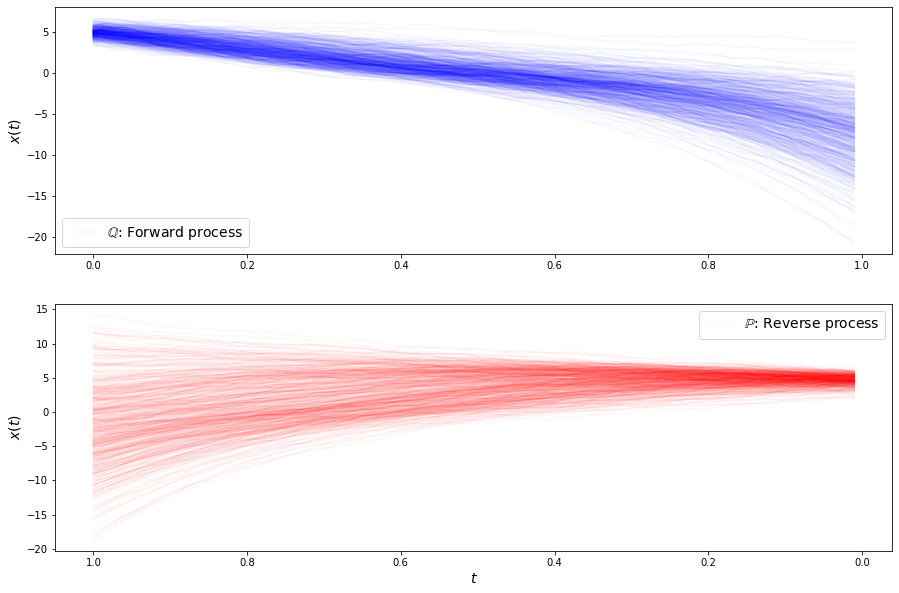

loss b 4.200377941131592
loss b 4.44053316116333
loss b 4.675326347351074
loss b 5.6123528480529785
loss b 4.605144023895264
loss b 4.628459453582764
loss b 4.577230930328369
loss b 4.591081142425537
loss b 4.588911533355713
loss b 4.474765300750732
loss b 4.474007606506348
loss b 4.902266025543213
loss b 4.754616737365723
loss b 4.224775791168213
loss b 4.629825592041016
loss b 4.55055570602417
loss b 4.538597106933594
loss b 4.525687217712402
loss b 4.517650127410889
loss b 5.803034782409668
loss b 4.827712535858154
loss b 4.956993103027344
loss f 3.3916609287261963
loss f 3.299021005630493
loss f 3.2989935874938965
loss f 3.3016812801361084
loss f 3.3640291690826416
loss f 3.247180223464966
loss f 3.2323598861694336
loss f 3.3313040733337402
loss f 3.228362798690796
loss f 3.4689559936523438
loss f 3.3695404529571533
loss f 3.2974228858947754
loss f 3.408665657043457
loss f 3.3728249073028564
loss f 3.324765205383301
loss f 3.3349390029907227
loss f 3.399381160736084
loss f 3.227767

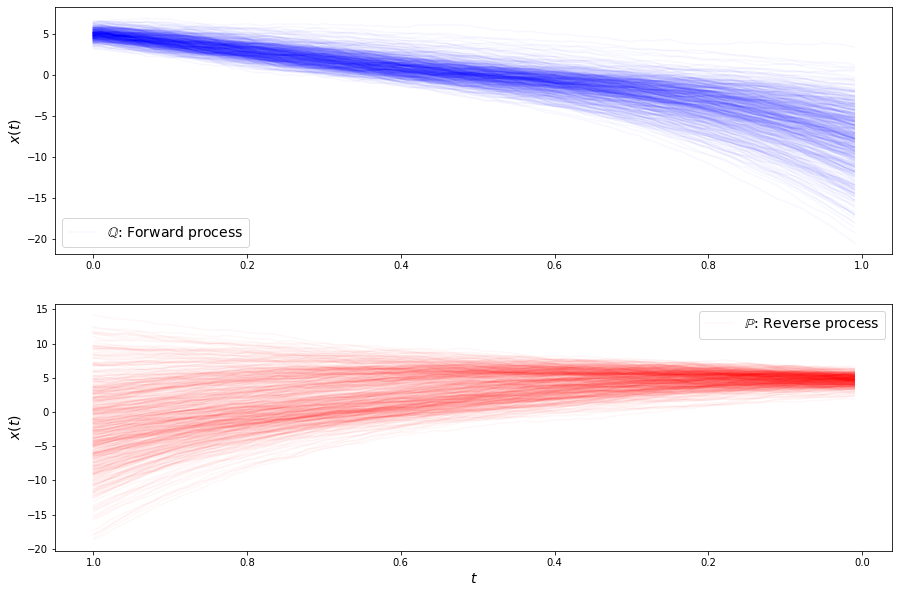

loss b 4.788054943084717
loss b 4.703862190246582
loss b 5.007147789001465
loss b 4.270229816436768
loss b 4.681848049163818
loss b 4.535106658935547
loss b 4.586740016937256
loss b 5.1870012283325195
loss b 4.624782085418701
loss b 4.682538032531738
loss b 4.839787006378174
loss b 4.851202011108398
loss b 4.526761054992676
loss b 4.2237868309021
loss b 4.865030288696289
loss b 4.5104875564575195
loss b 4.531919002532959
loss b 4.504272937774658
loss b 4.784060955047607
loss b 4.543546199798584
loss b 4.481659412384033
loss b 4.30673885345459
loss f 3.388420581817627
loss f 3.3025927543640137
loss f 3.4458060264587402
loss f 3.290680408477783
loss f 3.526834726333618
loss f 3.375814437866211
loss f 3.351351022720337
loss f 3.380525588989258
loss f 3.346275568008423
loss f 3.368056058883667
loss f 3.3010904788970947
loss f 3.471992254257202
loss f 3.3586177825927734
loss f 3.434691905975342
loss f 3.3728318214416504
loss f 3.4764623641967773
loss f 3.394131898880005
loss f 3.37564039230

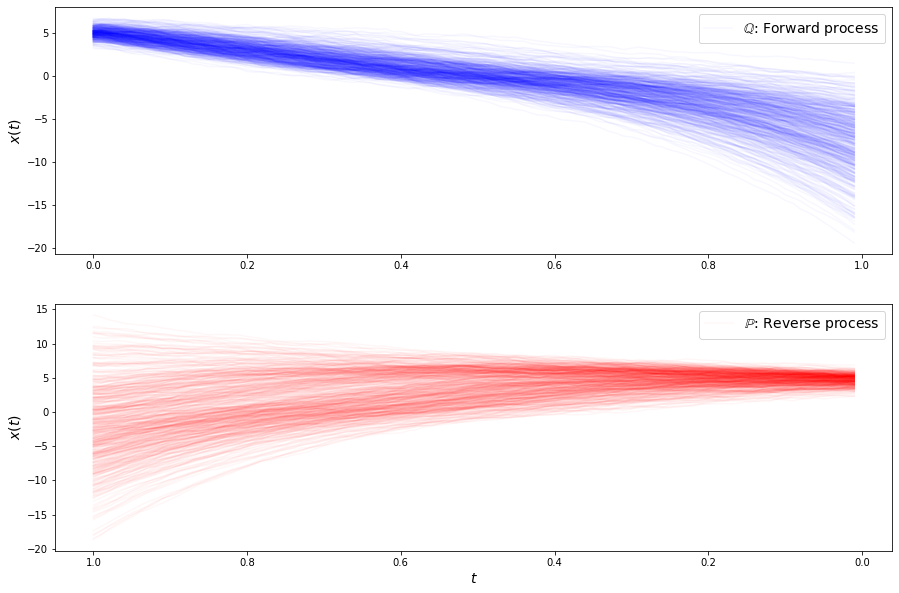

loss b 4.996081829071045
loss b 4.464416980743408
loss b 5.074859142303467
loss b 4.783444881439209
loss b 4.154521465301514
loss b 4.805575370788574
loss b 4.476741790771484
loss b 4.899425983428955
loss b 4.999465465545654
loss b 4.324793815612793
loss b 4.4401655197143555
loss b 4.699460029602051
loss b 5.024621963500977
loss b 4.7851996421813965
loss b 4.9456682205200195
loss b 4.40939998626709
loss b 4.51768684387207
loss b 4.825072765350342
loss b 4.43073034286499
loss b 4.526607990264893
loss b 4.4520368576049805
loss b 4.931630611419678
loss f 3.2762138843536377
loss f 3.3892109394073486
loss f 3.3258304595947266
loss f 3.4019994735717773
loss f 3.3362350463867188
loss f 3.351469039916992
loss f 3.34041690826416
loss f 3.3538260459899902
loss f 3.30476450920105
loss f 3.3835794925689697
loss f 3.289271116256714
loss f 3.414642333984375
loss f 3.397902011871338
loss f 3.3198044300079346
loss f 3.3180689811706543
loss f 3.2931299209594727
loss f 3.2793917655944824
loss f 3.357668

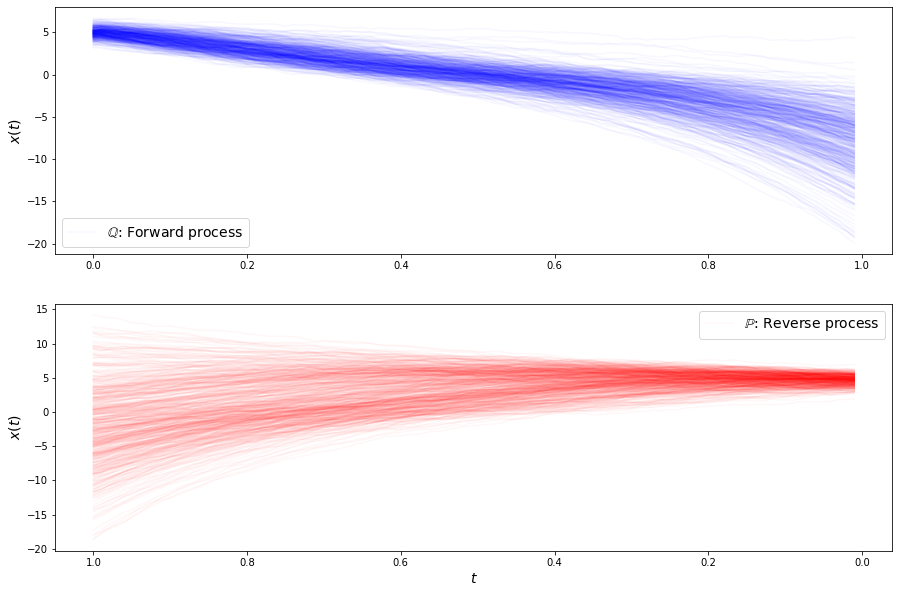

loss b 4.922298908233643
loss b 4.906850814819336
loss b 4.771428108215332
loss b 4.5833306312561035
loss b 4.927547454833984
loss b 5.12742805480957
loss b 4.804548263549805
loss b 4.555222034454346
loss b 5.269827842712402
loss b 4.556419849395752
loss b 4.9770588874816895
loss b 5.159144878387451
loss b 5.159264087677002
loss b 4.608058452606201
loss b 4.696424961090088
loss b 4.983311176300049
loss b 4.904694080352783
loss b 4.780271053314209
loss b 4.885396957397461
loss b 4.514241695404053
loss b 4.653232097625732
loss b 4.936529159545898
loss f 3.326422929763794
loss f 3.3353145122528076
loss f 3.3489110469818115
loss f 3.2762510776519775
loss f 3.2542874813079834
loss f 3.2820823192596436
loss f 3.3547744750976562
loss f 3.249075174331665
loss f 3.3561370372772217
loss f 3.2515878677368164
loss f 3.4938905239105225
loss f 3.425771474838257
loss f 3.359729051589966
loss f 3.4013476371765137
loss f 3.405116558074951
loss f 3.2805724143981934
loss f 3.29221510887146
loss f 3.34735

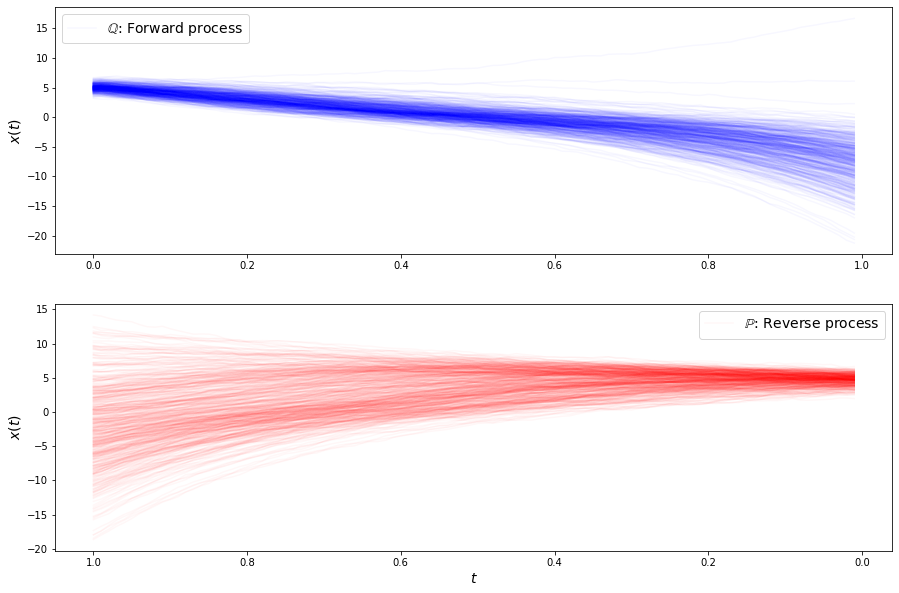

loss b 4.782051086425781
loss b 4.363423824310303
loss b 5.191891193389893
loss b 4.552133560180664
loss b 4.376321315765381
loss b 4.388547420501709
loss b 4.7902116775512695
loss b 4.334329128265381
loss b 5.513486862182617
loss b 4.802505016326904
loss b 4.69832706451416
loss b 4.900720596313477
loss b 4.485386848449707
loss b 4.715035915374756
loss b 4.680961608886719
loss b 4.78590202331543
loss b 4.8470659255981445
loss b 4.988093376159668
loss b 5.166808128356934
loss b 4.558028697967529
loss b 4.585848331451416
loss b 4.9708404541015625
loss f 3.365906000137329
loss f 3.3843789100646973
loss f 3.412476062774658
loss f 3.354370594024658
loss f 3.3288815021514893
loss f 3.2973508834838867
loss f 3.408837080001831
loss f 3.3945348262786865
loss f 3.278176784515381
loss f 3.293463945388794
loss f 3.3211829662323
loss f 3.4187169075012207
loss f 3.382385492324829
loss f 3.4053869247436523
loss f 3.4026713371276855
loss f 3.259587526321411
loss f 3.425692081451416
loss f 3.3399839401

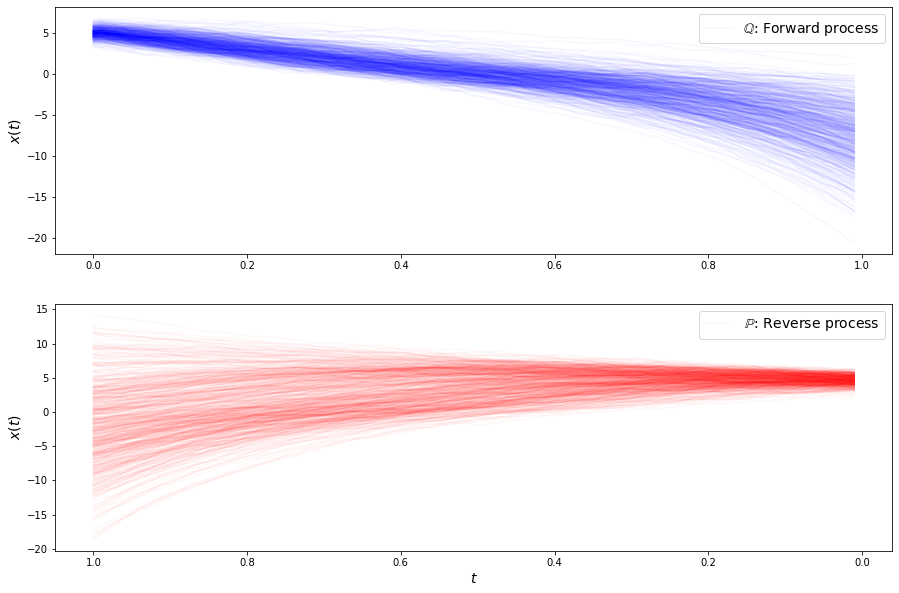

loss b 5.15189790725708
loss b 4.707005023956299
loss b 4.616829872131348
loss b 4.5556254386901855
loss b 5.084928035736084
loss b 5.376894474029541
loss b 4.527267932891846
loss b 4.878252029418945
loss b 5.615097999572754
loss b 4.458913803100586
loss b 4.495971202850342
loss b 4.4810099601745605
loss b 4.650371074676514
loss b 5.439297676086426
loss b 4.084991931915283
loss b 5.68183708190918
loss b 4.316641807556152
loss b 4.350614547729492
loss b 4.582808971405029
loss b 4.5944929122924805
loss b 4.44358491897583
loss b 4.595513343811035
loss f 3.4240520000457764
loss f 3.3349297046661377
loss f 3.4440174102783203
loss f 3.3350627422332764
loss f 3.298638105392456
loss f 3.345458507537842
loss f 3.2984778881073
loss f 3.5158145427703857
loss f 3.3840079307556152
loss f 3.250819444656372
loss f 3.398561477661133
loss f 3.4013831615448
loss f 3.3448359966278076
loss f 3.4704740047454834
loss f 3.3869431018829346
loss f 3.4480345249176025
loss f 3.297539710998535
loss f 3.4266040325

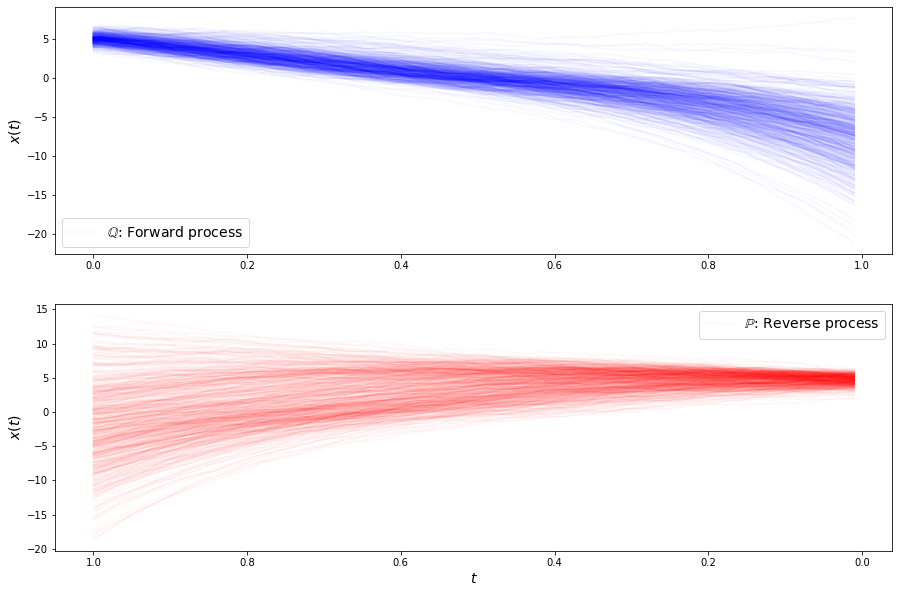

loss b 4.590925216674805
loss b 4.984157085418701
loss b 4.8765549659729
loss b 4.506714820861816
loss b 4.424946308135986
loss b 4.6925554275512695
loss b 4.879999160766602
loss b 4.179417610168457
loss b 5.014624118804932
loss b 4.326912879943848
loss b 4.866610050201416
loss b 4.896862506866455
loss b 4.833687782287598
loss b 4.554689407348633
loss b 4.867289066314697
loss b 4.40793514251709
loss b 4.954113006591797
loss b 4.459278106689453
loss b 4.757979869842529
loss b 4.534300804138184
loss b 4.664272308349609
loss b 4.466756343841553
loss f 3.303068161010742
loss f 3.3591995239257812
loss f 3.5164456367492676
loss f 3.421250581741333
loss f 3.311645030975342
loss f 3.3570055961608887
loss f 3.378659725189209
loss f 3.3401589393615723
loss f 3.3716204166412354
loss f 3.4553935527801514
loss f 3.295942544937134
loss f 3.3471736907958984
loss f 3.329812526702881
loss f 3.4481959342956543
loss f 3.3201794624328613
loss f 3.4583535194396973
loss f 3.4114179611206055
loss f 3.4052917

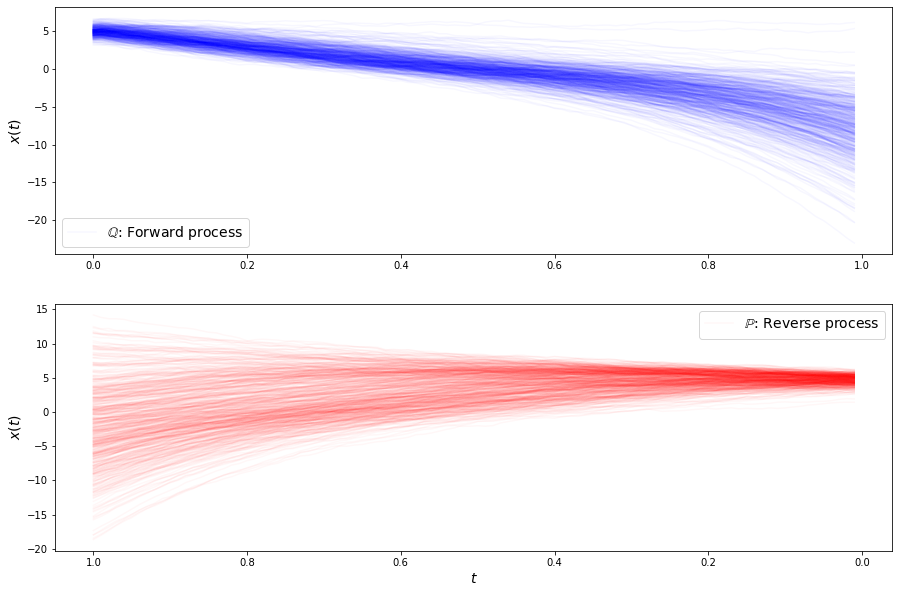

loss b 4.668666839599609
loss b 4.817787170410156
loss b 4.701927185058594
loss b 4.459061145782471
loss b 4.692567825317383
loss b 4.559690952301025
loss b 4.430599689483643
loss b 4.939717769622803
loss b 4.920694828033447
loss b 4.288798809051514
loss b 4.562318801879883
loss b 4.64193868637085
loss b 4.538651466369629
loss b 4.808180332183838
loss b 4.684587478637695
loss b 4.972593307495117
loss b 4.434002876281738
loss b 4.993865013122559
loss b 5.302539825439453
loss b 4.554172039031982
loss b 5.110745906829834
loss b 4.747867107391357
loss f 3.3445417881011963
loss f 3.2997004985809326
loss f 3.3417320251464844
loss f 3.407996654510498
loss f 3.364574670791626
loss f 3.366231918334961
loss f 3.3722174167633057
loss f 3.352877140045166
loss f 3.3986270427703857
loss f 3.264476776123047
loss f 3.3137102127075195
loss f 3.385849714279175
loss f 3.4978678226470947
loss f 3.2621378898620605
loss f 3.4037528038024902
loss f 3.3051514625549316
loss f 3.4363350868225098
loss f 3.392118

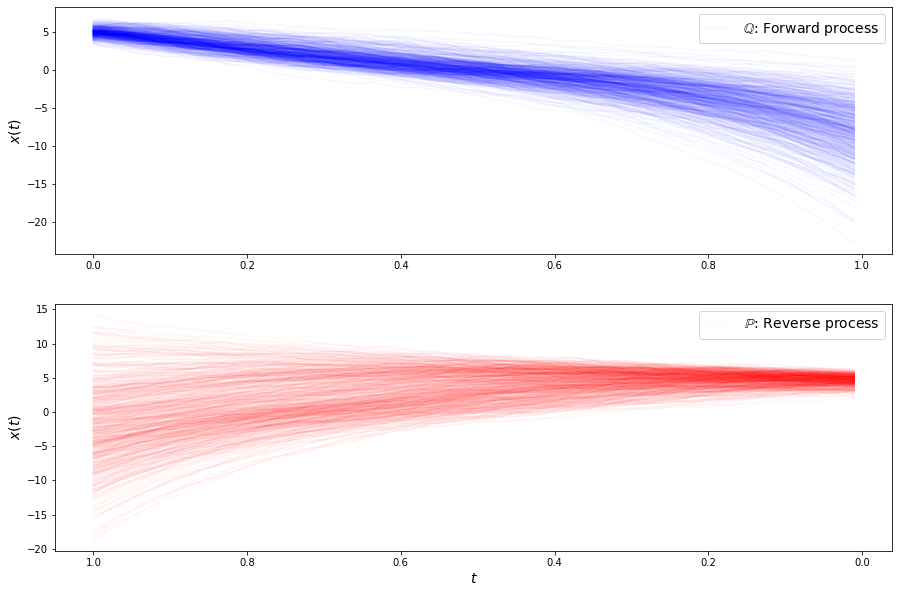

loss b 4.581356048583984
loss b 5.391693115234375
loss b 5.1714677810668945
loss b 4.538830280303955
loss b 4.743288040161133
loss b 5.133963108062744
loss b 5.1983842849731445
loss b 5.712867736816406
loss b 4.494229316711426
loss b 4.647796630859375
loss b 4.537092208862305
loss b 5.394614219665527
loss b 4.76355504989624
loss b 5.069112300872803
loss b 4.682247161865234
loss b 5.188090801239014
loss b 4.500870227813721
loss b 4.938516616821289
loss b 4.64257287979126
loss b 5.195119857788086
loss b 4.57827615737915
loss b 4.587251663208008
loss f 3.381723403930664
loss f 3.301447868347168
loss f 3.4424874782562256
loss f 3.3938379287719727
loss f 3.427731513977051
loss f 3.428849220275879
loss f 3.348050117492676
loss f 3.367361545562744
loss f 3.212721109390259
loss f 3.2833330631256104
loss f 3.314969539642334
loss f 3.3481955528259277
loss f 3.256540298461914
loss f 3.3695058822631836
loss f 3.341386079788208
loss f 3.3230278491973877
loss f 3.4599575996398926
loss f 3.3985705375

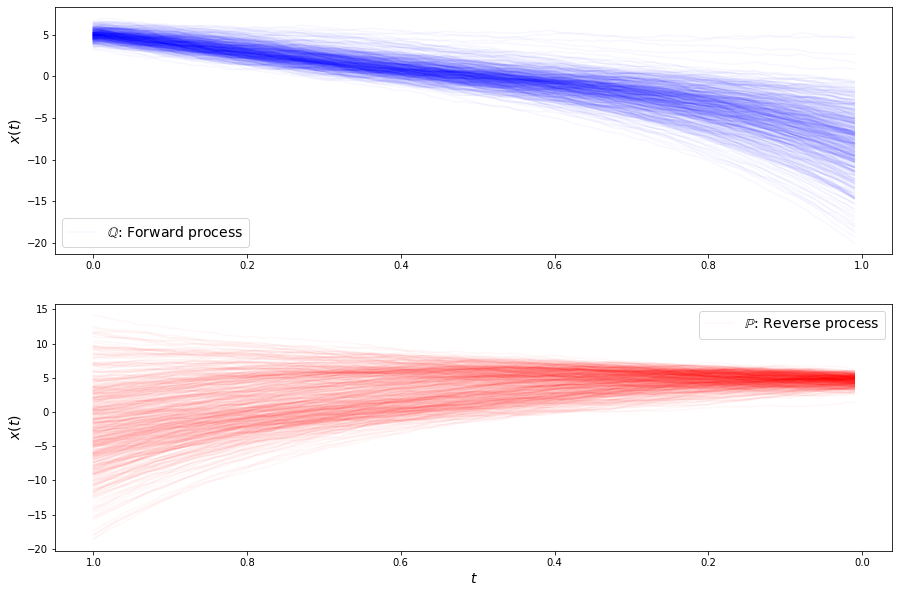

loss b 5.516566276550293
loss b 5.1536383628845215
loss b 4.711266994476318
loss b 5.148286819458008
loss b 4.747117519378662
loss b 4.858805179595947
loss b 4.882661819458008
loss b 5.550570964813232
loss b 4.537690162658691
loss b 4.431550025939941
loss b 4.7604827880859375
loss b 5.218723297119141
loss b 4.967084884643555
loss b 4.59910249710083
loss b 4.91698694229126
loss b 5.724588871002197
loss b 4.643952369689941
loss b 4.72977876663208
loss b 4.615971088409424
loss b 4.676743030548096
loss b 4.636153221130371
loss b 4.491796970367432
loss f 3.332155466079712
loss f 3.1689064502716064
loss f 3.459733009338379
loss f 3.3583765029907227
loss f 3.351356029510498
loss f 3.3351352214813232
loss f 3.345078945159912
loss f 3.3832879066467285
loss f 3.3788206577301025
loss f 3.3975329399108887
loss f 3.3618385791778564
loss f 3.3148059844970703
loss f 3.4751906394958496
loss f 3.3243517875671387
loss f 3.4508399963378906
loss f 3.4607479572296143
loss f 3.330125570297241
loss f 3.39428

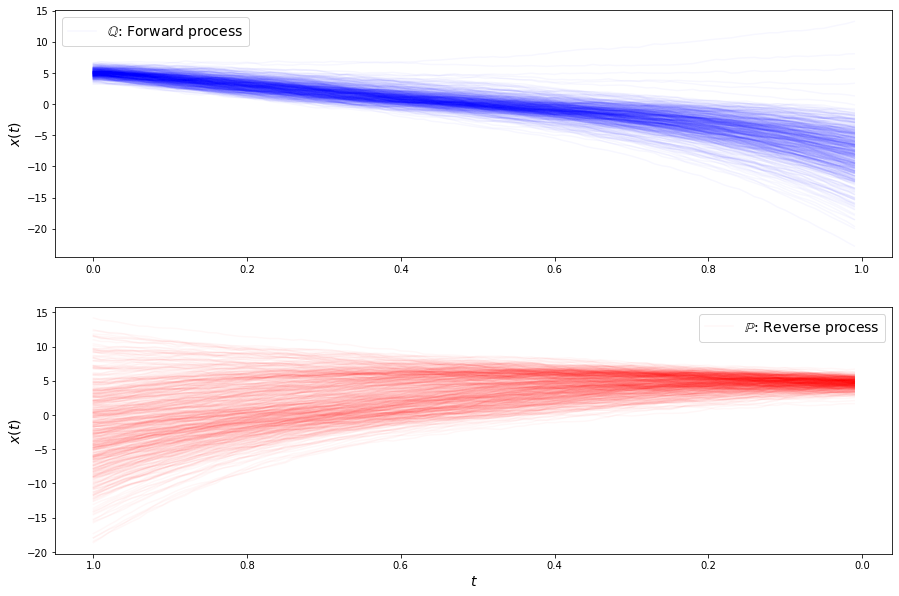

loss b 4.922956943511963
loss b 5.528069496154785
loss b 4.897304058074951
loss b 4.819269180297852
loss b 4.643293380737305
loss b 4.3728718757629395
loss b 4.6017656326293945
loss b 4.57326078414917
loss b 5.138537883758545
loss b 4.459358215332031
loss b 4.704710960388184
loss b 4.456607341766357
loss b 4.521993637084961
loss b 4.768762111663818
loss b 4.664339542388916
loss b 4.690425872802734
loss b 4.912891864776611
loss b 4.451016902923584
loss b 4.618773460388184
loss b 4.347902774810791
loss b 4.79132604598999
loss b 4.686956882476807
loss f 3.3937485218048096
loss f 3.4197068214416504
loss f 3.3881773948669434
loss f 3.332648992538452
loss f 3.3494255542755127
loss f 3.4257423877716064
loss f 3.3652944564819336
loss f 3.4481194019317627
loss f 3.4246294498443604
loss f 3.3813560009002686
loss f 3.385596990585327
loss f 3.2816529273986816
loss f 3.3355700969696045
loss f 3.28460955619812
loss f 3.4305806159973145
loss f 3.3271408081054688
loss f 3.392832040786743
loss f 3.2560

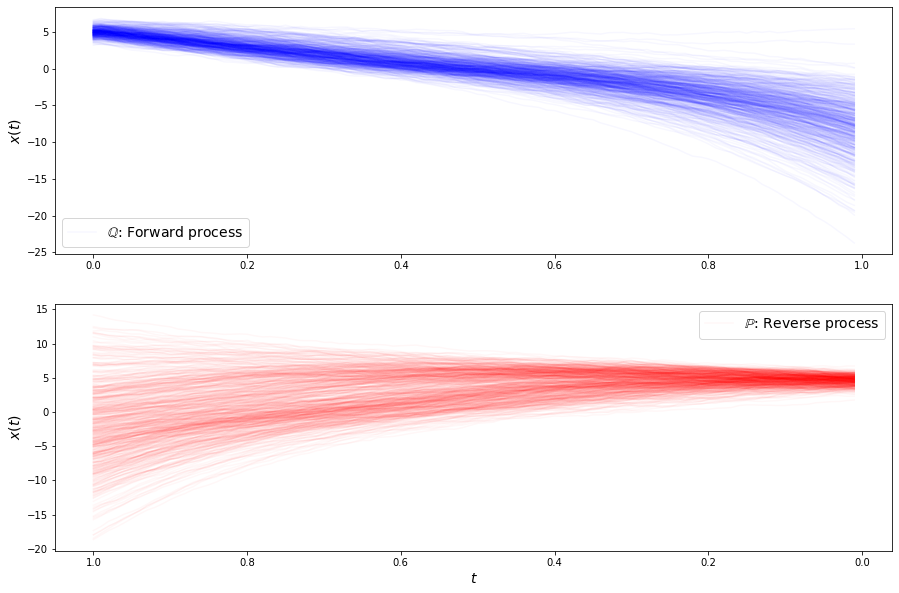

loss b 4.627626895904541
loss b 4.737534999847412
loss b 4.4314751625061035
loss b 4.742136001586914
loss b 4.87060022354126
loss b 5.143868923187256
loss b 4.836368083953857
loss b 4.787451267242432
loss b 4.31081485748291
loss b 4.463559150695801
loss b 4.523036956787109
loss b 4.924095153808594
loss b 4.546937942504883
loss b 4.426963806152344
loss b 4.5598249435424805
loss b 4.626553058624268
loss b 4.961010932922363
loss b 5.706978797912598
loss b 4.550572872161865
loss b 4.483908653259277
loss b 4.657792568206787
loss b 4.965977191925049
loss f 3.288145065307617
loss f 3.483433485031128
loss f 3.3513734340667725
loss f 3.3796334266662598
loss f 3.4714248180389404
loss f 3.245779037475586
loss f 3.4188060760498047
loss f 3.334672689437866
loss f 3.3365604877471924
loss f 3.3123486042022705
loss f 3.2845420837402344
loss f 3.3656582832336426
loss f 3.4243409633636475
loss f 3.417607069015503
loss f 3.419203281402588
loss f 3.4540905952453613
loss f 3.3320870399475098
loss f 3.32140

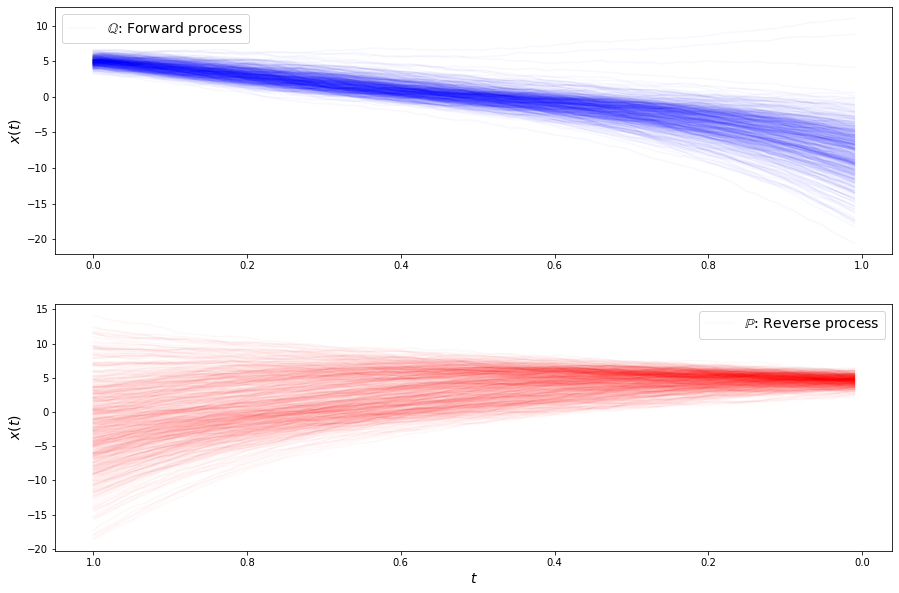

loss b 4.922176837921143
loss b 4.7344489097595215
loss b 4.891394138336182
loss b 5.478338718414307
loss b 4.938142776489258
loss b 4.861760139465332
loss b 4.870809078216553
loss b 4.949971675872803
loss b 4.744283676147461
loss b 4.550358772277832
loss b 4.833001613616943
loss b 4.8847198486328125
loss b 4.529284954071045
loss b 4.650979995727539
loss b 4.760985851287842
loss b 4.6694560050964355
loss b 4.721926212310791
loss b 4.850036144256592
loss b 4.783357620239258
loss b 4.7449951171875
loss b 4.923277854919434
loss b 5.472227096557617
loss f 3.5665061473846436
loss f 3.2852237224578857
loss f 3.350276470184326
loss f 3.3880982398986816
loss f 3.396156072616577
loss f 3.322591781616211
loss f 3.3370823860168457
loss f 3.264880895614624
loss f 3.4406800270080566
loss f 3.333571434020996
loss f 3.289421558380127
loss f 3.3181984424591064
loss f 3.3575921058654785
loss f 3.2329790592193604
loss f 3.4201319217681885
loss f 3.4356918334960938
loss f 3.3690929412841797
loss f 3.2922

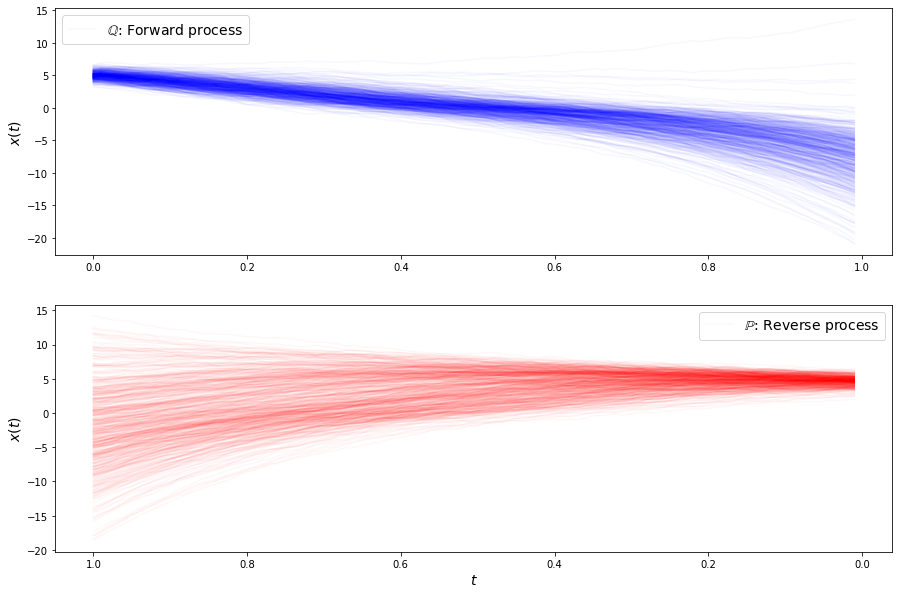

loss b 5.717739105224609
loss b 4.792953968048096
loss b 4.562512397766113
loss b 4.653235912322998
loss b 4.774454116821289
loss b 5.336173057556152
loss b 5.358206272125244
loss b 4.645303726196289
loss b 4.705458164215088
loss b 4.317249298095703
loss b 5.382939338684082
loss b 4.297325134277344
loss b 4.555576801300049
loss b 4.733336448669434
loss b 5.011853218078613
loss b 4.696486949920654
loss b 4.716003894805908
loss b 4.9882683753967285
loss b 4.6655426025390625
loss b 4.661968231201172
loss b 4.432028770446777
loss b 4.391491413116455
loss f 3.4088668823242188
loss f 3.401017427444458
loss f 3.4190359115600586
loss f 3.3335020542144775
loss f 3.5705859661102295
loss f 3.3783905506134033
loss f 3.3892908096313477
loss f 3.4136836528778076
loss f 3.364234447479248
loss f 3.4203808307647705
loss f 3.4192636013031006
loss f 3.394883632659912
loss f 3.486462116241455
loss f 3.4102015495300293
loss f 3.4423599243164062
loss f 3.479020595550537
loss f 3.385082960128784
loss f 3.462

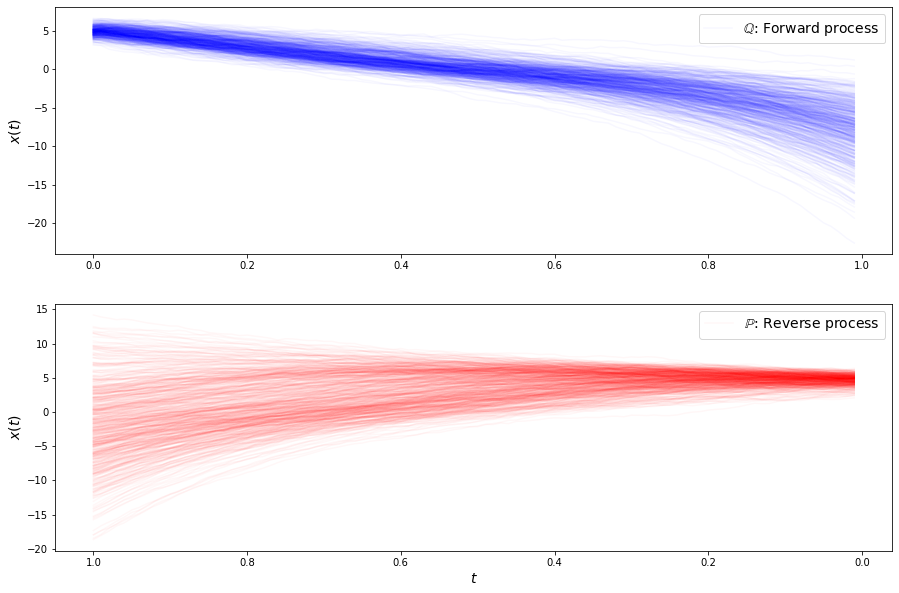

loss b 4.530755996704102
loss b 4.752912521362305
loss b 4.605978488922119
loss b 4.855973720550537
loss b 5.19332218170166
loss b 4.5967020988464355
loss b 4.824626922607422
loss b 4.946322441101074


In [ ]:
c.fit(1900, 22, plot=True)

In [ ]:
plt.plot(c.loss_f)
plt.show()
plt.plot(c.loss_b)

In [ ]:
bb = lambda X, theta: -c.b_backward(X, theta)
t, Xts = c.sde_solver(X0=X1,dt=c.dt,  theta=c.theta_f,  beta=c.sigma, alfa=c.b_forward, N=c.number_time_steps)
t_, Xts_ = c.sde_solver(X0=X2, dt=c.dt,  theta=c.theta_b,  beta=c.sigma, alfa=bb, N=c.number_time_steps)

In [ ]:
fn = 14
fig, axs = plt.subplots(2,1,  sharey=False, figsize=(15,10))
axs[1].set_xlabel("$t$", fontsize=fn)
axs[1].set_ylabel("$x(t)$", fontsize=fn)
axs[0].set_ylabel("$x(t)$", fontsize=fn)

tt = axs[1].get_xticks()
axs[1].set_xticks(tt.flatten() )
axs[1].set_xticklabels(list(map (lambda x: '{0:.1f}'.format((x)), tt))[::-1])

for i in range(n):
    label = "$\mathbb{Q}$: Forward process" if i == 0 else None
    axs[0].plot(t.flatten(), Xts[i,...].flatten(), 'b', alpha=0.03,  label=label)


for i in range(n):
    label = "$\mathbb{P}$: Reverse process" if i == 0 else None
    axs[1].plot(t_.flatten(), Xts_[i,...].flatten(), 'r', alpha=0.03, label=label)
    
axs[1].legend(fontsize=fn)
axs[0].legend(fontsize=fn)

plt.savefig("pig_0")

In [38]:
list(map (lambda x: '{0:.2f}'.format((x)), tt))[::-1]

['0.00', '0.20', '0.40', '0.60', '0.80', '1.00']

In [ ]:
batch_terminal_empirical_f = next(c.data_stream(forward=True))

In [ ]:
xx = np.linspace(-10, 10).reshape(-1,1)

kd  = np.exp(log_kde_pdf_per_point(xx, batch_terminal_empirical_f, c.H_0))
plt.plot(xx, kd)
plt.plot(batch_terminal_empirical_f , [0] * len(batch_terminal_empirical_f), ".")

In [ ]:
batch_terminal_empirical_b = next(c.data_stream(False))

In [ ]:
xx = np.linspace(-10, 10).reshape(-1,1)

kd_b  = np.exp(log_kde_pdf_per_point(xx, batch_terminal_empirical_b, c.H_1))
plt.plot(xx, kd_b)
plt.plot(batch_terminal_empirical_b , [0] * len(batch_terminal_empirical_b), ".")

In [ ]:
    def plot_trajectories(self):
        bb = lambda X, theta: -self.b_backward(X, theta)
        t, Xts = c.sde_solver(
            X0=self.X1,dt=self.dt,  theta=self.theta_f,
            beta=self.sigma, alfa=self.b_forward, N=self.number_time_steps
        )
        t_, Xts_ = c.sde_solver(
            X0=self.X2, dt=self.dt,  theta=self.theta_b,
            beta=self.sigma, alfa=bb, N=self.number_time_steps
        )
        
        fn = 14
        fig, axs = plt.subplots(2,1,  sharey=False, figsize=(15,10))
        axs[1].set_xlabel("$t$", fontsize=fn)
        axs[1].set_ylabel("$x(t)$", fontsize=fn)
        axs[0].set_ylabel("$x(t)$", fontsize=fn)

        tt = axs[1].get_xticks()
        axs[1].set_xticks(tt.flatten() )
        axs[1].set_xticklabels(list(map (lambda x: '{0:.1f}'.format((x)), tt))[::-1])

        for i in range(n):
            label = "$\mathbb{Q}$: Forward process" if i == 0 else None
            axs[0].plot(t.flatten(), Xts[i,...].flatten(), 'b', alpha=0.03,  label=label)


        for i in range(n):
            label = "$\mathbb{P}$: Reverse process" if i == 0 else None
            axs[1].plot(t_.flatten(), Xts_[i,...].flatten(), 'r', alpha=0.03, label=label)

        axs[1].legend(fontsize=fn)
        axs[0].legend(fontsize=fn)

        plt.show()    